## Analyzing Air Pollution Exposure in Affordable Housing Programs: A Data-Driven Approach to Environmental Risk


## Project Description

The goal of this capstone project is to assess the exposure of federally assisted affordable housing to air pollution using statistical analysis and machine learning. This project examines whether the current housing policies are effective in mitigating environmental risk associated with air pollution. By analyzing housing data such as LIHTC(Low-Income Housing Tax Credit) and Public Housing properties and merging with air quality data(for example, PM2.5 and Ozone) the study aims to evaluate the relationship between affordable housing locations and pollution exposure. Additionally this project will explore the socioeconomic background of residents, investigating whether vulnerable populations are disproportionately exposed to higher levels of pollution. The results of this analysis will provide insights into the effectiveness of housing policies in protecting residents from environmental hazards and guide future recommendations.



### Initial Data Collection and Preparation
- Selected relevant datasets: National Housing Preservation Database (NHPD) and EJ Screen data from the EPA.
- Merged the datasets by Census Tract to integrate housing and air quality data.
- Filtered key variables for Low-Income Housing Tax Credit (LIHTC) and Public Housing properties.

### Exploratory Data Analysis
- Conducted correlation analysis to examine relationships between variables.
- Generated histograms and heatmaps to understand data distribution and variable interactions within LIHTC and Public Housing datasets.

### Statistical Analysis
- Applied EPA standard pollution thresholds to categorize exposure levels for PM2.5 and Ozone.
- Conducted statistical tests to compare average pollution levels between LIHTC and Public Housing properties.

### Regression Modeling
- Performed Linear Regression to explore relationships between pollution levels and socioeconomic factors.
- Applied Lasso Regression and calculated Variance Inflation Factors (VIF) for multicollinearity insights.
- Implemented Random Forest Regression, achieving improved R-squared values on LIHTC data for both PM2.5 and Ozone.
- Visulize Feature Importances using Shap.

### Machine Learning Models
*Ensemble Classifiers:*

- Logistic Regression
- Gradient Boosting
- Random Forest
- Extra Tree
- Stacking Classifier using Gradient Boost, Random Forest and Extra Trees
- 
*Performance Measures:*

Testing and Validation Accuracies
Classification Report
Confusion Matrices
ROC Curves

### Spatial Analysis
- Developed interactive maps in ArcGIS Pro to visualize pollution exposure levels across geographic areas with Public Housing and LIHTC properties.
- Refined map accuracy by correcting rounding issues in latitude and longitude coordinates for precise location-based exposure insights.


## Tools Used
- **Python:** Data processing, analysis, and model training.
- **ArcGIS Pro:** Spatial analysis and interactive map visualization.
- **Seaborn & Matplotlib:** Data visualization for exploratory analysis and model evaluation.

---

This outline summarizes the steps taken to assess environmental risks in affordable housing, with analysis outcomes providing actionable insights for policy evaluation.


**Importing Libraries:**
- Importing and Installing Libraries like pandas, numpy, seaborn, and folium for data manipulation, visualization, and mapping.

In [2]:
import pandas as pd
import numpy as np
import matplotlib as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import plotly.express as px
from sklearn.linear_model import LinearRegression
from scipy import stats
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Lasso
from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import RandomForestRegressor
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
import shap

**NHPD Data Preprocessing:**

- Loading the dataset NHPD dataset
- Printing a summary of the dataset's structure, and a subset of active LIHTC properties is extracted using filters on the on the LIHTC_1_Status and LIHTC_2_Status columns.
- Printing a summary of the dataset's structure, and a subset of active Public Housing properties is extracted using filters on the on the PH_1_Status columns.
- Comparing the LIHTC and Public Housing Properties by State

In [4]:
# Load your dataset
df = pd.read_csv("C:/Users/19147/Downloads/Active and Inconclusive Properties v2.csv")

C:\Users\19147\AppData\Local\Temp\ipykernel_9200\984527142.py:2: DtypeWarning: Columns (11,20,21,46,47,48,49,50,51,54,55,56,57,58,59,60,63,68,69,70,71,74,76,77,78,79,86,87,88,89,90,92,104,105,106,107,110,112,113,114,115,118,122,123,124,125,126,128,129,130,131,132,133,134,136,137,142,143,144,145,148,150,151,152,153,161,162,163,164,169,170,171,172,180,181,182,183,185,188,189,190,191,193,198,199,200,201,205,206,207,208,209,213,217,218,219,220,221,223,224,225,226,227,228,229,231,232,236,237,239,240,245,246,248,249) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv("C:/Users/19147/Downloads/Active and Inconclusive Properties v2.csv")


In [5]:
import pandas as pd

df = pd.read_csv("C:/Users/19147/Downloads/Active and Inconclusive Properties v2.csv", low_memory=False)


In [4]:
# Display the first few rows and summary of the dataset
df_info = df.info()
df_head = df.head()

df_info, df_head

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80911 entries, 0 to 80910
Columns: 252 entries, NHPDPropertyID to OldNHPDPropertyID
dtypes: float64(74), int64(41), object(137)
memory usage: 155.6+ MB


(None,
    NHPDPropertyID                        PropertyName     PropertyAddress  \
 0         1000072   SUBSIDIZED HOUSING CORPORATION 65     1356 Ashport St   
 1         1001300               CHRISTOPHER HOMES INC  17 Christopher Cir   
 2         1000049    SUBSIDIZED HOUSING CORPORATION 4     232 S Avenue 56   
 3         1044315           AMBER WOODS COOPERATIVE V   10202 John Jay Dr   
 4         1018122  SUBSIDIZED HOUSING CORPORATION 116       247 E 84th Pl   
 
            City State         Zip  CBSACode                       CBSAType  \
 0        Pomona    CA  91768-2801   31080.0  Metropolitan Statistical Area   
 1        Searcy    AR  72143-4769   42620.0  Micropolitan Statistical Area   
 2   Los Angeles    CA  90042-4610   31080.0  Metropolitan Statistical Area   
 3  Indianapolis    IN  46235-2327   26900.0  Metropolitan Statistical Area   
 4   Los Angeles    CA  90003-3027   31080.0  Metropolitan Statistical Area   
 
         County  CountyCode  ...  NumberActiveM

In [5]:
# Filter for active LIHTC properties using the correct capitalization for "Active"
active_lihtc_df = df[(df['LIHTC_1_Status'] == 'Active') | (df['LIHTC_2_Status'] == 'Active')]

# Display the number of active LIHTC properties and the first few rows
active_lihtc_count = active_lihtc_df.shape[0]
active_lihtc_head = active_lihtc_df.head()

active_lihtc_count, active_lihtc_head


(32816,
     NHPDPropertyID                  PropertyName   PropertyAddress  \
 10         1022619                 MARIGOLD HILL    910 E Broad St   
 15         1070254       TRIBOROUGH PRESERVATION    510 E 156th St   
 18         1041726  PAUL G STEWART III TOWNHOMES     400 E 41st St   
 20         1000820       NORTHSIDE RESIDENCES II  1300 Brighton Rd   
 35         1047988                    BRUCECREST  1709 Clements Dr   
 
           City State         Zip  CBSACode                       CBSAType  \
 10    Columbus    OH  43205-1150   18140.0  Metropolitan Statistical Area   
 15       Bronx    NY  10455-1416   35620.0  Metropolitan Statistical Area   
 18     Chicago    IL  60653-3071   16980.0  Metropolitan Statistical Area   
 20  Pittsburgh    PA  15233-1630   38300.0  Metropolitan Statistical Area   
 35     Ashland    KY  41101-2409   26580.0  Metropolitan Statistical Area   
 
        County  CountyCode  ...  NumberActiveMR NumberInconclusiveMR  \
 10   Franklin     390

In [6]:
# Filter for active Public Housing properties based on the PH_1_Status column
active_ph_df = df[(df['PH_1_Status'] == 'Active')|(df['PH_2_Status'] == 'Active')]

# Display the number of active Public Housing properties and the first few rows
active_ph_count = active_ph_df.shape[0]
active_ph_head = active_ph_df.head()

active_ph_count, active_ph_head


(6038,
       NHPDPropertyID            PropertyName      PropertyAddress       City  \
 113          1092724   MERRITT MCGOWAN MANOR  1200 N Tennessee St   McKinney   
 701          1023425           ALLENTOWN NSA      1339 W Allen St  Allentown   
 702          1070936      STUYVESANT CHARTER       101 Sheehan Ct   Kingston   
 2914         1059535        ROLLA APARTMENTS    1101 McCutchen Rd      Rolla   
 3526         1089125  EAST POINTE APARTMENTS     504 Daugherty St    Jackson   
 
      State         Zip  CBSACode                       CBSAType   County  \
 113     TX  75069-2161   19100.0  Metropolitan Statistical Area   Collin   
 701     PA  18102-2152   10900.0  Metropolitan Statistical Area   Lehigh   
 702     NY  12401-2213   28740.0  Metropolitan Statistical Area   Ulster   
 2914    MO  65401-2631   40620.0  Micropolitan Statistical Area   Phelps   
 3526    TN  38301-7280   27180.0  Metropolitan Statistical Area  Madison   
 
       CountyCode  ...  NumberActiveMR Nu

In [7]:
print(active_lihtc_count, active_ph_count)

32816 6038


**EJScreen Data Preprocessing:**

- Loading the EJScreen dataset
- ID column in EJScreen dataset is CensusTract(State 2 digits, County 3 digits and Census Tract 6 digits)
- Renaming ID Column to CensusTract to merge the two datasets.
- Printing a summary of the dataset's structure.
- Merging the LIHTC and Public Housing data with EJScreen dataset using CensusTract.
- Removing Missing values.

In [9]:
# Load the air quality dataset
air_quality_df = pd.read_csv("C:/MS DSE/Capstone Project Plan/EJScreen_2024_Tract_with_AS_CNMI_GU_VI.csv")
# Rename the 'ID' column to 'CensusTract'
air_quality_df.rename(columns={'ID': 'CensusTract'}, inplace=True)
# Display the first few rows and summary of the air quality dataset
print(air_quality_df.info())
print(air_quality_df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86082 entries, 0 to 86081
Columns: 230 entries, OID_ to Shape_Area
dtypes: float64(174), int64(3), object(53)
memory usage: 151.1+ MB
None
    OID_  CensusTract   STATE_NAME ST_ABBREV                CNTY_NAME  REGION  \
0  14779   9110400101  CONNECTICUT        CT  Capitol Planning Region       1   
1  14780   9110400102  CONNECTICUT        CT  Capitol Planning Region       1   
2  14781   9110400200  CONNECTICUT        CT  Capitol Planning Region       1   
3  14782   9110400300  CONNECTICUT        CT  Capitol Planning Region       1   
4  14783   9110415300  CONNECTICUT        CT  Capitol Planning Region       1   

   ACSTOTPOP  ACSIPOVBAS  ACSEDUCBAS  ACSTOTHH  ...  T_D2_DWATER  T_D5_DWATER  \
0     2945.0      2916.0      2231.0    1385.0  ...      71 %ile      74 %ile   
1     4266.0      4266.0      2996.0    1806.0  ...      72 %ile      71 %ile   
2     6250.0      6213.0      4267.0    2196.0  ...      70 %ile      72 %ile   


In [10]:
# List all column names in the air quality dataset
print(air_quality_df.columns)

Index(['OID_', 'CensusTract', 'STATE_NAME', 'ST_ABBREV', 'CNTY_NAME', 'REGION',
       'ACSTOTPOP', 'ACSIPOVBAS', 'ACSEDUCBAS', 'ACSTOTHH',
       ...
       'T_D2_DWATER', 'T_D5_DWATER', 'AREALAND', 'AREAWATER', 'NPL_CNT',
       'TSDF_CNT', 'EXCEED_COUNT_80', 'EXCEED_COUNT_80_SUP', 'Shape_Length',
       'Shape_Area'],
      dtype='object', length=230)


In [11]:

# Perform the merge directly on CensusTract

# Merge LIHTC housing data with air quality data on CensusTract
merged_lihtc_df = pd.merge(active_lihtc_df, air_quality_df, on='CensusTract', how='left')

# Merge Public Housing data with air quality data on CensusTract
merged_ph_df = pd.merge(active_ph_df, air_quality_df, on='CensusTract', how='left')

# Display the first few rows of the merged data
print(merged_lihtc_df.head())
print(merged_ph_df.head())


   NHPDPropertyID                  PropertyName   PropertyAddress        City  \
0         1022619                 MARIGOLD HILL    910 E Broad St    Columbus   
1         1070254       TRIBOROUGH PRESERVATION    510 E 156th St       Bronx   
2         1041726  PAUL G STEWART III TOWNHOMES     400 E 41st St     Chicago   
3         1000820       NORTHSIDE RESIDENCES II  1300 Brighton Rd  Pittsburgh   
4         1047988                    BRUCECREST  1709 Clements Dr     Ashland   

  State         Zip  CBSACode                       CBSAType     County  \
0    OH  43205-1150   18140.0  Metropolitan Statistical Area   Franklin   
1    NY  10455-1416   35620.0  Metropolitan Statistical Area      Bronx   
2    IL  60653-3071   16980.0  Metropolitan Statistical Area       Cook   
3    PA  15233-1630   38300.0  Metropolitan Statistical Area  Allegheny   
4    KY  41101-2409   26580.0  Metropolitan Statistical Area       Boyd   

   CountyCode  ...  T_D2_DWATER T_D5_DWATER   AREALAND  AREAWA

In [13]:
# List all column names in the merged LIHTC dataset
print(merged_lihtc_df.columns)

# List all column names in the merged Public Housing dataset
print(merged_ph_df.columns)


Index(['NHPDPropertyID', 'PropertyName', 'PropertyAddress', 'City', 'State',
       'Zip', 'CBSACode', 'CBSAType', 'County', 'CountyCode',
       ...
       'T_D2_DWATER', 'T_D5_DWATER', 'AREALAND', 'AREAWATER', 'NPL_CNT',
       'TSDF_CNT', 'EXCEED_COUNT_80', 'EXCEED_COUNT_80_SUP', 'Shape_Length',
       'Shape_Area'],
      dtype='object', length=481)
Index(['NHPDPropertyID', 'PropertyName', 'PropertyAddress', 'City', 'State',
       'Zip', 'CBSACode', 'CBSAType', 'County', 'CountyCode',
       ...
       'T_D2_DWATER', 'T_D5_DWATER', 'AREALAND', 'AREAWATER', 'NPL_CNT',
       'TSDF_CNT', 'EXCEED_COUNT_80', 'EXCEED_COUNT_80_SUP', 'Shape_Length',
       'Shape_Area'],
      dtype='object', length=481)


In [14]:
# Display columns related to air quality by filtering for common keywords
air_quality_columns = [col for col in merged_lihtc_df.columns if 'PM' in col or 'OZONE' in col or 'NO2' in col or 'RSEI_AIR' in col or 'CO' in col or 'Lead' in col or 'Air' in col]
print("Air Quality Related Columns:\n", air_quality_columns)

# List possible geographic columns in the housing dataset
housing_geo_columns = [col for col in merged_lihtc_df.columns if 'County' in col or 'State' in col or 'Census' in col or 'Zip' in col or 'CBSA' in col or 'Latitude' in col or 'Longitude' in col]
print("Housing Dataset Geographic Columns:\n", housing_geo_columns)

# List possible geographic columns in the air quality dataset
air_quality_geo_columns = [col for col in merged_ph_df.columns if 'County' in col or 'State' in col or 'Census' in col or 'Zip' in col or 'CBSA' in col or 'Latitude' in col or 'Longitude' in col]
print("Air Quality Dataset Geographic Columns:\n", air_quality_geo_columns)


Air Quality Related Columns:
 ['PEOPCOLOR', 'PEOPCOLORPCT', 'LOWINCOME', 'PM25', 'OZONE', 'DSLPM', 'RSEI_AIR', 'NO2', 'D2_PM25', 'D5_PM25', 'D2_OZONE', 'D5_OZONE', 'D2_DSLPM', 'D5_DSLPM', 'D2_RSEI_AIR', 'D5_RSEI_AIR', 'D2_NO2', 'D5_NO2', 'P_PEOPCOLORPCT', 'P_PM25', 'P_OZONE', 'P_DSLPM', 'P_RSEI_AIR', 'P_NO2', 'P_D2_PM25', 'P_D5_PM25', 'P_D2_OZONE', 'P_D5_OZONE', 'P_D2_DSLPM', 'P_D5_DSLPM', 'P_D2_RSEI_AIR', 'P_D5_RSEI_AIR', 'P_D2_NO2', 'P_D5_NO2', 'B_PEOPCOLORPCT', 'B_PM25', 'B_OZONE', 'B_DSLPM', 'B_RSEI_AIR', 'B_NO2', 'B_D2_PM25', 'B_D5_PM25', 'B_D2_OZONE', 'B_D5_OZONE', 'B_D2_DSLPM', 'B_D5_DSLPM', 'B_D2_RSEI_AIR', 'B_D5_RSEI_AIR', 'B_D2_NO2', 'B_D5_NO2', 'T_PEOPCOLORPCT', 'T_PM25', 'T_OZONE', 'T_DSLPM', 'T_RSEI_AIR', 'T_NO2', 'T_D2_PM25', 'T_D5_PM25', 'T_D2_OZONE', 'T_D5_OZONE', 'T_D2_DSLPM', 'T_D5_DSLPM', 'T_D2_RSEI_AIR', 'T_D5_RSEI_AIR', 'T_D2_NO2', 'T_D5_NO2', 'EXCEED_COUNT_80', 'EXCEED_COUNT_80_SUP']
Housing Dataset Geographic Columns:
 ['State', 'Zip', 'CBSACode', 'CBSAType', 'Co

In [16]:
# Check for NaN values in CensusTract column
print("Number of NaN values in CensusTract (LIHTC):", merged_lihtc_df['CensusTract'].isna().sum())
print("Number of NaN values in CensusTract (Public Housing):", merged_ph_df['CensusTract'].isna().sum())

# Drop rows with NaN values in CensusTract
cleaned_lihtc_df = merged_lihtc_df.dropna(subset=['CensusTract'])
cleaned_ph_df = merged_ph_df.dropna(subset=['CensusTract'])

# Check for NaN in air quality and demographic columns
print(cleaned_lihtc_df[['PM25', 'OZONE','NO2','DSLPM', 'PEOPCOLOR', 'LOWINCOME','City', 'State','County','Latitude', 'Longitude', 'CensusTract']].isna().sum())
print(cleaned_ph_df[['PM25', 'OZONE','NO2','DSLPM', 'PEOPCOLOR', 'LOWINCOME','City', 'State','County','Latitude', 'Longitude','CensusTract']].isna().sum())


Number of NaN values in CensusTract (LIHTC): 8
Number of NaN values in CensusTract (Public Housing): 0
PM25           619
OZONE          619
NO2            426
DSLPM          523
PEOPCOLOR      426
LOWINCOME      426
City             0
State            0
County           0
Latitude         0
Longitude        0
CensusTract      0
dtype: int64
PM25           160
OZONE          160
NO2            131
DSLPM          144
PEOPCOLOR      131
LOWINCOME      131
City             0
State            0
County           6
Latitude         0
Longitude        0
CensusTract      0
dtype: int64


In [21]:
print(len(merged_lihtc_df))
print(len(merged_ph_df))

32816
6038


In [22]:
# Drop rows with NaN values in CensusTract (for LIHTC dataset)
cleaned_lihtc_df = merged_lihtc_df.dropna(subset=['CensusTract'])
cleaned_ph_df = merged_ph_df.dropna(subset=['CensusTract'])

In [23]:
print(len(cleaned_lihtc_df))
print(len(cleaned_ph_df))

32808
6038


In [24]:

# For LIHTC
print(cleaned_lihtc_df[['PM25', 'OZONE','DSLPM', 'PTRAF', 'PEOPCOLOR','PEOPCOLORPCT', 'LOWINCOME','LOWINCPCT','UNEMPLOYED', 'UNEMPPCT','UNDER5','UNDER5PCT','OVER64','OVER64PCT','LIFEEXPPCT','P_PM25','P_OZONE','P_DSLPM','P_PTRAF','City', 'State','County','CBSAType','CBSACode','Latitude', 'Longitude', 'CensusTract']].isna().sum())

# For Public Housing
print(cleaned_ph_df[['PM25', 'OZONE','DSLPM', 'PTRAF', 'PEOPCOLOR','PEOPCOLORPCT', 'LOWINCOME','LOWINCPCT','UNEMPLOYED', 'UNEMPPCT','UNDER5','UNDER5PCT','OVER64','OVER64PCT','LIFEEXPPCT','P_PM25','P_OZONE','P_DSLPM','P_PTRAF','City', 'State','CBSAType','CBSACode','County','Latitude', 'Longitude', 'CensusTract' ]].isna().sum())


PM25             619
OZONE            619
DSLPM            523
PTRAF            427
PEOPCOLOR        426
PEOPCOLORPCT     426
LOWINCOME        426
LOWINCPCT        426
UNEMPLOYED       426
UNEMPPCT         426
UNDER5           426
UNDER5PCT        426
OVER64           426
OVER64PCT        426
LIFEEXPPCT      2300
P_PM25           619
P_OZONE          619
P_DSLPM          523
P_PTRAF          427
City               0
State              0
County             0
CBSAType        3973
CBSACode        2543
Latitude           0
Longitude          0
CensusTract        0
dtype: int64
PM25            160
OZONE           160
DSLPM           144
PTRAF           131
PEOPCOLOR       131
PEOPCOLORPCT    131
LOWINCOME       131
LOWINCPCT       131
UNEMPLOYED      131
UNEMPPCT        131
UNDER5          131
UNDER5PCT       131
OVER64          131
OVER64PCT       131
LIFEEXPPCT      404
P_PM25          160
P_OZONE         160
P_DSLPM         144
P_PTRAF         131
City              0
State             0


In [25]:
# Drop rows with missing air quality values in LIHTC dataset
lihtc_df_New = cleaned_lihtc_df.dropna(subset=['PM25', 'OZONE', 'PEOPCOLOR', 'PEOPCOLORPCT', 'LOWINCOME', 
                                               'LOWINCPCT', 'UNEMPLOYED', 'UNEMPPCT', 'UNDER5', 'UNDER5PCT', 'OVER64', 
                                               'OVER64PCT', 'LIFEEXPPCT', 'P_PM25', 'P_OZONE', 
                                               'City', 'State', 'County', 'CensusTract'])

# Drop rows with missing air quality values in Public Housing dataset
ph_df_New = cleaned_ph_df.dropna(subset=['PM25', 'OZONE','PEOPCOLOR', 'PEOPCOLORPCT', 'LOWINCOME', 
                                         'LOWINCPCT', 'UNEMPLOYED', 'UNEMPPCT', 'UNDER5', 'UNDER5PCT', 'OVER64', 
                                         'OVER64PCT', 'LIFEEXPPCT', 'P_PM25', 'P_OZONE', 
                                         'City', 'State', 'County', 'CensusTract'])

# Check the number of remaining rows
print(f"Remaining LIHTC rows: {len(lihtc_df_New)}")
print(f"Remaining Public Housing rows: {len(ph_df_New)}")


Remaining LIHTC rows: 30321
Remaining Public Housing rows: 5601


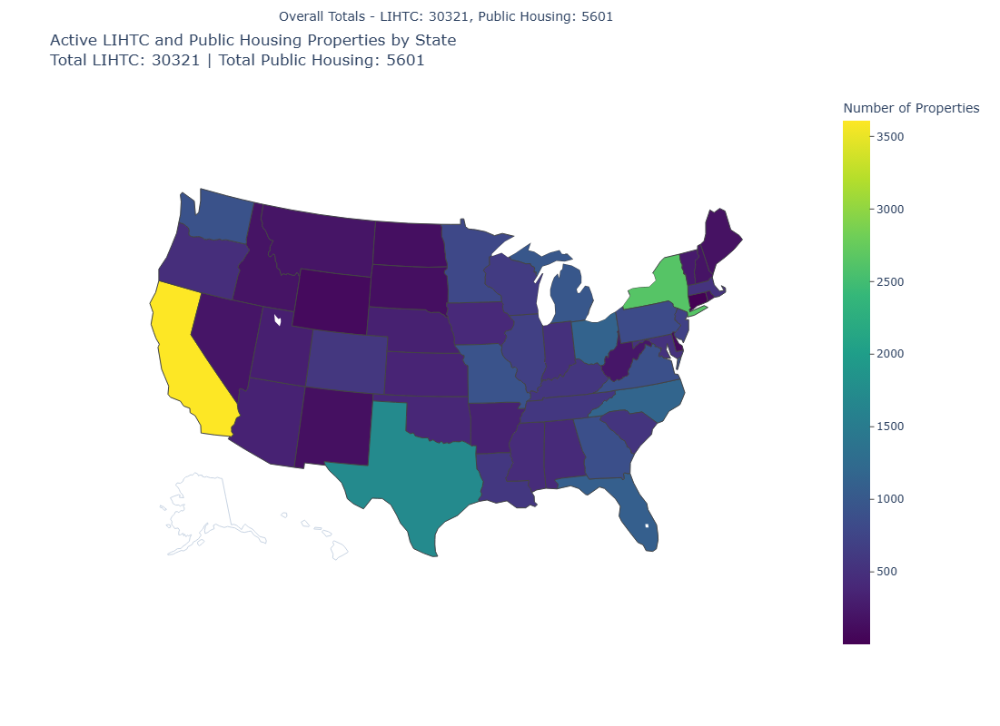

In [28]:
import plotly.express as px
import pandas as pd

# Aggregate counts by state
lihtc_counts = lihtc_df_New.groupby('State').size().reset_index(name='LIHTC')
ph_counts = ph_df_New.groupby('State').size().reset_index(name='Public Housing')

# Merge LIHTC and Public Housing counts into a single DataFrame
state_counts_df = pd.merge(lihtc_counts, ph_counts, on='State', how='outer').fillna(0)

# Calculate total counts for LIHTC and Public Housing
total_lihtc = state_counts_df['LIHTC'].sum()
total_ph = state_counts_df['Public Housing'].sum()

# Create a single Plotly choropleth map with hover data
fig = px.choropleth(
    state_counts_df,
    locations="State",
    locationmode="USA-states",
    color="LIHTC",  # Use LIHTC as the main color scale (or switch with Public Housing if preferred)
    scope="usa",
    color_continuous_scale="viridis",
    labels={"LIHTC": "LIHTC Properties Count", "Public Housing": "Public Housing Count"},
    title=f"Active LIHTC and Public Housing Properties by State<br>Total LIHTC: {total_lihtc} | Total Public Housing: {total_ph}"
)

# Add Public Housing count as a hover data element
fig.update_traces(
    hovertemplate="<b>%{location}</b><br>LIHTC: %{z}<br>Public Housing: %{customdata[0]}"
)

# Customize the hover data to include Public Housing counts
fig.update_traces(customdata=state_counts_df[['Public Housing']].values)

# Adjust map layout for larger size
fig.update_layout(
    width=1200,   # Increase width
    height=800,   # Increase height
    template="plotly_white",
    coloraxis_colorbar=dict(
        title="Number of Properties",
        ticks="outside"
    )
)

# Add an annotation with total counts at the top
fig.add_annotation(
    text=f"Overall Totals - LIHTC: {total_lihtc}, Public Housing: {total_ph}",
    xref="paper", yref="paper",
    x=0.5, y=1.15, showarrow=False,
    font=dict(size=14)
)

# Show the map
fig.show()


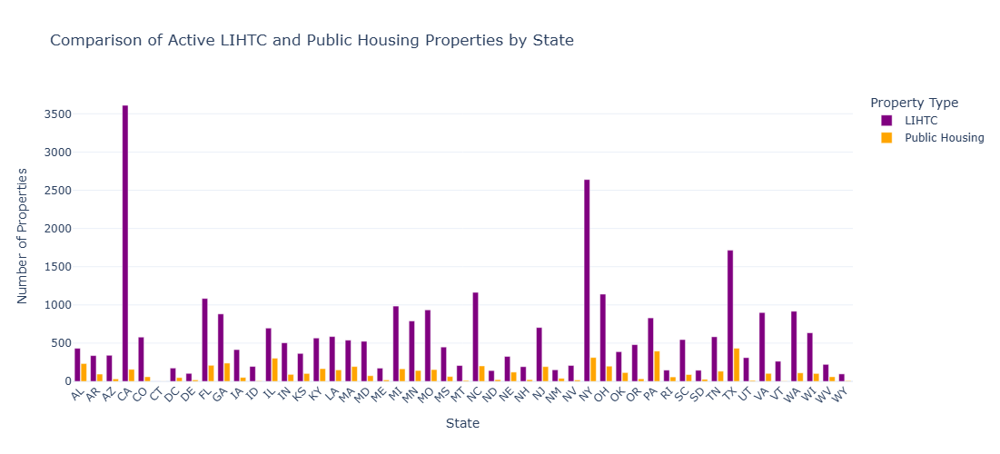

In [27]:

# Creating an interactive bar plot with custom colors and tilted x-axis labels
fig = px.bar(
    state_counts_df,
     x="State",
    y=["LIHTC", "Public Housing"],
    labels={'value': 'Number of Properties', 'index': 'State'},
    barmode='group',
    title='Comparison of Active LIHTC and Public Housing Properties by State',
    color_discrete_map={'LIHTC': 'purple', 'Public Housing': 'orange'}  # Customize the colors
)

# Customize the layout
fig.update_layout(
    xaxis_title='State',
    yaxis_title='Number of Properties',
    legend_title='Property Type',
    bargap=0.2,
    bargroupgap=0.1,
    template='plotly_white',
    width=950,
    height=500
)

# Tilt the x-axis labels for better readability
fig.update_xaxes(tickangle= -45)

# Show the interactive plot
fig.show()

1. Exploratory Data Analysis (EDA)
Now that you have the cleaned data, perform basic exploratory analysis on the air quality variables across the LIHTC and Public Housing properties.

Descriptive Statistics:
Calculate the summary statistics for PM2.5, Ozone etc.

In [48]:
# Define the variables of interest
variables = ['PM25', 'OZONE', 'PEOPCOLOR', 'PEOPCOLORPCT', 'LOWINCOME', 
                                               'LOWINCPCT', 'UNEMPLOYED', 'UNEMPPCT', 'UNDER5', 'UNDER5PCT', 'OVER64', 
                                               'OVER64PCT', 'LIFEEXPPCT', 'P_PM25', 'P_OZONE',]

# Descriptive statistics for LIHTC properties
lihtc_stats = lihtc_df_New[variables].describe()

# Descriptive statistics for Public Housing properties
ph_stats = ph_df_New[variables].describe()

# Combine the descriptive statistics into a single DataFrame
combined_stats = pd.concat([lihtc_stats, ph_stats], axis=1, keys=['LIHTC','Public Housing'])

# Display the combined descriptive statistics in a proper table format
print(combined_stats)

# If you want to output it in a better visual format (such as Jupyter Notebook or export to a file):
combined_stats.style.set_caption("Descriptive Statistics for LIHTC and Public Housing Properties")


              LIHTC                                                          \
               PM25         OZONE     PEOPCOLOR  PEOPCOLORPCT     LOWINCOME   
count  30321.000000  30321.000000  30321.000000  30321.000000  30321.000000   
mean       8.456390     60.841998   2165.114805      0.508195   1633.013390   
std        2.196331      8.676016   1693.311110      0.312650    900.118448   
min        3.558923     38.788680      0.000000      0.000000      8.000000   
25%        7.204907     54.432660    824.000000      0.218391    996.000000   
50%        8.158308     59.414840   1768.000000      0.486400   1463.000000   
75%        9.011974     65.269700   3108.000000      0.806977   2088.000000   
max       25.189071    112.395500  13071.000000      1.000000   7699.000000   

                                                                             \
          LOWINCPCT    UNEMPLOYED      UNEMPPCT        UNDER5     UNDER5PCT   
count  30321.000000  30321.000000  30321.000000  30

In [50]:


# Define the variables of interest
variables = ['PM25', 'OZONE', 'PEOPCOLOR', 'PEOPCOLORPCT', 'LOWINCOME', 
                                               'LOWINCPCT', 'UNEMPLOYED', 'UNEMPPCT', 'UNDER5', 'UNDER5PCT', 'OVER64', 
                                               'OVER64PCT', 'LIFEEXPPCT', 'P_PM25', 'P_OZONE']

# Extract mean and standard deviation for LIHTC properties
lihtc_mean_std = lihtc_df_New[variables].agg(['mean', 'std']).T  # Transpose to show variables in rows

# Extract mean and standard deviation for Public Housing properties
ph_mean_std = ph_df_New[variables].agg(['mean', 'std']).T  # Transpose to show variables in rows

# Combine the mean and standard deviation into a single DataFrame with multi-level column headers
combined_stats = pd.concat([lihtc_mean_std, ph_mean_std], axis=1, keys=['LIHTC', 'Public Housing'])

# Properly format the column names to show Mean and Standard Deviation in columns for both LIHTC and Public Housing
combined_stats.columns = pd.MultiIndex.from_product([['LIHTC', 'Public Housing'], ['Mean', 'Standard Deviation']])

# Display the combined mean and standard deviation table
print(combined_stats)

# For a nice display in Jupyter Notebook
combined_stats.style.set_caption("Mean and Standard Deviation for LIHTC and Public Housing Properties").format(precision=2)


                    LIHTC                    Public Housing                   
                     Mean Standard Deviation           Mean Standard Deviation
PM25             8.456390           2.196331       7.981317           1.637331
OZONE           60.841998           8.676016      59.141487           6.230069
PEOPCOLOR     2165.114805        1693.311110    1819.304410        1471.332481
PEOPCOLORPCT     0.508195           0.312650       0.501578           0.321528
LOWINCOME     1633.013390         900.118448    1595.100518         833.903699
LOWINCPCT        0.411001           0.180908       0.467451           0.178898
UNEMPLOYED     136.058639         110.267788     123.635601         100.811466
UNEMPPCT         0.070050           0.054819       0.079250           0.062970
UNDER5         265.520003         174.053025     231.593465         152.781953
UNDER5PCT        0.061266           0.030426       0.062365           0.031828
OVER64         658.543485         364.759837     602

Visualizations:
Histograms or Box Plots: Plot histograms or box plots for air quality variables to understand their distribution.

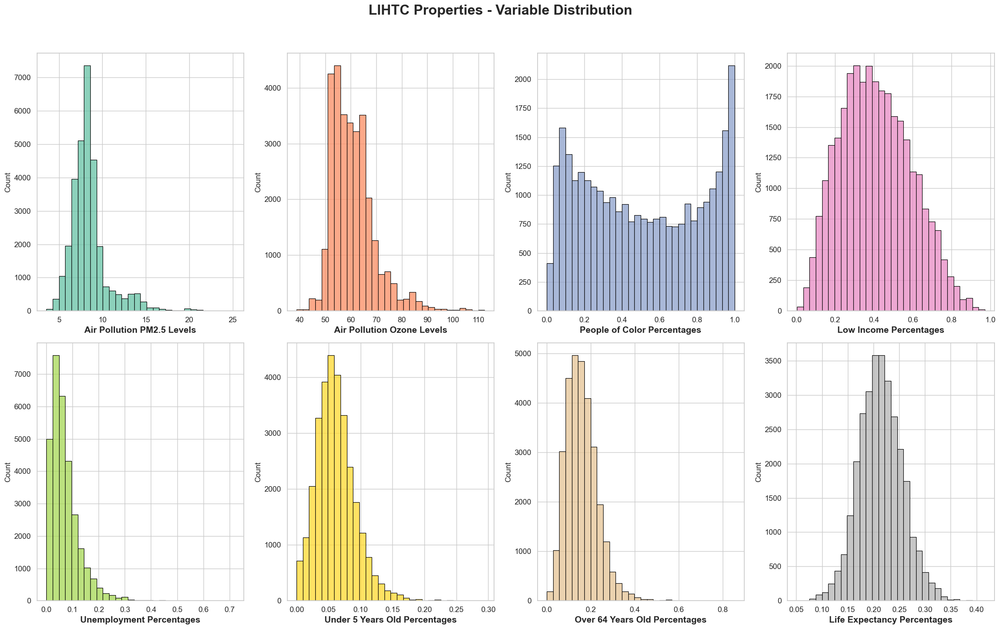

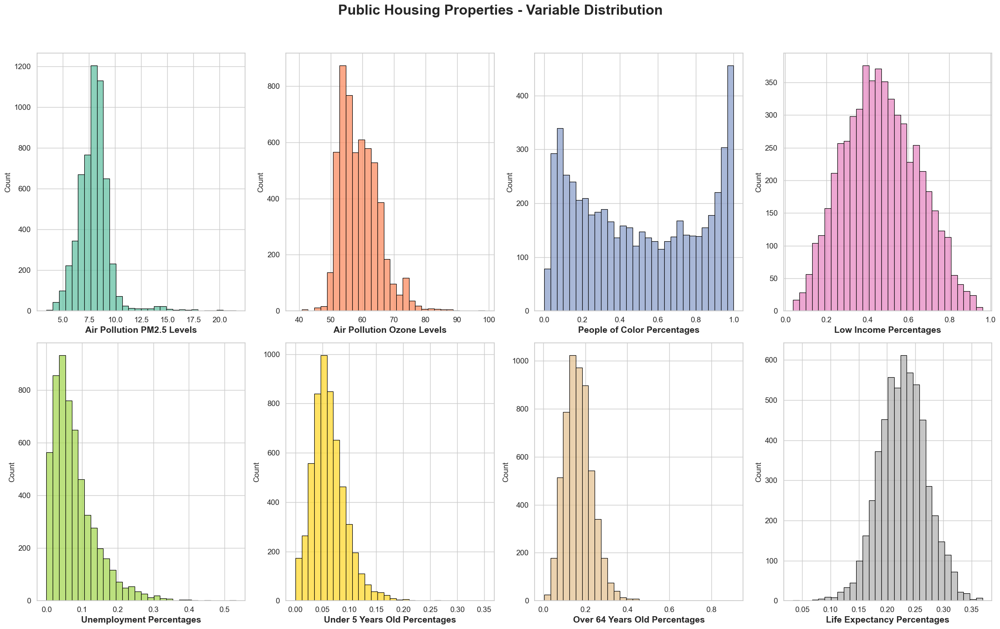

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Variable list
variables = ['PM25', 'OZONE', 'PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']
variable_names = {
    'PM25': 'Air Pollution PM2.5 Levels',
    'OZONE': 'Air Pollution Ozone Levels',
    'PEOPCOLORPCT': 'People of Color Percentages',
    'LOWINCPCT': 'Low Income Percentages',
    'UNEMPPCT': 'Unemployment Percentages',
    'UNDER5PCT': 'Under 5 Years Old Percentages',
    'OVER64PCT': 'Over 64 Years Old Percentages',
    'LIFEEXPPCT': 'Life Expectancy Percentages'
}

# Colors for each plot
colors = ["#66c2a5", "#fc8d62", "#8da0cb", "#e78ac3", "#a6d854", "#ffd92f", "#e5c494", "#b3b3b3"]

# LIHTC Dataset Plots
fig, axes = plt.subplots(2, 4, figsize=(22, 14))
fig.suptitle('LIHTC Properties - Variable Distribution', fontsize=22, weight='bold')

for i, variable in enumerate(variables):
    row = i // 4
    col = i % 4
    sns.histplot(lihtc_df_New[variable], bins=30, ax=axes[row, col], color=colors[i % len(colors)], edgecolor='black')
    axes[row, col].set_xlabel(variable_names[variable], fontsize=14, weight='bold')
    axes[row, col].set_ylabel('Count', fontsize=12)
    axes[row, col].tick_params(axis='both', which='major', labelsize=12)
    axes[row, col].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

# Public Housing Dataset Plots
fig, axes = plt.subplots(2, 4, figsize=(22, 14))
fig.suptitle('Public Housing Properties - Variable Distribution', fontsize=22, weight='bold')

for i, variable in enumerate(variables):
    row = i // 4
    col = i % 4
    sns.histplot(ph_df_New[variable], bins=30, ax=axes[row, col], color=colors[i % len(colors)], edgecolor='black')
    axes[row, col].set_xlabel(variable_names[variable], fontsize=14, weight='bold')
    axes[row, col].set_ylabel('Count', fontsize=12)
    axes[row, col].tick_params(axis='both', which='major', labelsize=12)
    axes[row, col].grid(True)

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


**2. Correlation Analysis**


In [39]:
# Add a column to distinguish between LIHTC and Public Housing using .loc
lihtc_df_New.loc[:, 'PropertyType'] = 'LIHTC'
ph_df_New.loc[:, 'PropertyType'] = 'Public Housing'

# Combine the two datasets
combined_df = pd.concat([lihtc_df_New[['PM25', 'OZONE', 'PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT','PropertyType']], 
                         ph_df_New[['PM25', 'OZONE', 'PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT','PropertyType']]])

# Create a pair plot
#sns.pairplot(combined_df, hue='PropertyType', palette='magma')
#plt.suptitle('Pair Plot for Air Quality Variables - LIHTC and Public Housing', y=1.02)
#plt.show()

# Correlation matrix for LIHTC properties
corr_lihtc_new = lihtc_df_New[['PM25', 'OZONE', 'PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']].corr()
print("Correlation Matrix for LIHTC Properties:\n", corr_lihtc_new)

# Correlation matrix for Public Housing properties
corr_ph_new = ph_df_New[['PM25', 'OZONE', 'PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']].corr()
print("Correlation Matrix for Public Housing Properties:\n", corr_ph_new)


Correlation Matrix for LIHTC Properties:
                   PM25     OZONE  PEOPCOLORPCT  LOWINCPCT  UNEMPPCT  \
PM25          1.000000  0.465061      0.319826   0.095932  0.112392   
OZONE         0.465061  1.000000      0.295035   0.071938  0.126816   
PEOPCOLORPCT  0.319826  0.295035      1.000000   0.523118  0.427517   
LOWINCPCT     0.095932  0.071938      0.523118   1.000000  0.509693   
UNEMPPCT      0.112392  0.126816      0.427517   0.509693  1.000000   
UNDER5PCT     0.047733  0.040185      0.250470   0.268489  0.148440   
OVER64PCT    -0.206255 -0.185747     -0.402168  -0.209394 -0.141632   
LIFEEXPPCT   -0.039382 -0.070578      0.229478   0.574337  0.319642   

              UNDER5PCT  OVER64PCT  LIFEEXPPCT  
PM25           0.047733  -0.206255   -0.039382  
OZONE          0.040185  -0.185747   -0.070578  
PEOPCOLORPCT   0.250470  -0.402168    0.229478  
LOWINCPCT      0.268489  -0.209394    0.574337  
UNEMPPCT       0.148440  -0.141632    0.319642  
UNDER5PCT      1.000000 

C:\Users\19147\AppData\Local\Temp\ipykernel_27496\4073780709.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\19147\AppData\Local\Temp\ipykernel_27496\4073780709.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



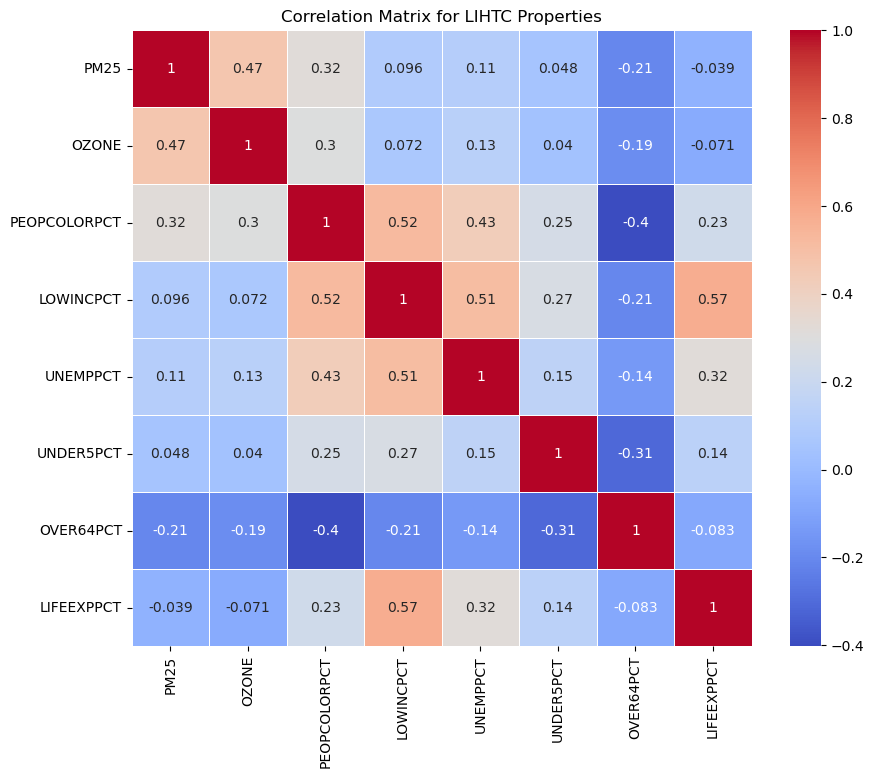

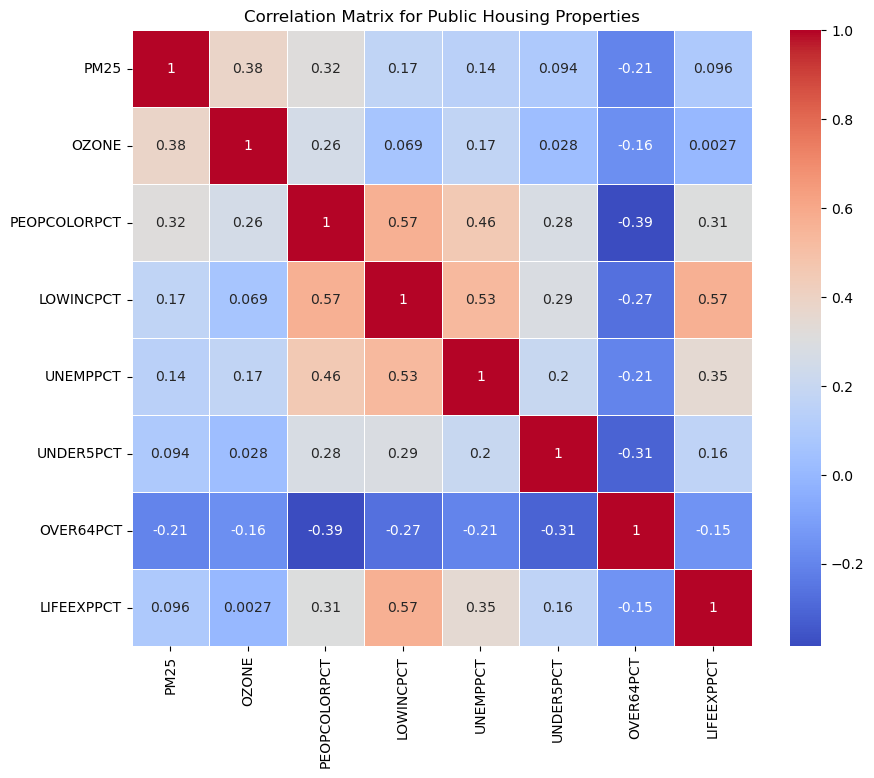

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt  # Use the correct import for plotting functions

# Create a heatmap for the correlation matrix for LIHTC Properties
plt.figure(figsize=(10, 8))
sns.heatmap(corr_lihtc_new, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for LIHTC Properties')
plt.show()

# Create a heatmap for the correlation matrix for Public Housing Properties
plt.figure(figsize=(10, 8))
sns.heatmap(corr_ph_new, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix for Public Housing Properties')
plt.show()


C:\Users\19147\AppData\Local\Temp\ipykernel_3196\482861730.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lihtc_df_New['PropertyType'] = 'LIHTC'
C:\Users\19147\AppData\Local\Temp\ipykernel_3196\482861730.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ph_df_New['PropertyType'] = 'Public Housing'


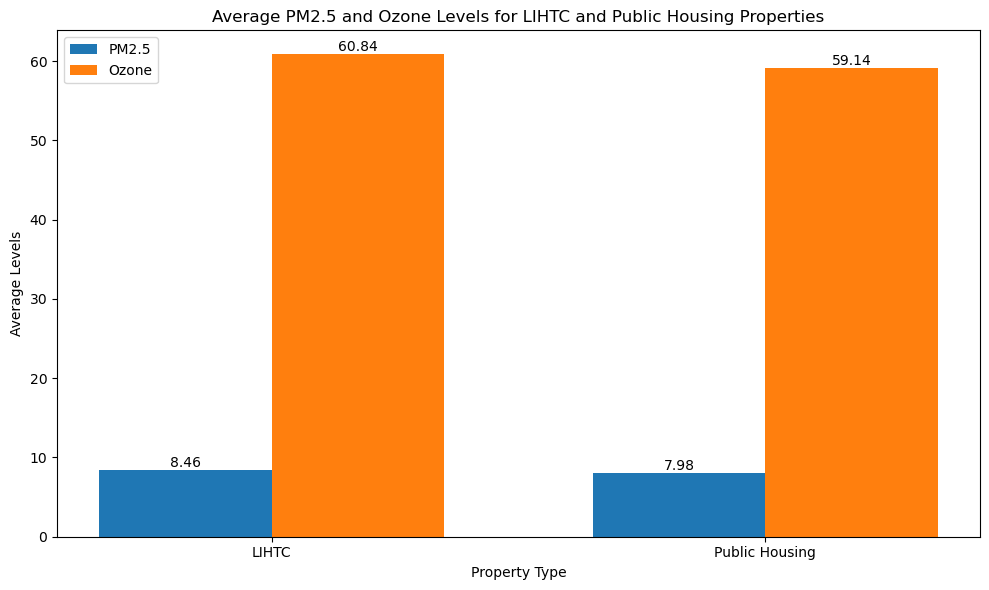

In [51]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'lihtc_df_New' and 'ph_df_New' have 'PM25' and 'OZONE' columns
# Add a new column to identify property type in each DataFrame
lihtc_df_New['PropertyType'] = 'LIHTC'
ph_df_New['PropertyType'] = 'Public Housing'

# Combine both DataFrames
combined_df = pd.concat([lihtc_df_New, ph_df_New])

# Calculate means for PM2.5 and Ozone
means = combined_df.groupby('PropertyType')[['PM25', 'OZONE']].mean()

# Plotting the bar chart without error bars
plt.figure(figsize=(10, 6))

# Define the bar width and positions
bar_width = 0.35
index = range(len(means))

# Create bars for PM2.5 and Ozone
bars1 = plt.bar(index, means['PM25'], bar_width, label='PM2.5')
bars2 = plt.bar([i + bar_width for i in index], means['OZONE'], bar_width, label='Ozone')

# Add mean value labels on top of each bar
for bar in bars1:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')
    
for bar in bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, f'{yval:.2f}', ha='center', va='bottom')

# Add labels, title, and legend
plt.xlabel('Property Type')
plt.ylabel('Average Levels')
plt.title('Average PM2.5 and Ozone Levels for LIHTC and Public Housing Properties')
plt.xticks([i + bar_width / 2 for i in index], means.index)
plt.legend()

# Show plot
plt.tight_layout()
plt.show()


C:\Users\19147\AppData\Local\Temp\ipykernel_3196\1898535296.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lihtc_df_New['PropertyType'] = 'LIHTC'
C:\Users\19147\AppData\Local\Temp\ipykernel_3196\1898535296.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ph_df_New['PropertyType'] = 'Public Housing'


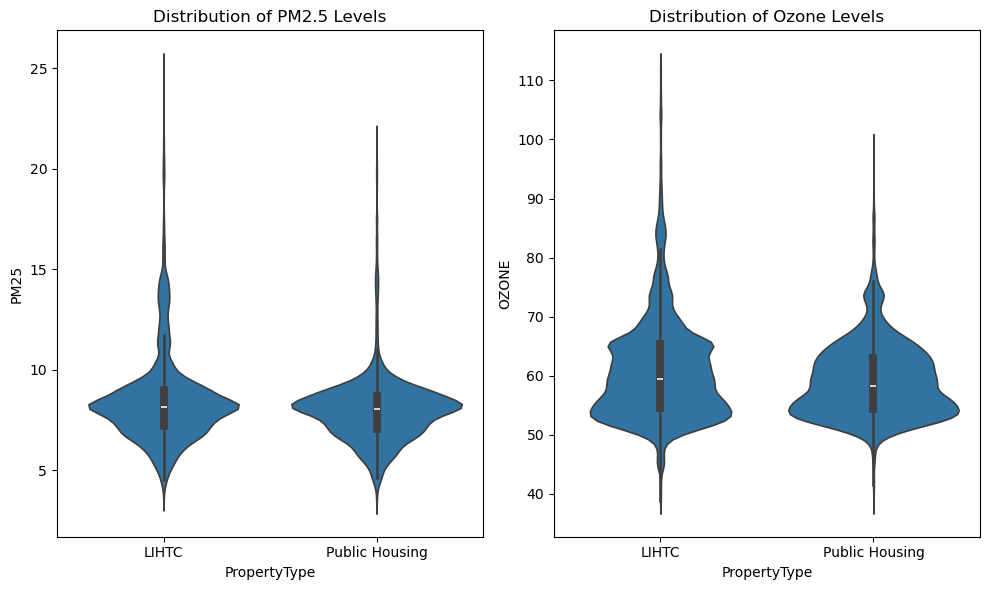

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Combine DataFrames and add 'PropertyType' as before
lihtc_df_New['PropertyType'] = 'LIHTC'
ph_df_New['PropertyType'] = 'Public Housing'
combined_df = pd.concat([lihtc_df_New, ph_df_New])

# Create violin plots
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)  # PM2.5
sns.violinplot(x='PropertyType', y='PM25', data=combined_df)
plt.title('Distribution of PM2.5 Levels')

plt.subplot(1, 2, 2)  # Ozone
sns.violinplot(x='PropertyType', y='OZONE', data=combined_df)
plt.title('Distribution of Ozone Levels')

plt.tight_layout()
plt.show()


**1. Comparative Analysis of Air Pollution Exposure:**
-The air pollution exposure levels between LIHTC and Public Housing properties. 
- The t-test is suitable here as it compares the means of air pollution variables (e.g., PM25, OZONE) between the two groups (LIHTC vs. Public Housing) to assess if there is a statistically significant difference in air pollution exposure.

Linear Regression and other regression analysis on Socioeconomic Variables: Applying linear regression later on for socioeconomic variables (such as people of color, low-income populations, etc.) is also appropriate, as it allows you to understand the association between these variables and pollution levels while adjusting for other factors.

**Hypothesis:**
Do Public Housing properties face higher air pollution exposure compared to LIHTC properties?
How do people of color and low-income populations fare in terms of exposure?


In [55]:


# Perform t-tests between LIHTC and Public Housing for each air pollution variable
for col in ['PM25', 'OZONE']:
    t_stat, p_val = stats.ttest_ind(lihtc_df_New[col], ph_df_New[col], equal_var=False)
    print(f"T-test for {col} between LIHTC and Public Housing: t-stat = {t_stat}, p-value = {p_val}")


T-test for PM25 between LIHTC and Public Housing: t-stat = 18.81227728648847, p-value = 1.40632318967918e-77
T-test for OZONE between LIHTC and Public Housing: t-stat = 17.527935680864392, p-value = 8.807004627185696e-68


The Mann-Whitney U test is used to compare PM2.5 and Ozone levels between the two property types, LIHTC and Public Housing. The test would evaluate whether the distributions of pollution levels for these two groups differ significantly.

Null Hypothesis (H0): The distribution of air pollution exposure (PM2.5 and Ozone levels) for LIHTC properties is the same as for Public Housing properties.
Alternative Hypothesis (H1): The distribution of air pollution exposure (PM2.5 and Ozone levels) differs between LIHTC properties and Public Housing properties.

In [39]:
from scipy.stats import mannwhitneyu

# Perform Mann-Whitney U Test for each pollutant variable
for col in ['PM25', 'OZONE']:
    u_stat, p_val = mannwhitneyu(lihtc_df_New[col], ph_df_New[col], alternative='two-sided')
    print(f"Mann-Whitney U test for {col} between LIHTC and Public Housing: U-stat = {u_stat}, p-value = {p_val}")


Mann-Whitney U test for PM25 between LIHTC and Public Housing: U-stat = 93028872.0, p-value = 5.1951321310717784e-30
Mann-Whitney U test for OZONE between LIHTC and Public Housing: U-stat = 92544215.0, p-value = 1.0030055547914094e-26



Checking Assumptions for LIHTC - PM25:



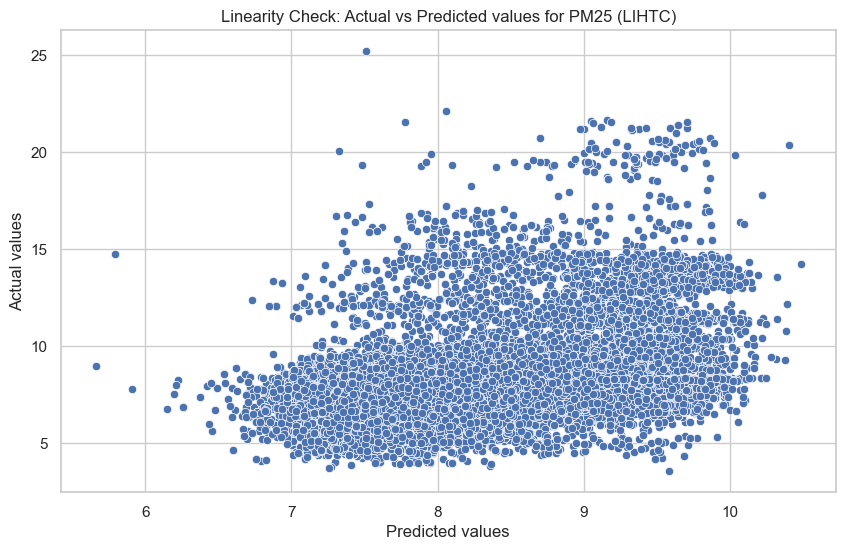

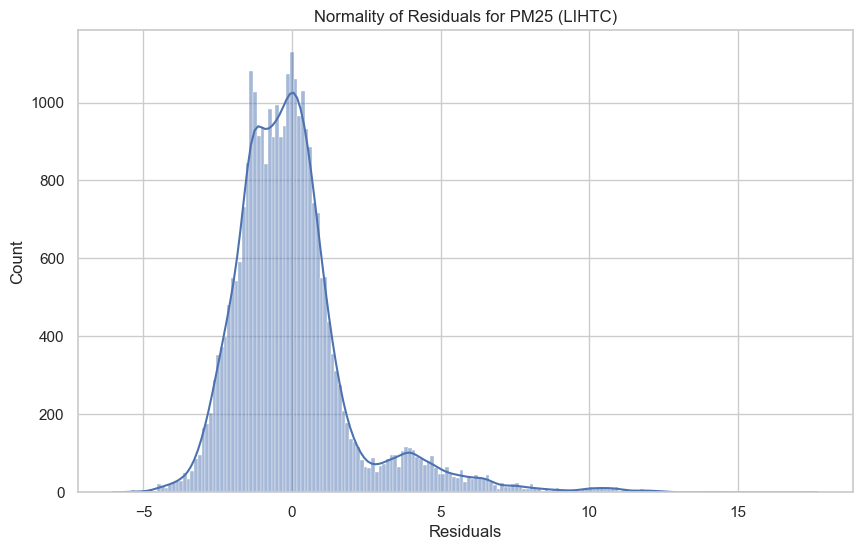

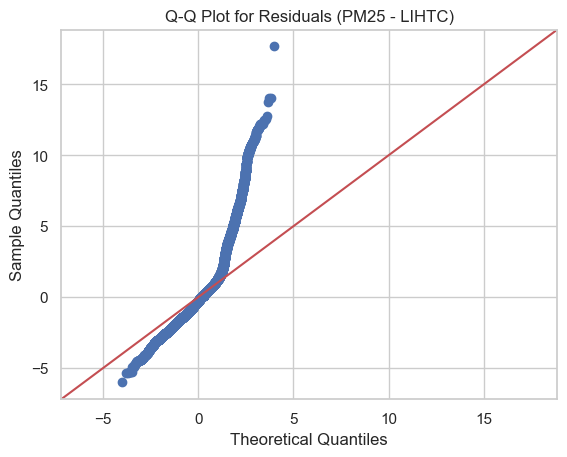

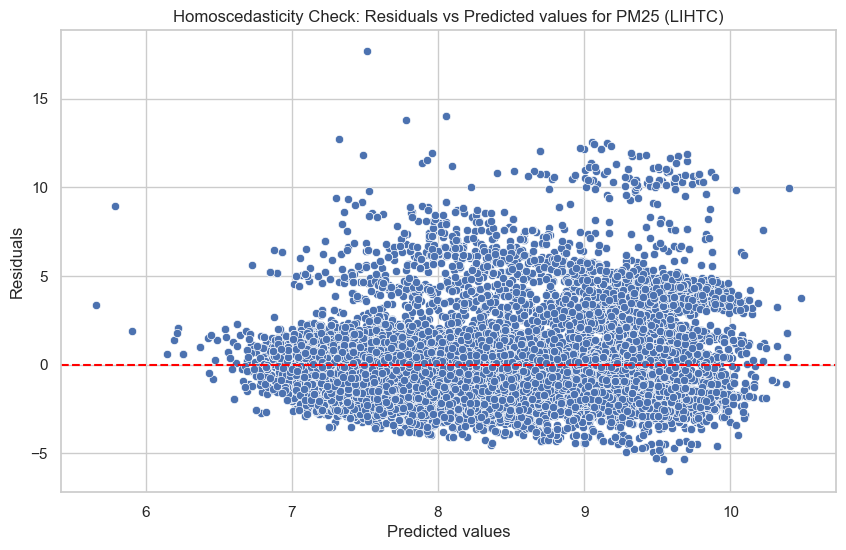

Variance Inflation Factor (VIF) for LIHTC - PM25:
         feature        VIF
0  PEOPCOLORPCT   5.550513
1     LOWINCPCT  12.961396
2      UNEMPPCT   3.745299
3     UNDER5PCT   5.203658
4     OVER64PCT   5.359503
5    LIFEEXPPCT  20.032685

Checking Assumptions for LIHTC - OZONE:



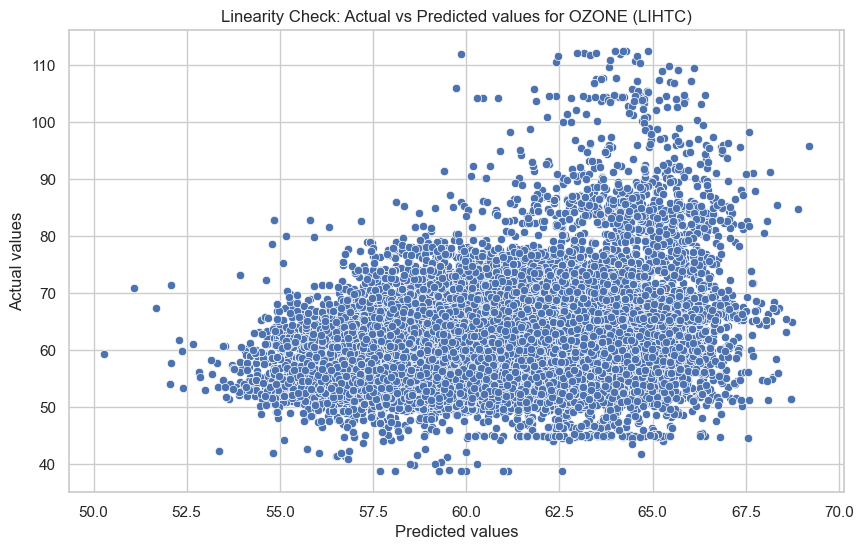

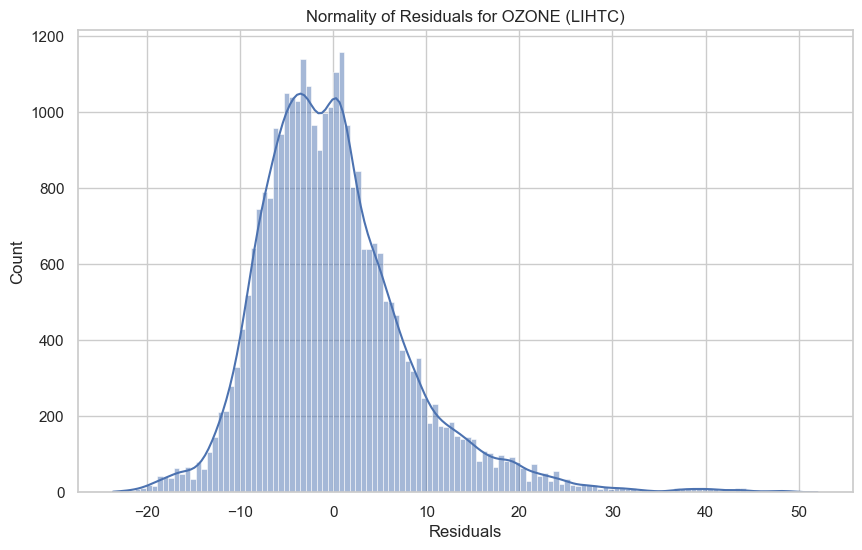

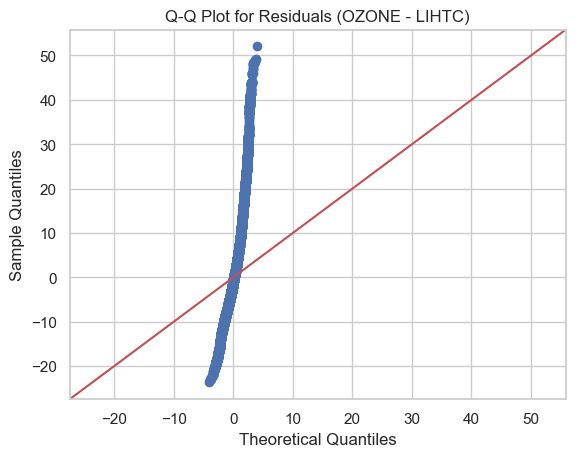

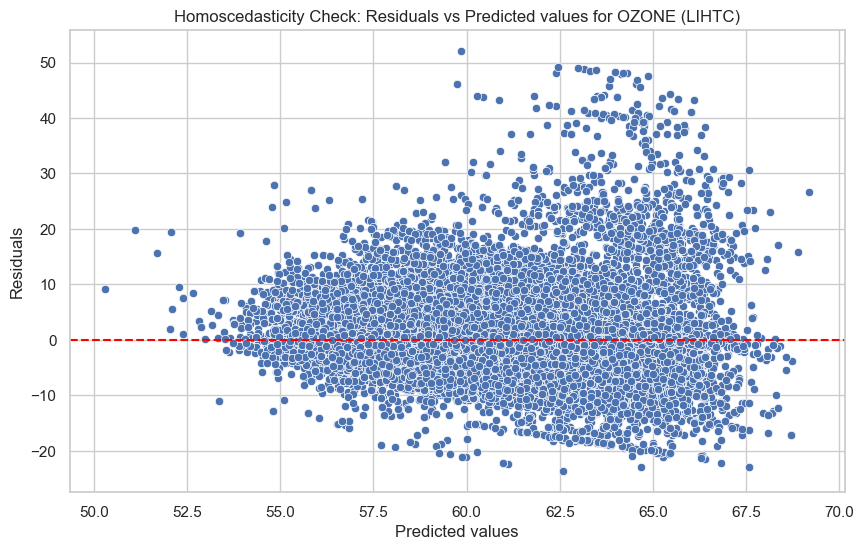

Variance Inflation Factor (VIF) for LIHTC - OZONE:
         feature        VIF
0  PEOPCOLORPCT   5.550513
1     LOWINCPCT  12.961396
2      UNEMPPCT   3.745299
3     UNDER5PCT   5.203658
4     OVER64PCT   5.359503
5    LIFEEXPPCT  20.032685

Checking Assumptions for Public Housing - PM25:



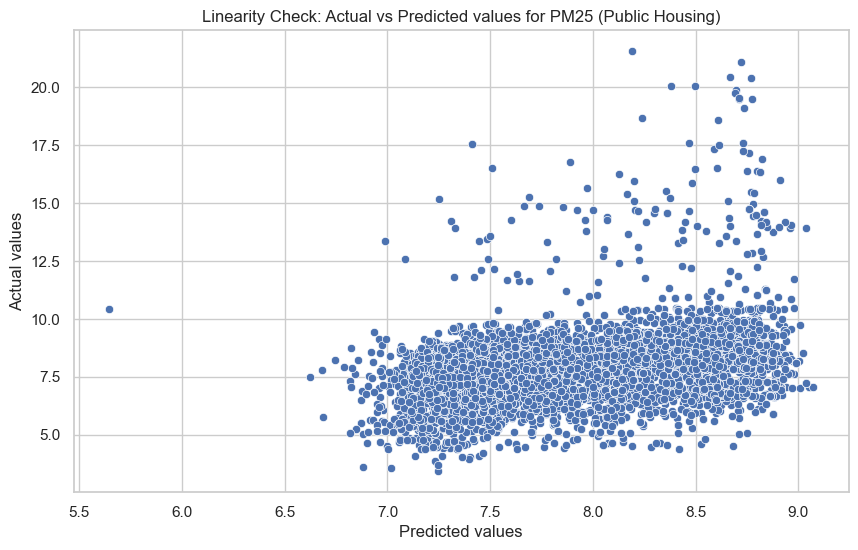

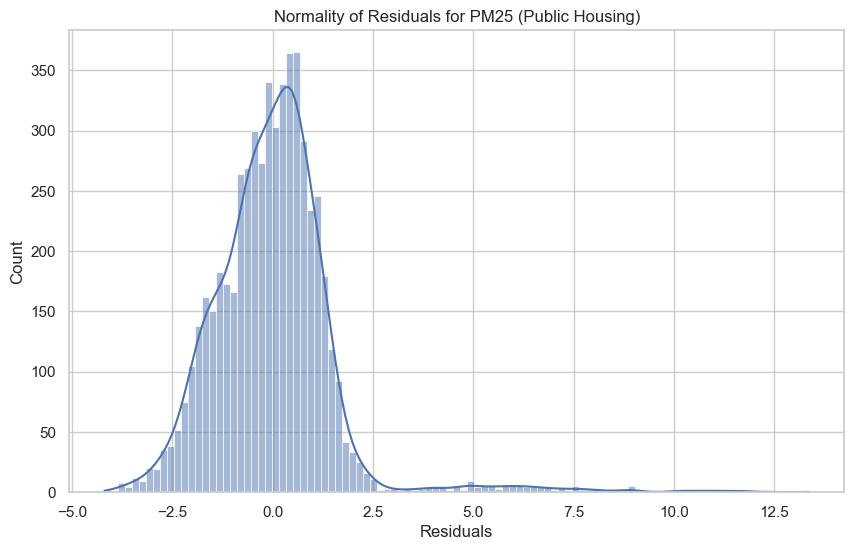

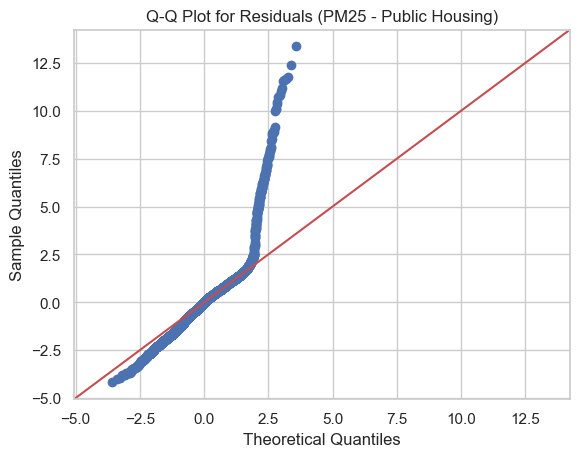

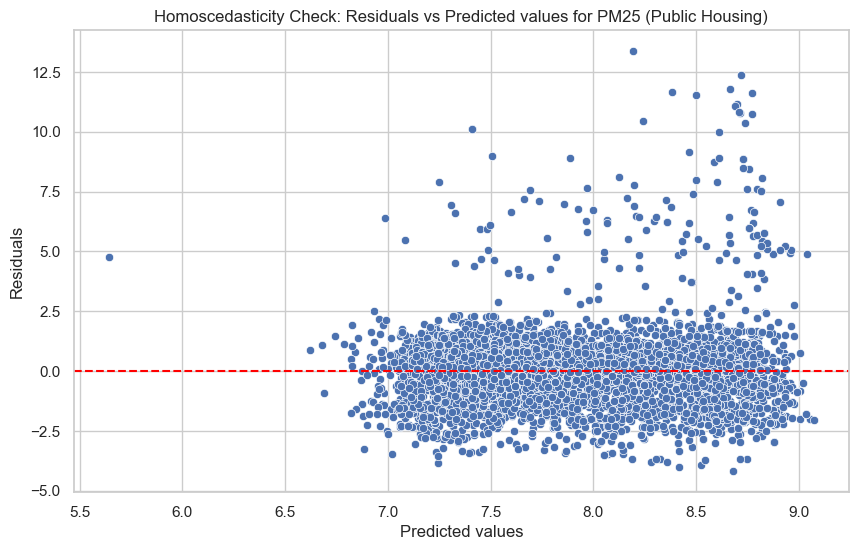

Variance Inflation Factor (VIF) for Public Housing - PM25:
         feature        VIF
0  PEOPCOLORPCT   5.664783
1     LOWINCPCT  17.145891
2      UNEMPPCT   3.778872
3     UNDER5PCT   5.159524
4     OVER64PCT   6.335899
5    LIFEEXPPCT  23.592294

Checking Assumptions for Public Housing - OZONE:



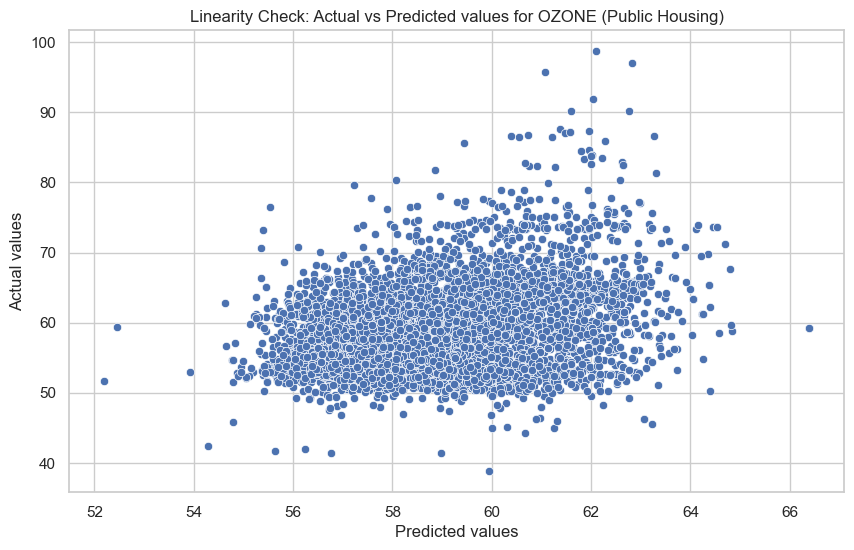

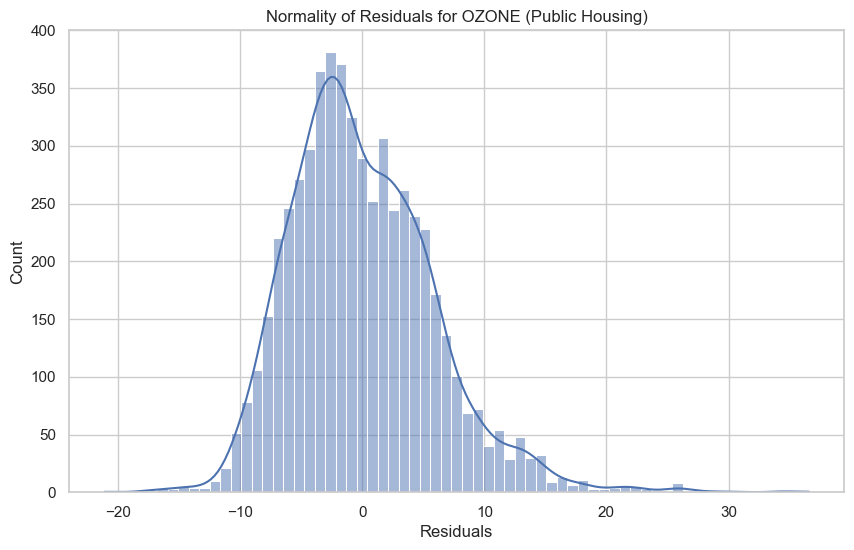

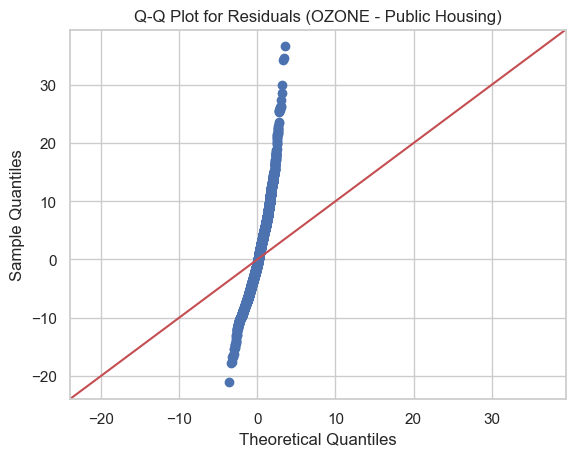

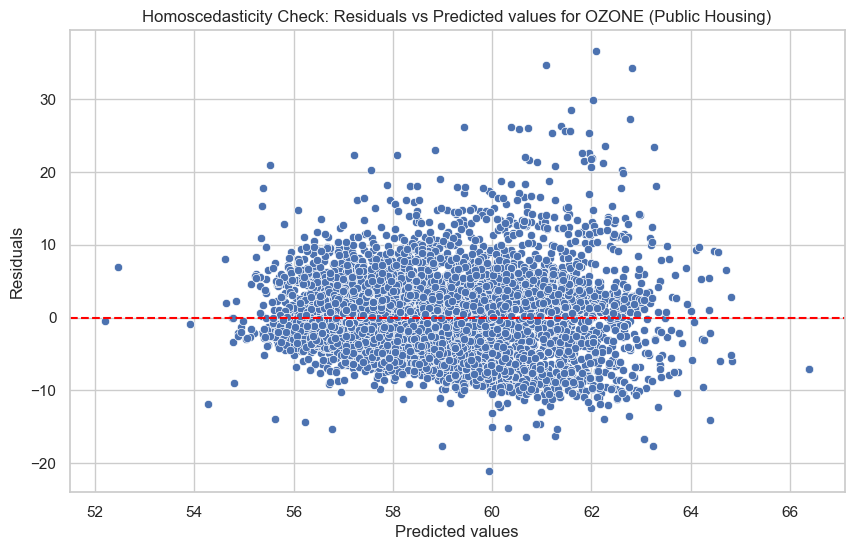

Variance Inflation Factor (VIF) for Public Housing - OZONE:
         feature        VIF
0  PEOPCOLORPCT   5.664783
1     LOWINCPCT  17.145891
2      UNEMPPCT   3.778872
3     UNDER5PCT   5.159524
4     OVER64PCT   6.335899
5    LIFEEXPPCT  23.592294


In [53]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Split data into LIHTC and Public Housing
lihtc_df = combined_df[combined_df['PropertyType'] == 'LIHTC']
public_housing_df = combined_df[combined_df['PropertyType'] == 'Public Housing']

# Function to check linear regression assumptions
def check_assumptions(X, y, property_type, pollutant):
    print(f"\nChecking Assumptions for {property_type} - {pollutant}:\n")

    # Fit a linear regression model
    X_scaled = sm.add_constant(X)  # Adding constant for intercept
    model = sm.OLS(y, X_scaled).fit()
    predictions = model.predict(X_scaled)

    # 1. Linearity: Scatter plot of actual vs predicted values
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=predictions, y=y)
    plt.xlabel("Predicted values")
    plt.ylabel("Actual values")
    plt.title(f"Linearity Check: Actual vs Predicted values for {pollutant} ({property_type})")
    plt.show()

    # 2. Normality of Residuals
    residuals = y - predictions

    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True)
    plt.title(f"Normality of Residuals for {pollutant} ({property_type})")
    plt.xlabel("Residuals")
    plt.show()

    # Q-Q plot for residuals
    sm.qqplot(residuals, line='45')
    plt.title(f"Q-Q Plot for Residuals ({pollutant} - {property_type})")
    plt.show()

    # 3. Homoscedasticity: Plot of residuals vs predicted values
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=predictions, y=residuals)
    plt.axhline(0, color='red', linestyle='--')
    plt.xlabel("Predicted values")
    plt.ylabel("Residuals")
    plt.title(f"Homoscedasticity Check: Residuals vs Predicted values for {pollutant} ({property_type})")
    plt.show()

    # 4. Multicollinearity: Variance Inflation Factor (VIF)
    vif_data = pd.DataFrame()
    vif_data["feature"] = X.columns
    vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    print(f"Variance Inflation Factor (VIF) for {property_type} - {pollutant}:\n", vif_data)

# Apply assumptions checks on LIHTC and Public Housing datasets for both pollutants
for data, property_type in [(lihtc_df, 'LIHTC'), (public_housing_df, 'Public Housing')]:
    X = data[['PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']].dropna()
    
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in {property_type} dataset. Skipping...")
            continue

        y = data[pollutant].dropna()
        # Make sure X and y have matching indices after dropping NaNs
        X, y = X.align(y, join='inner', axis=0)

        check_assumptions(X, y, property_type, pollutant)


**Result**
There is a significant difference in pollution exposure between the two types of housing.

**Regression Analysis**
Linear regression model with PM2.5, Ozone, DSLPM and PTRAF as the dependent variables, and independent variables like PEOPCOLOR, LOWINCOME, and PropertyType.

First Split (70/30):

70% Training Set: Used to train the model (X_train and y_train).
30% Temporary Set (X_temp, y_temp): Used to create testing and validation sets.
Second Split on Temporary Set (20/10):

The temporary 30% set is split into:
20% Testing Set (X_test, y_test).
10% Validation Set (X_val, y_val).
The test_size parameter is set to 1/3 to ensure a split of the 30% set into roughly 20% for testing and 10% for validation.
Using the Splits:
Training Set (70%): Used to fit/train the model.
Validation Set (10%): Used to tune the model parameters or compare models to choose the best one.
Testing Set (20%): Used to evaluate the model's final performance after training and tunin

In [53]:


# Split data into LIHTC and Public Housing
lihtc_df = combined_df[combined_df['PropertyType'] == 'LIHTC']
public_housing_df = combined_df[combined_df['PropertyType'] == 'Public Housing']

# Function to scale the features
def scale_features(X_train, X_test, X_val):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)  # Fit on training data
    X_test_scaled = scaler.transform(X_test)        # Use the same scaler for test data
    X_val_scaled = scaler.transform(X_val)          # Use the same scaler for validation data
    return X_train_scaled, X_test_scaled, X_val_scaled

# Function to fit and evaluate the linear regression model
def fit_and_evaluate_model(data, property_type):
    print(f"Results for {property_type} Properties:\n")

    # Prepare independent variables (X)
    X = data[['PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
    
    # Iterate over each pollutant as the dependent variable to create a multiple linear regression model
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"Multiple Regression for {pollutant}:")
        
        # Dependent variable (y)
        y = data[pollutant]

        # Handle missing values by concatenating X and y and dropping NaNs
        combined = pd.concat([X, y], axis=1).dropna()
        X_clean = combined.drop(columns=[pollutant])
        y_clean = combined[pollutant]

        # First Split: Train 70% and Temporary Set 30%
        X_train, X_temp, y_train, y_temp = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

        # Second Split on the temporary set: Split the remaining 30% into 20% testing and 10% validation
        X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)

        # Print the number of samples in each set to verify the splits
        print(f"Training Set: {len(X_train)} samples")
        print(f"Testing Set: {len(X_test)} samples")
        

        # Scale the features using StandardScaler
        X_train_scaled, X_test_scaled, X_val_scaled = scale_features(X_train, X_test, X_val)

        # Create and fit the linear regression model
        reg = LinearRegression()
        reg.fit(X_train_scaled, y_train)

        # Make predictions on the validation set to tune and assess the model
        y_val_pred = reg.predict(X_val_scaled)
        val_r2 = r2_score(y_val, y_val_pred)
        val_mse = mean_squared_error(y_val, y_val_pred)

        print(f"Validation R-squared: {val_r2:.2f}")
        print(f"Validation Mean Squared Error: {val_mse:.2f}")

        # Final evaluation on the testing set
        y_test_pred = reg.predict(X_test_scaled)
        test_r2 = r2_score(y_test, y_test_pred)
        test_mse = mean_squared_error(y_test, y_test_pred)

        print(f"Testing R-squared: {test_r2:.2f}")
        print(f"Testing Mean Squared Error: {test_mse:.2f}")
        print(f"Coefficients: {reg.coef_}")
        print(f"Intercept: {reg.intercept_}\n")

# Fit and evaluate models for LIHTC properties
fit_and_evaluate_model(lihtc_df, 'LIHTC')

# Fit and evaluate models for Public Housing properties
fit_and_evaluate_model(public_housing_df, 'Public Housing')


Results for LIHTC Properties:

Multiple Regression for PM25:
Training Set: 21224 samples
Testing Set: 6064 samples
Validation R-squared: 0.13
Validation Mean Squared Error: 4.36
Testing R-squared: 0.12
Testing Mean Squared Error: 4.26
Coefficients: [ 0.71292784 -0.07578765  0.03237477 -0.11074572 -0.22825625 -0.21439885]
Intercept: 8.449695016849931

Multiple Regression for OZONE:
Training Set: 21224 samples
Testing Set: 6064 samples
Validation R-squared: 0.13
Validation Mean Squared Error: 64.99
Testing R-squared: 0.11
Testing Mean Squared Error: 64.90
Coefficients: [ 2.62846658 -0.45521991  0.47872256 -0.37550982 -0.80511336 -1.13667026]
Intercept: 60.85284871195345

Results for Public Housing Properties:

Multiple Regression for PM25:
Training Set: 3920 samples
Testing Set: 1120 samples
Validation R-squared: 0.11
Validation Mean Squared Error: 2.65
Testing R-squared: 0.10
Testing Mean Squared Error: 2.07
Coefficients: [ 0.48197127 -0.05515928  0.00399341 -0.02298169 -0.18256466  0.0

General Insights and Recommendations:
Low R-squared values:

Across all models, the R-squared values are quite low (ranging from 0.09 to 0.13). This indicates that the chosen independent variables (PEOPCOLORPCT, LOWINCOMEPCT, etc.) are not explaining a large portion of the variance in PM25, OZONE.
MSE and Error Sizes:
The MSE for PM25 and OZONE is smaller but, combined with the low R-squared, still indicates that the model is not making very accurate predictions.
Coefficients:

The PEOPCOLOR variable seems to have the most influence  on PM25 and OZONE.



In [64]:

# Iterate over each property type (LIHTC and Public Housing)
for property_type in ['LIHTC', 'Public Housing']:
    # Filter the dataset for the current property type
    property_df = combined_df[combined_df['PropertyType'] == property_type]

    # Select relevant features without LOWINCOME
    X_reduced = property_df[['PEOPCOLORPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT']]

    # Iterate over each pollutant as the dependent variable to create a multiple Lasso regression model
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in property_df.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"Multiple Regression for {pollutant} ({property_type}):")

        # Dependent variable (y)
        y = property_df[pollutant]

        # Split data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X_reduced, y, test_size=0.3, random_state=42)

        # Scale the features
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Fit the Lasso model
        lasso = Lasso(alpha=0.1)  # You can adjust alpha for regularization strength
        lasso.fit(X_train_scaled, y_train)

        # Make predictions and evaluate the model
        y_pred_lasso = lasso.predict(X_test_scaled)

        print(f"Lasso R-squared for {pollutant} ({property_type}): {r2_score(y_test, y_pred_lasso):.2f}")
        print(f"Lasso MSE for {pollutant} ({property_type}): {mean_squared_error(y_test, y_pred_lasso):.2f}")
        print("-" * 50)


Multiple Regression for PM25 (LIHTC):
Lasso R-squared for PM25 (LIHTC): 0.11
Lasso MSE for PM25 (LIHTC): 4.39
--------------------------------------------------
Multiple Regression for OZONE (LIHTC):
Lasso R-squared for OZONE (LIHTC): 0.10
Lasso MSE for OZONE (LIHTC): 66.48
--------------------------------------------------
Multiple Regression for PM25 (Public Housing):
Lasso R-squared for PM25 (Public Housing): 0.10
Lasso MSE for PM25 (Public Housing): 2.27
--------------------------------------------------
Multiple Regression for OZONE (Public Housing):
Lasso R-squared for OZONE (Public Housing): 0.06
Lasso MSE for OZONE (Public Housing): 36.75
--------------------------------------------------


The low R-squared values suggest that more predictors or more complex models may be needed to capture the variance in pollution levels.



In [56]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd

# Function to scale the features
def scale_features(X_train, X_test, X_val=None):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)  # Fit on training data
    X_test_scaled = scaler.transform(X_test)        # Use the same scaler for test data
    if X_val is not None:
        X_val_scaled = scaler.transform(X_val)      # Use the same scaler for validation data
        return X_train_scaled, X_test_scaled, X_val_scaled
    return X_train_scaled, X_test_scaled

# Function to fit and evaluate the Random Forest regression model
def fit_and_evaluate_random_forest(data, property_type):
    print(f"Results for {property_type} Properties:\n")

    # Prepare independent variables (X)
    X = data[['PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
    
    # Iterate over each pollutant as the dependent variable to create a Random Forest regression model
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"Random Forest Regression for {pollutant}:")

        # Dependent variable (y)
        y = data[pollutant]

        # Handle missing values by concatenating X and y and dropping NaNs
        combined = pd.concat([X, y], axis=1).dropna()
        X_clean = combined.drop(columns=[pollutant])
        y_clean = combined[pollutant]

        # First Split: Train 70% and Temporary Set 30%
        X_train, X_temp, y_train, y_temp = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

        # Second Split on the temporary set: Split the remaining 30% into 20% testing and 10% validation
        X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)

        # Print the number of samples in each set to verify the splits
        print(f"Training Set: {len(X_train)} samples")
        print(f"Testing Set: {len(X_test)} samples")
        print(f"Validation Set: {len(X_val)} samples")

        # Scale the features using StandardScaler
        X_train_scaled, X_test_scaled, X_val_scaled = scale_features(X_train, X_test, X_val)

        # Create and fit the Random Forest regression model
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(X_train_scaled, y_train)

        # Make predictions on the validation set
        y_val_pred_rf = rf.predict(X_val_scaled)
        val_r2_rf = r2_score(y_val, y_val_pred_rf)
        val_mse_rf = mean_squared_error(y_val, y_val_pred_rf)

        print(f"Validation R-squared: {val_r2_rf:.2f}")
        print(f"Validation Mean Squared Error: {val_mse_rf:.2f}")

        # Final evaluation on the testing set
        y_test_pred_rf = rf.predict(X_test_scaled)
        test_r2_rf = r2_score(y_test, y_test_pred_rf)
        test_mse_rf = mean_squared_error(y_test, y_test_pred_rf)

        print(f"Testing R-squared: {test_r2_rf:.2f}")
        print(f"Testing Mean Squared Error: {test_mse_rf:.2f}\n")
        print(f"Feature Importances: {rf.feature_importances_}")
        print(f"Intercept: Not applicable for tree-based models\n")

# Fit and evaluate Random Forest models for LIHTC properties
fit_and_evaluate_random_forest(lihtc_df, 'LIHTC')

# Fit and evaluate Random Forest models for Public Housing properties
fit_and_evaluate_random_forest(public_housing_df, 'Public Housing')


Results for LIHTC Properties:

Random Forest Regression for PM25:
Training Set: 21224 samples
Testing Set: 6064 samples
Validation Set: 3033 samples
Validation R-squared: 0.54
Validation Mean Squared Error: 2.33
Testing R-squared: 0.54
Testing Mean Squared Error: 2.24

Feature Importances: [0.26049293 0.14983499 0.14697026 0.14202262 0.15781814 0.14286105]
Intercept: Not applicable for tree-based models

Random Forest Regression for OZONE:
Training Set: 21224 samples
Testing Set: 6064 samples
Validation Set: 3033 samples
Validation R-squared: 0.53
Validation Mean Squared Error: 34.99
Testing R-squared: 0.52
Testing Mean Squared Error: 34.96

Feature Importances: [0.23841006 0.14676869 0.14448223 0.15183    0.1664099  0.15209912]
Intercept: Not applicable for tree-based models

Results for Public Housing Properties:

Random Forest Regression for PM25:
Training Set: 3920 samples
Testing Set: 1120 samples
Validation Set: 561 samples
Validation R-squared: 0.19
Validation Mean Squared Error

Results for LIHTC Properties:

Random Forest Regression for PM25:
Validation R-squared: 0.54
Validation Mean Squared Error: 2.33
Testing R-squared: 0.54
Testing Mean Squared Error: 2.24

Feature Importances: [0.26049293 0.14983499 0.14697026 0.14202262 0.15781814 0.14286105]
Intercept: Not applicable for tree-based models



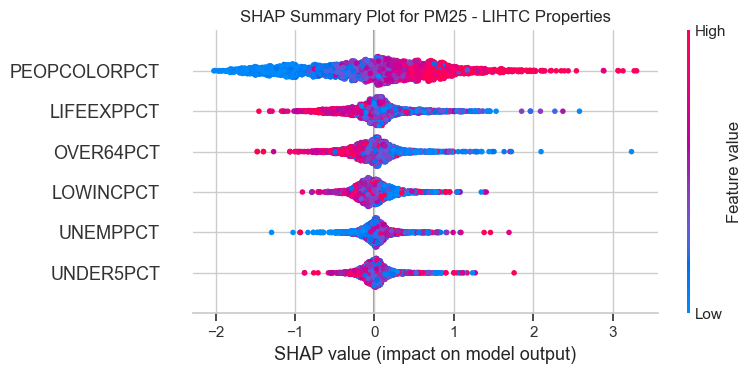

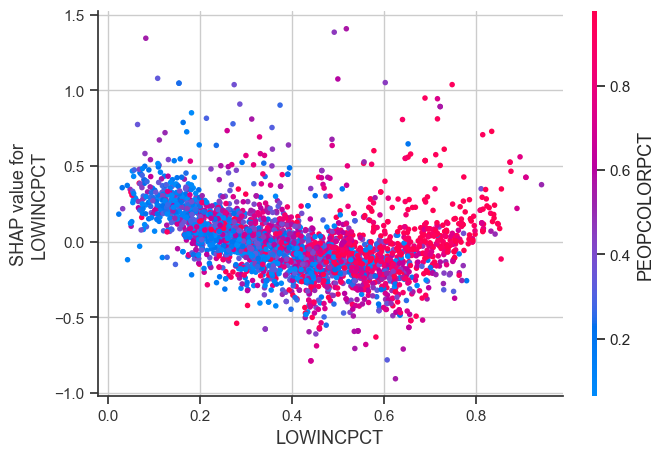

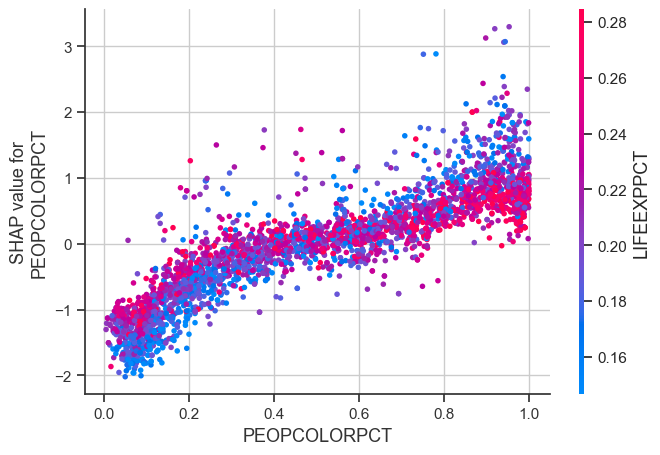

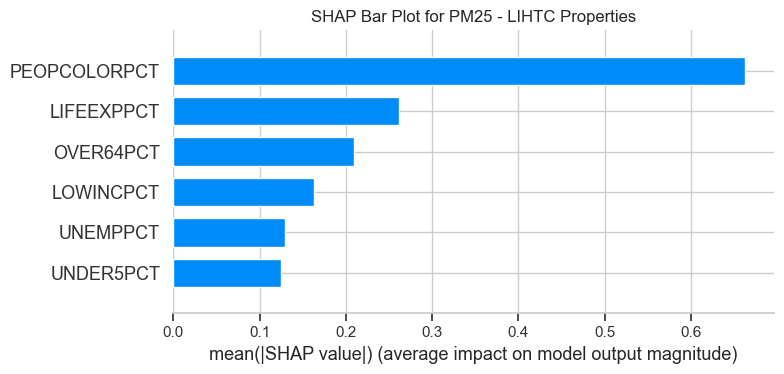

Random Forest Regression for OZONE:
Validation R-squared: 0.53
Validation Mean Squared Error: 34.99
Testing R-squared: 0.52
Testing Mean Squared Error: 34.96

Feature Importances: [0.23841006 0.14676869 0.14448223 0.15183    0.1664099  0.15209912]
Intercept: Not applicable for tree-based models



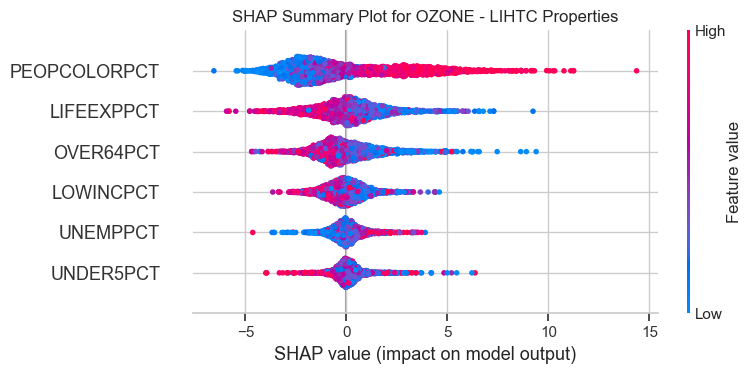

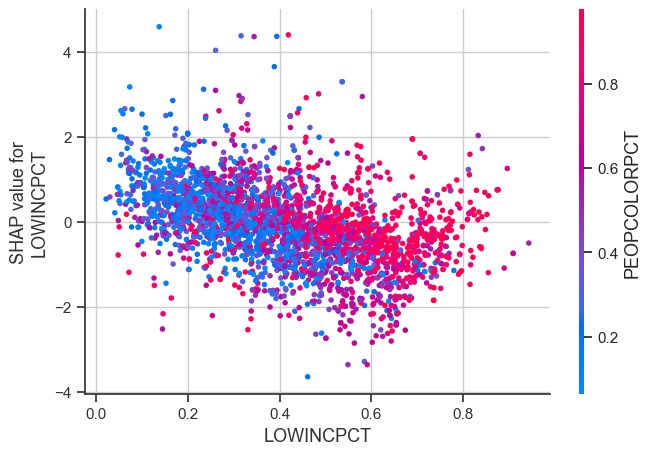

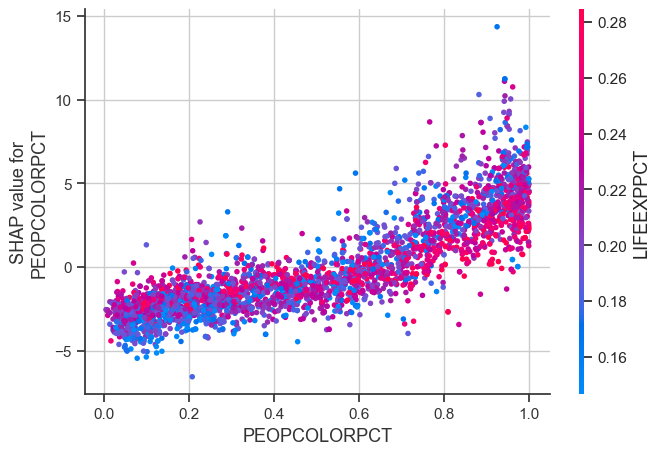

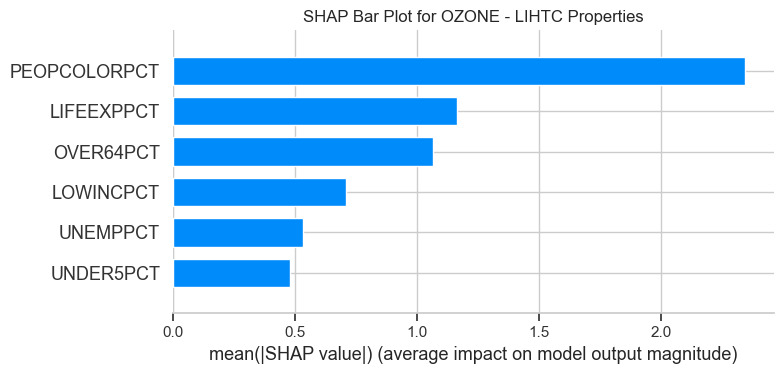

Results for Public Housing Properties:

Random Forest Regression for PM25:
Validation R-squared: 0.19
Validation Mean Squared Error: 2.39
Testing R-squared: 0.19
Testing Mean Squared Error: 1.87

Feature Importances: [0.26337992 0.1463392  0.13877474 0.13132813 0.16926082 0.15091718]
Intercept: Not applicable for tree-based models



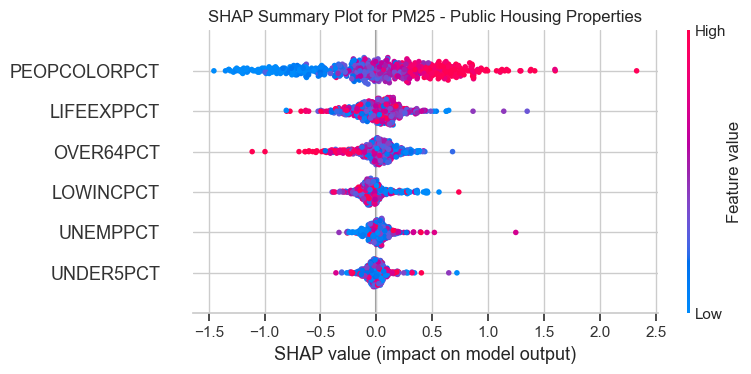

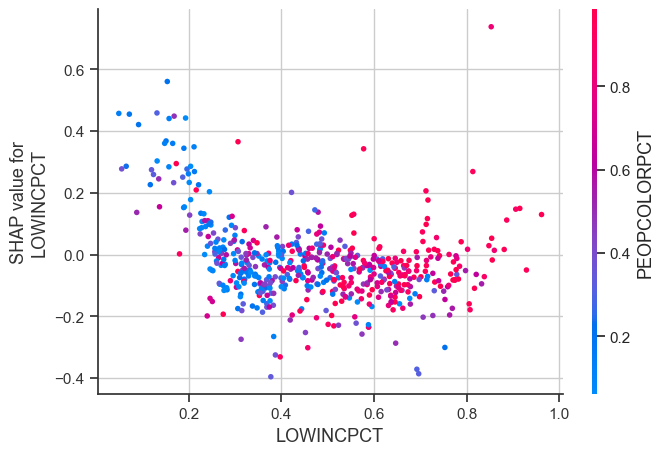

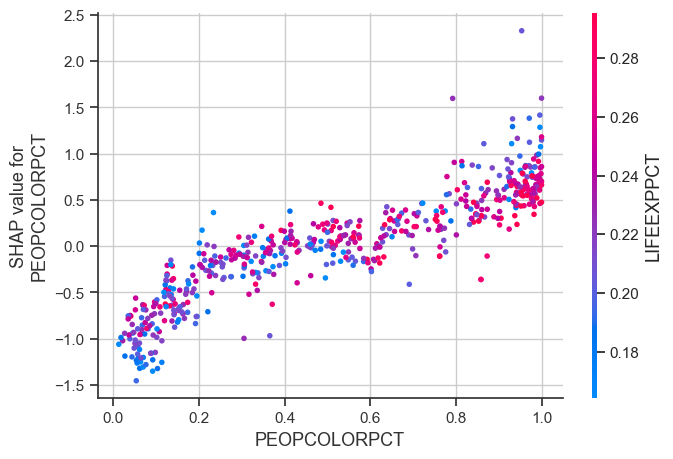

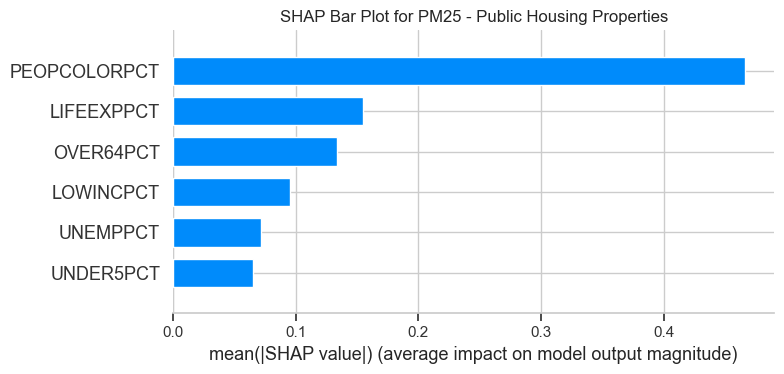

Random Forest Regression for OZONE:
Validation R-squared: 0.21
Validation Mean Squared Error: 31.53
Testing R-squared: 0.19
Testing Mean Squared Error: 31.50

Feature Importances: [0.21807558 0.16550309 0.15592512 0.14556229 0.16435408 0.15057984]
Intercept: Not applicable for tree-based models



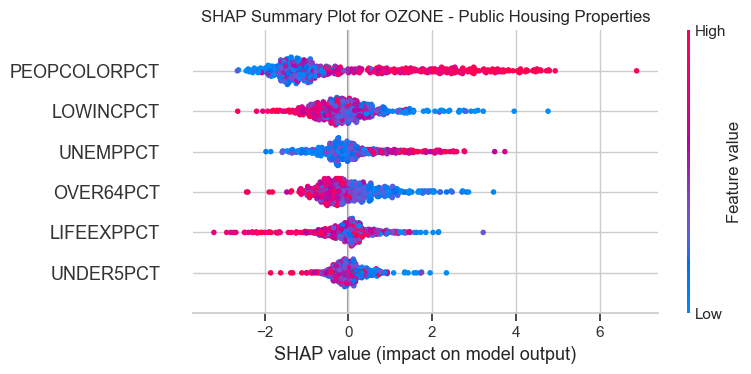

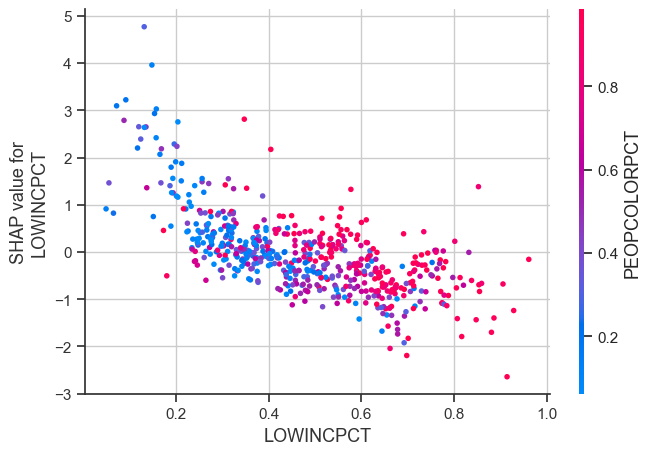

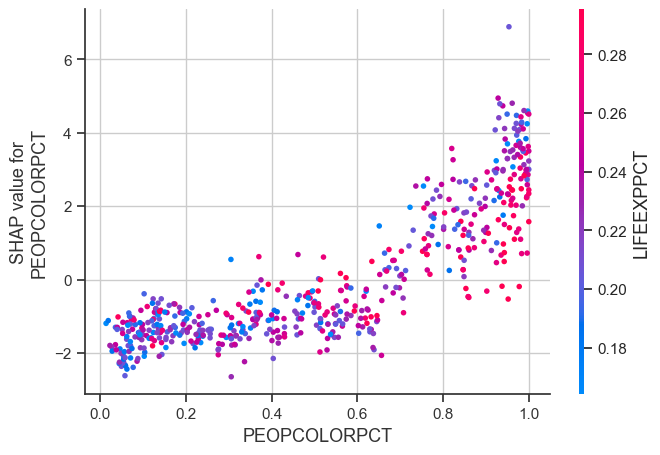

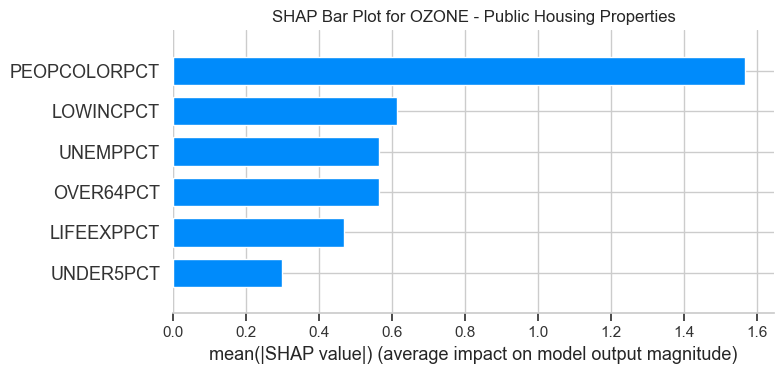

In [58]:
import shap
import matplotlib.pyplot as plt

# Function to fit, evaluate the Random Forest model, and create SHAP plots
def fit_evaluate_rf_with_shap(data, property_type):
    print(f"Results for {property_type} Properties:\n")

    # Prepare independent variables (X)
    X = data[['PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
    
    # Iterate over each pollutant as the dependent variable to create a Random Forest regression model
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"Random Forest Regression for {pollutant}:")

        # Dependent variable (y)
        y = data[pollutant]

        # Handle missing values by concatenating X and y and dropping NaNs
        combined = pd.concat([X, y], axis=1).dropna()
        X_clean = combined.drop(columns=[pollutant])
        y_clean = combined[pollutant]

        # First Split: Train 70% and Temporary Set 30%
        X_train, X_temp, y_train, y_temp = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

        # Second Split on the temporary set: Split the remaining 30% into 20% testing and 10% validation
        X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)

        # Scale the features using StandardScaler
        X_train_scaled, X_test_scaled, X_val_scaled = scale_features(X_train, X_test, X_val)

        # Create and fit the Random Forest regression model
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(X_train_scaled, y_train)

        # Make predictions on the validation set
        y_val_pred_rf = rf.predict(X_val_scaled)
        val_r2_rf = r2_score(y_val, y_val_pred_rf)
        val_mse_rf = mean_squared_error(y_val, y_val_pred_rf)

        print(f"Validation R-squared: {val_r2_rf:.2f}")
        print(f"Validation Mean Squared Error: {val_mse_rf:.2f}")

        # Final evaluation on the testing set
        y_test_pred_rf = rf.predict(X_test_scaled)
        test_r2_rf = r2_score(y_test, y_test_pred_rf)
        test_mse_rf = mean_squared_error(y_test, y_test_pred_rf)

        print(f"Testing R-squared: {test_r2_rf:.2f}")
        print(f"Testing Mean Squared Error: {test_mse_rf:.2f}\n")
        print(f"Feature Importances: {rf.feature_importances_}")
        print(f"Intercept: Not applicable for tree-based models\n")

        # SHAP Explanation
        explainer = shap.TreeExplainer(rf)
        shap_values = explainer.shap_values(X_val_scaled)

        # Summary plot of SHAP values
        plt.title(f"SHAP Summary Plot for {pollutant} - {property_type} Properties")
        shap.summary_plot(shap_values, X_val, feature_names=X.columns)

         # Dependence plots for specific features
        
        shap.dependence_plot('LOWINCPCT', shap_values, X_val, feature_names=X.columns)
        
        shap.dependence_plot('PEOPCOLORPCT', shap_values, X_val, feature_names=X.columns)

        # Bar plot for SHAP values (Feature Importance)
        plt.title(f"SHAP Bar Plot for {pollutant} - {property_type} Properties")
        shap.summary_plot(shap_values, X_val, plot_type="bar", feature_names=X.columns)


# Fit and evaluate Random Forest models for LIHTC properties with SHAP plots
fit_evaluate_rf_with_shap(lihtc_df, 'LIHTC')

# Fit and evaluate Random Forest models for Public Housing properties with SHAP plots
fit_evaluate_rf_with_shap(public_housing_df, 'Public Housing')


1. Linear Regression Results Interpretation:
Low R-squared Values: The R-squared values for linear regression models (0.09 to 0.13 for both LIHTC and Public Housing properties) are low, indicating that the linear model explains only a small portion of the variability in PM25 and OZONE levels based on the socioeconomic predictors. This suggests that the relationship between these predictors and pollution levels is either weak or nonlinear.
Mean Squared Error (MSE): The MSEs (ranging from 2.09 to 4.41 for PM25 and 36.51 to 66.05 for OZONE) reflect the average squared difference between observed and predicted values. Lower MSEs would be preferable, indicating less error in predictions, but the current values are relatively high given the low R-squared values.
Feature Coefficients: Some coefficients, such as for LOWINCOME and PEOPCOLOR, are statistically significant and indicate that these variables contribute to changes in pollution levels. However, due to the low R-squared, the linear model may not capture the complex relationships in the data.
2. Variance Inflation Factor (VIF) Analysis:
Multicollinearity Presence: The VIF for LOWINCOME is quite high, indicating multicollinearity issues. Despite its importance, high multicollinearity can affect the stability of coefficient estimates, which might explain why linear regression does not capture the variability well. Using Lasso regression partially mitigates this by reducing the impact of multicollinear variables.
3. Lasso Regression Results Interpretation:
Minimal Improvement: Lasso regression didn’t significantly improve R-squared values compared to ordinary linear regression. The R-squared values stayed around 0.10 to 0.11 for LIHTC and 0.06 to 0.10 for Public Housing properties. This suggests that Lasso's regularization didn’t help much, as the relationship might not be well captured by a linear approach with or without regularization.
MSE Values: Lasso's MSE values are similar to the original linear regression MSE, indicating no substantial change in prediction accuracy. This suggests that while multicollinearity was reduced, it was not the main issue affecting model performance.
4. Random Forest Regression Results Interpretation:
Higher R-squared Values for LIHTC Properties: Random Forest models for LIHTC properties performed much better than linear and Lasso regression, with R-squared values around 0.54 for PM25 and 0.53 for OZONE. This improvement suggests that Random Forest’s ability to capture nonlinear relationships and interactions between variables is better suited for this dataset.

Lower MSE Values: Random Forest significantly reduced MSE (2.24 to 2.33 for PM25 and 34.96 to 34.99 for OZONE in LIHTC), indicating more accurate predictions compared to linear and Lasso regression. This confirms that the Random Forest model better fits the data for LIHTC properties.

Feature Importances: For LIHTC, features like PEOPCOLORPCT, LOWINCPCT, UNEMPLPCT, and OVER64PCT appear to have substantial importance in predicting air pollution. This suggests that Random Forest captures meaningful patterns in how socioeconomic factors relate to air pollution exposure, which the linear model could not.

Lower Performance for Public Housing: In Public Housing properties, the R-squared values are considerably lower (0.19 for PM25 and 0.21 for OZONE), indicating that the Random Forest model did not capture relationships as well. This could be due to the smaller sample size, as tree-based models like Random Forests typically require more data to learn effectively. However, there was still a slight improvement over linear regression.

Feature Importances in Public Housing: The feature importances for Public Housing follow a similar pattern to LIHTC, with PEOPCOLORPCT and LOWINCOMEPCT consistently ranking high, suggesting they are key factors influencing pollution exposure in both housing types.

**Summary of Model Suitability:**
Linear and Lasso Regression: These models may not be the best fit due to low R-squared values, suggesting that linear assumptions don’t adequately capture the complexity of the data.
Random Forest Regression: For LIHTC properties, Random Forest offers a substantial improvement, capturing the nonlinear relationships and interactions between air pollution and socioeconomic variables. However, for Public Housing, the smaller dataset limits its predictive ability.
In conclusion, Random Forest is likely the more suitable model, particularly for LIHTC data, as it better handles the complex interactions present in the socioeconomic and air pollution data. Further adjustments, such as hyperparameter tuning for Random Forest or even trying ensemble methods, could help improve performance, especially for the smaller Public Housing sample.

**MLP Regressor**

In [41]:
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import keras_tuner as kt
from imblearn.combine import SMOTETomek

# Split data into LIHTC and Public Housing
lihtc_df = combined_df[combined_df['PropertyType'] == 'LIHTC']
public_housing_df = combined_df[combined_df['PropertyType'] == 'Public Housing']

# Function to scale the features
def scale_features(X_train, X_test, X_val):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)  # Fit on training data
    X_test_scaled = scaler.transform(X_test)        # Use the same scaler for test data
    X_val_scaled = scaler.transform(X_val)          # Use the same scaler for validation data
    return X_train_scaled, X_test_scaled, X_val_scaled
    
# Function to fit and evaluate the MLP regression model with an extended structure
def fit_and_evaluate_mlp(data, property_type):
    print(f"Results for {property_type} Properties:\n")

    # Prepare independent variables (X)
    X = data[['PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
    
    # Iterate over each pollutant as the dependent variable to create an MLP regression model
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"MLP Regression for {pollutant}:")

        # Dependent variable (y)
        y = data[pollutant]

        # Handle missing values by concatenating X and y and dropping NaNs
        combined = pd.concat([X, y], axis=1).dropna()
        X_clean = combined.drop(columns=[pollutant])
        y_clean = combined[pollutant]

        # First Split: Train 70% and Temporary Set 30%
        X_train, X_temp, y_train, y_temp = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

        # Second Split on the temporary set: Split the remaining 30% into 20% testing and 10% validation
        X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)

        # Print the number of samples in each set to verify the splits
        print(f"Training Set: {len(X_train)} samples")
        print(f"Testing Set: {len(X_test)} samples")
        print(f"Validation Set: {len(X_val)} samples")

        # Scale the features using StandardScaler
        X_train_scaled, X_test_scaled, X_val_scaled = scale_features(X_train, X_test, X_val)

        # Create and fit the MLP regression model with extended hidden layers and dropout regularization
        mlp = MLPRegressor(
            hidden_layer_sizes=(128, 64, 32),    # More layers for capturing complex relationships
            activation = 'relu',
            solver = 'adam',
            alpha=0.0001,                         # L2 regularization (weight decay)
            max_iter=2000,                       # Increase the maximum iterations for convergence
            random_state=42,
            batch_size='auto', 
            learning_rate='constant', 
            learning_rate_init=0.001, 
            power_t=0.5,
            early_stopping=True                  # Early stopping to avoid overfitting
        )
        mlp.fit(X_train_scaled, y_train)

        # Make predictions on the validation set
        y_val_pred_mlp = mlp.predict(X_val_scaled)
        val_r2_mlp = r2_score(y_val, y_val_pred_mlp)
        val_mse_mlp = mean_squared_error(y_val, y_val_pred_mlp)

        print(f"Validation R-squared: {val_r2_mlp:.2f}")
        print(f"Validation Mean Squared Error: {val_mse_mlp:.2f}")

        # Final evaluation on the testing set
        y_test_pred_mlp = mlp.predict(X_test_scaled)
        test_r2_mlp = r2_score(y_test, y_test_pred_mlp)
        test_mse_mlp = mean_squared_error(y_test, y_test_pred_mlp)

        print(f"Testing R-squared: {test_r2_mlp:.2f}")
        print(f"Testing Mean Squared Error: {test_mse_mlp:.2f}\n")

# Fit and evaluate MLP models for LIHTC properties
fit_and_evaluate_mlp(lihtc_df, 'LIHTC')

# Fit and evaluate MLP models for Public Housing properties
fit_and_evaluate_mlp(public_housing_df, 'Public Housing')


Results for LIHTC Properties:

MLP Regression for PM25:
Training Set: 21224 samples
Testing Set: 6064 samples
Validation Set: 3033 samples
Validation R-squared: 0.17
Validation Mean Squared Error: 4.14
Testing R-squared: 0.19
Testing Mean Squared Error: 3.91

MLP Regression for OZONE:
Training Set: 21224 samples
Testing Set: 6064 samples
Validation Set: 3033 samples
Validation R-squared: 0.17
Validation Mean Squared Error: 61.55
Testing R-squared: 0.17
Testing Mean Squared Error: 60.73

Results for Public Housing Properties:

MLP Regression for PM25:
Training Set: 3920 samples
Testing Set: 1120 samples
Validation Set: 561 samples
Validation R-squared: 0.14
Validation Mean Squared Error: 2.55
Testing R-squared: 0.10
Testing Mean Squared Error: 2.07

MLP Regression for OZONE:
Training Set: 3920 samples
Testing Set: 1120 samples
Validation Set: 561 samples
Validation R-squared: 0.09
Validation Mean Squared Error: 36.57
Testing R-squared: 0.06
Testing Mean Squared Error: 36.64



Results for LIHTC Properties:

Fitting models for PM25:
Linear Regression - Testing R-squared: 0.12, Testing MSE: 4.26
Random Forest - Testing R-squared: 0.54, Testing MSE: 2.24


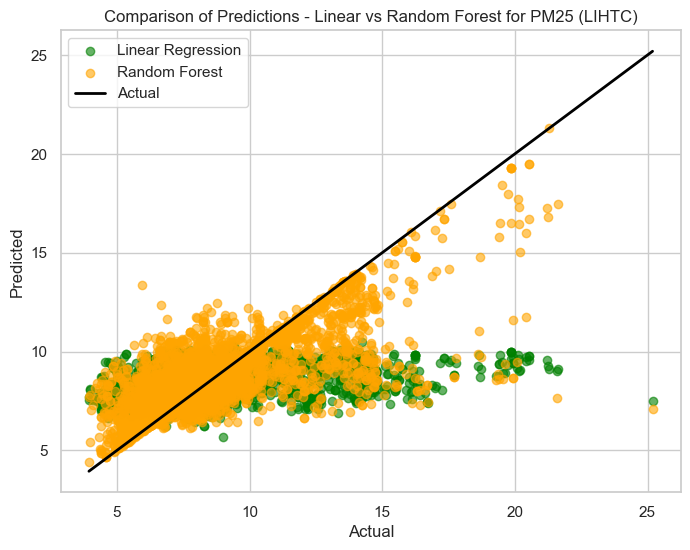

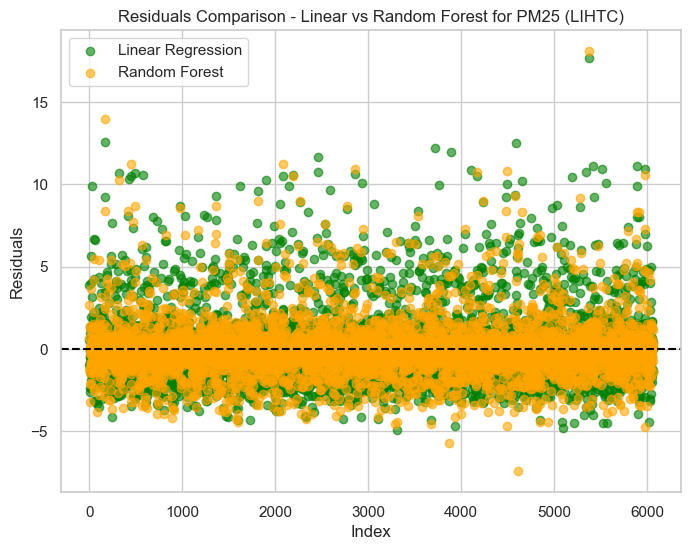

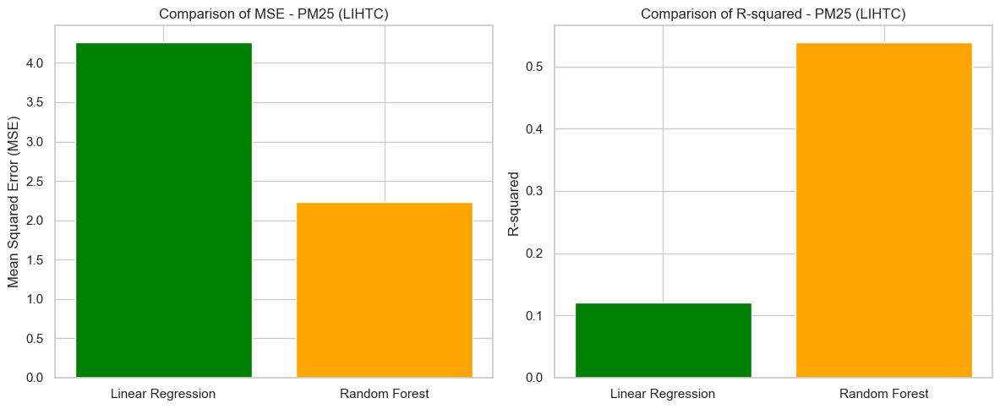

Fitting models for OZONE:
Linear Regression - Testing R-squared: 0.11, Testing MSE: 64.90
Random Forest - Testing R-squared: 0.52, Testing MSE: 34.96


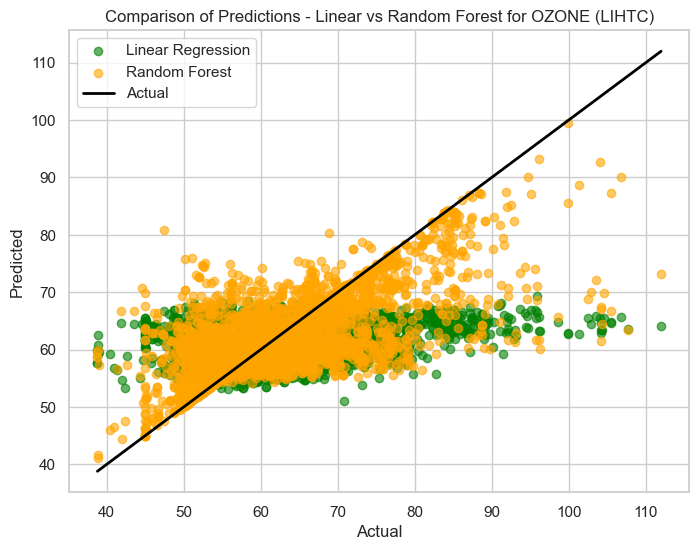

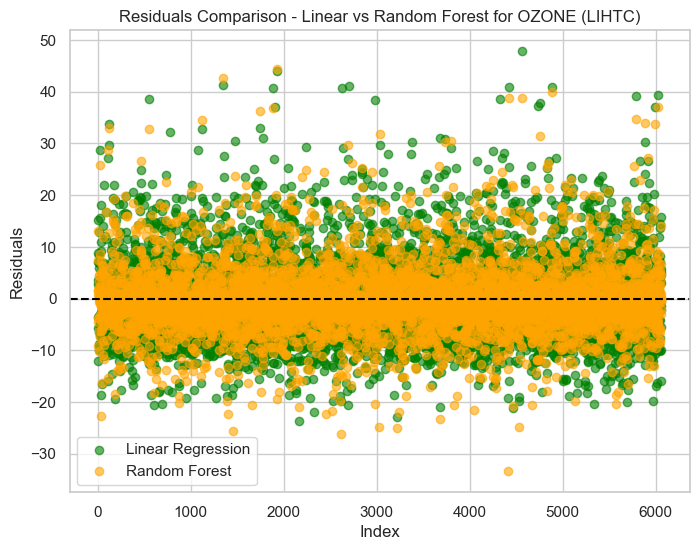

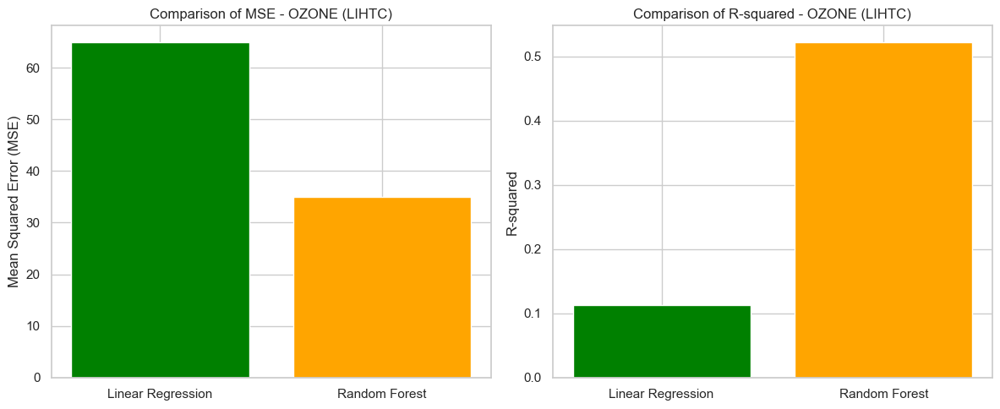

Results for Public Housing Properties:

Fitting models for PM25:
Linear Regression - Testing R-squared: 0.10, Testing MSE: 2.07
Random Forest - Testing R-squared: 0.19, Testing MSE: 1.87


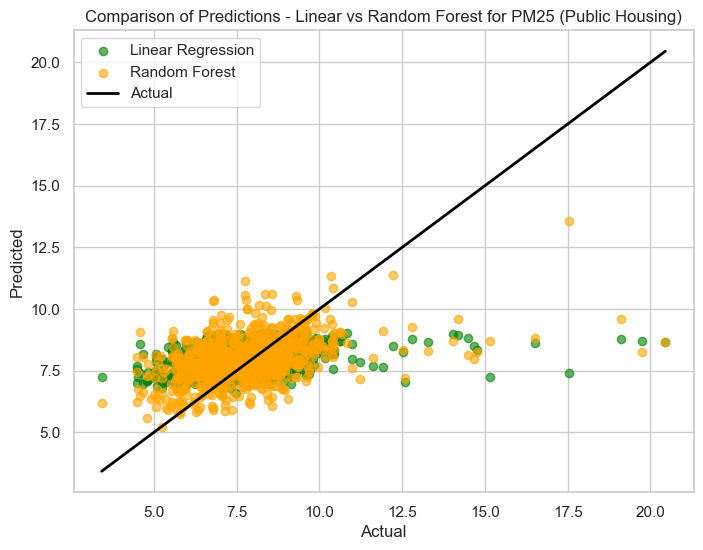

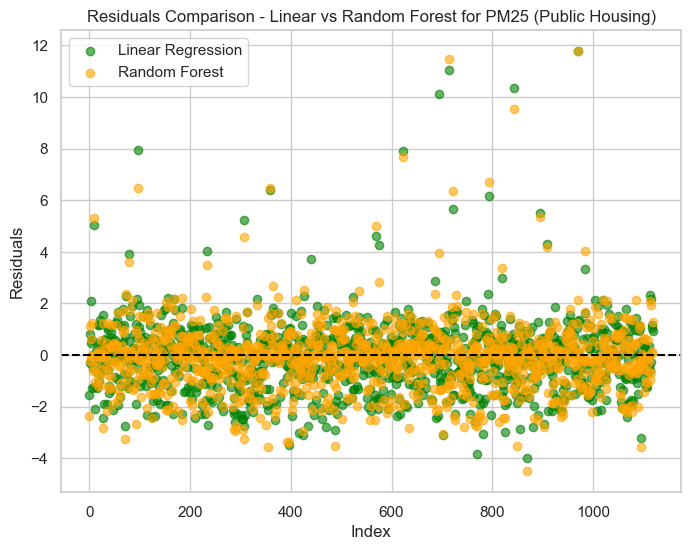

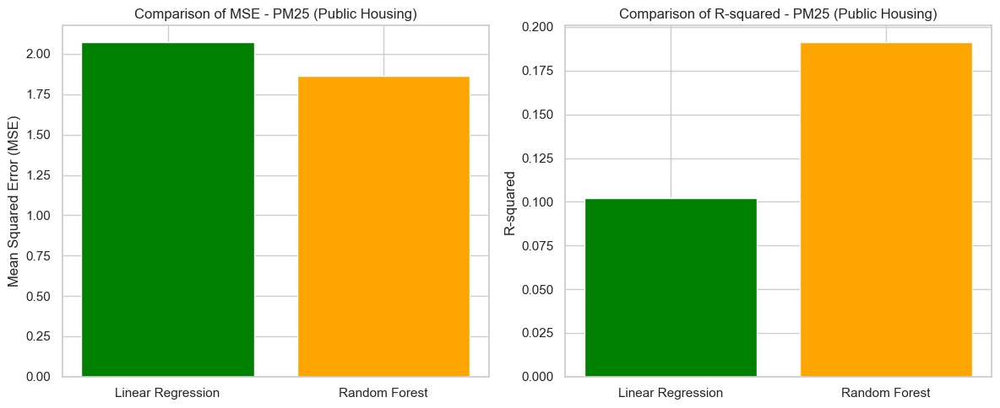

Fitting models for OZONE:
Linear Regression - Testing R-squared: 0.08, Testing MSE: 35.86
Random Forest - Testing R-squared: 0.19, Testing MSE: 31.50


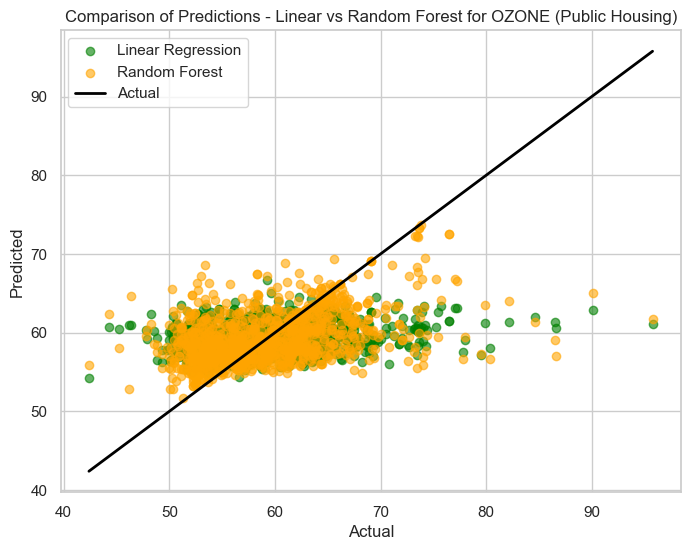

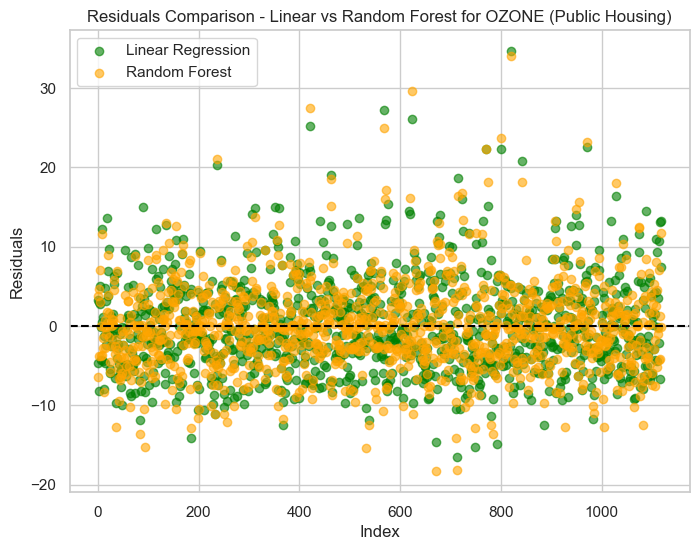

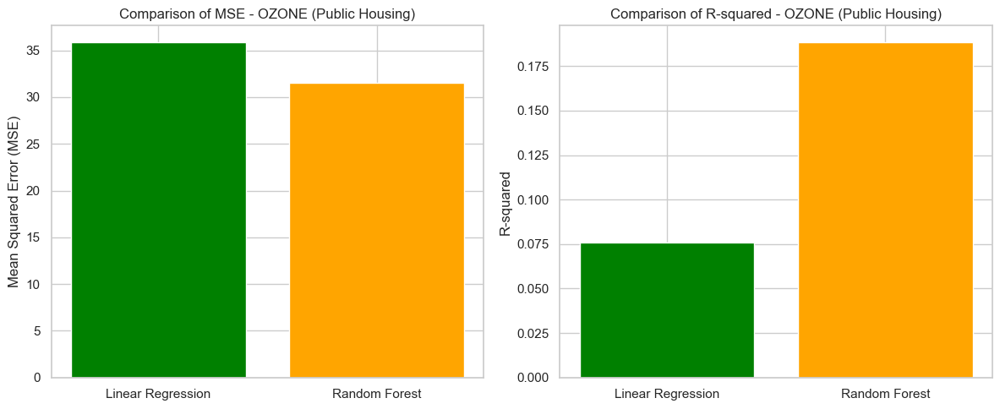

In [72]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
import pandas as pd

# Function to scale the features
def scale_features(X_train, X_test, X_val=None):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)  # Fit on training data
    X_test_scaled = scaler.transform(X_test)        # Use the same scaler for test data
    if X_val is not None:
        X_val_scaled = scaler.transform(X_val)      # Use the same scaler for validation data
        return X_train_scaled, X_test_scaled, X_val_scaled
    return X_train_scaled, X_test_scaled

# Function to create plots for Linear Regression vs Random Forest
def create_comparison_plots(y_test, y_pred_lr, y_pred_rf, pollutant, property_type):
    ### Plot: Predicted vs Actual (Linear vs Random Forest) ###
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred_lr, color='green', label='Linear Regression', alpha=0.6)
    plt.scatter(y_test, y_pred_rf, color='orange', label='Random Forest', alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='black', lw=2, label='Actual')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Comparison of Predictions - Linear vs Random Forest for {pollutant} ({property_type})')
    plt.legend()
    plt.show()

    ### Residuals Comparison Plot ###
    res_lr = y_test - y_pred_lr
    res_rf = y_test - y_pred_rf

    plt.figure(figsize=(8, 6))
    plt.scatter(np.arange(len(res_lr)), res_lr, color='green', label='Linear Regression', alpha=0.6)
    plt.scatter(np.arange(len(res_rf)), res_rf, color='orange', label='Random Forest', alpha=0.6)
    plt.axhline(y=0, color='black', linestyle='--')
    plt.xlabel('Index')
    plt.ylabel('Residuals')
    plt.title(f'Residuals Comparison - Linear vs Random Forest for {pollutant} ({property_type})')
    plt.legend()
    plt.show()

# Function to create bar charts comparing MSE and R-squared
def create_metric_comparison_charts(lr_mse, rf_mse, lr_r2, rf_r2, pollutant, property_type):
    models = ['Linear Regression', 'Random Forest']
    mse_values = [lr_mse, rf_mse]
    r2_values = [lr_r2, rf_r2]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # MSE Bar chart
    axes[0].bar(models, mse_values, color=['green', 'orange'])
    axes[0].set_title(f'Comparison of MSE - {pollutant} ({property_type})')
    axes[0].set_ylabel('Mean Squared Error (MSE)')

    # R-squared Bar chart
    axes[1].bar(models, r2_values, color=['green', 'orange'])
    axes[1].set_title(f'Comparison of R-squared - {pollutant} ({property_type})')
    axes[1].set_ylabel('R-squared')

    plt.tight_layout()
    plt.show()

# Function to fit and evaluate both models (Linear Regression and Random Forest)
def fit_and_evaluate_models(data, property_type):
    print(f"Results for {property_type} Properties:\n")

    # Prepare independent variables (X)
    X = data[['PEOPCOLORPCT','LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
    
    # Iterate over each pollutant as the dependent variable to create models
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"Fitting models for {pollutant}:")

        # Dependent variable (y)
        y = data[pollutant]

        # Handle missing values by concatenating X and y and dropping NaNs
        combined = pd.concat([X, y], axis=1).dropna()
        X_clean = combined.drop(columns=[pollutant])
        y_clean = combined[pollutant]

        # First Split: Train 70% and Temporary Set 30%
        X_train, X_temp, y_train, y_temp = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

        # Second Split on the temporary set: Split the remaining 30% into 20% testing and 10% validation
        X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)

        # Scale the features using StandardScaler
        X_train_scaled, X_test_scaled, X_val_scaled = scale_features(X_train, X_test, X_val)

        # --- Linear Regression Model ---
        reg = LinearRegression()
        reg.fit(X_train_scaled, y_train)

        y_val_pred_lr = reg.predict(X_val_scaled)
        val_r2_lr = r2_score(y_val, y_val_pred_lr)
        val_mse_lr = mean_squared_error(y_val, y_val_pred_lr)

        y_test_pred_lr = reg.predict(X_test_scaled)
        test_r2_lr = r2_score(y_test, y_test_pred_lr)
        test_mse_lr = mean_squared_error(y_test, y_test_pred_lr)

        # --- Random Forest Regression Model ---
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(X_train_scaled, y_train)

        y_val_pred_rf = rf.predict(X_val_scaled)
        val_r2_rf = r2_score(y_val, y_val_pred_rf)
        val_mse_rf = mean_squared_error(y_val, y_val_pred_rf)

        y_test_pred_rf = rf.predict(X_test_scaled)
        test_r2_rf = r2_score(y_test, y_test_pred_rf)
        test_mse_rf = mean_squared_error(y_test, y_test_pred_rf)

        # Print R-squared and MSE for both models
        print(f"Linear Regression - Testing R-squared: {test_r2_lr:.2f}, Testing MSE: {test_mse_lr:.2f}")
        print(f"Random Forest - Testing R-squared: {test_r2_rf:.2f}, Testing MSE: {test_mse_rf:.2f}")

        # Create plots
        create_comparison_plots(y_test, y_test_pred_lr, y_test_pred_rf, pollutant, property_type)
        create_metric_comparison_charts(test_mse_lr, test_mse_rf, test_r2_lr, test_r2_rf, pollutant, property_type)

# Load your combined_df dataset

# Split data into LIHTC and Public Housing
lihtc_df = combined_df[combined_df['PropertyType'] == 'LIHTC']
public_housing_df = combined_df[combined_df['PropertyType'] == 'Public Housing']

# Fit and evaluate models for LIHTC properties
fit_and_evaluate_models(lihtc_df, 'LIHTC')

# Fit and evaluate models for Public Housing properties
fit_and_evaluate_models(public_housing_df, 'Public Housing')


Results for LIHTC Properties:

Fitting models for PM25:
Linear Regression - Testing R-squared: 0.12, Testing MSE: 4.26
Random Forest - Testing R-squared: 0.54, Testing MSE: 2.24
MLP Regressor - Testing R-squared: 0.18, Testing MSE: 3.95

Random Forest consistently outperforms Linear Regression and MLP for PM25 in LIHTC properties.



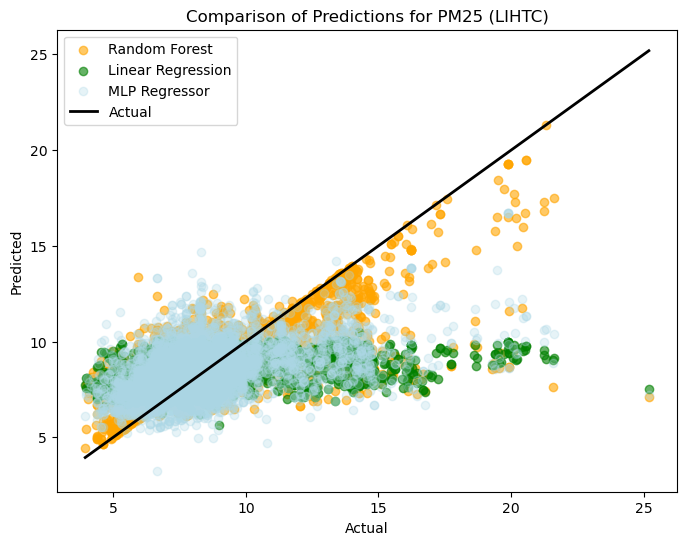

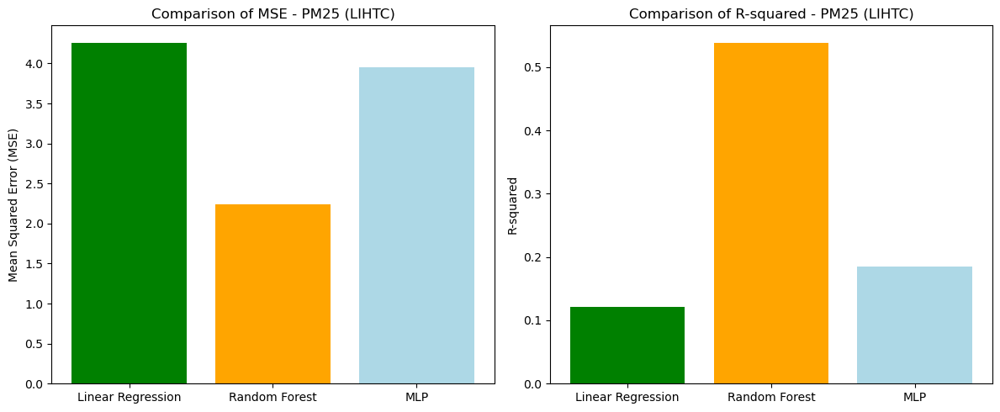

Fitting models for OZONE:
Linear Regression - Testing R-squared: 0.11, Testing MSE: 64.90
Random Forest - Testing R-squared: 0.52, Testing MSE: 34.96
MLP Regressor - Testing R-squared: 0.18, Testing MSE: 60.34

Random Forest consistently outperforms Linear Regression and MLP for OZONE in LIHTC properties.



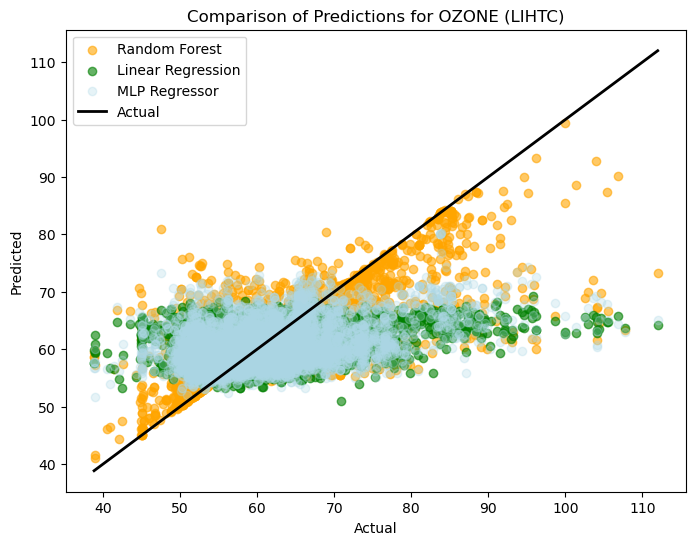

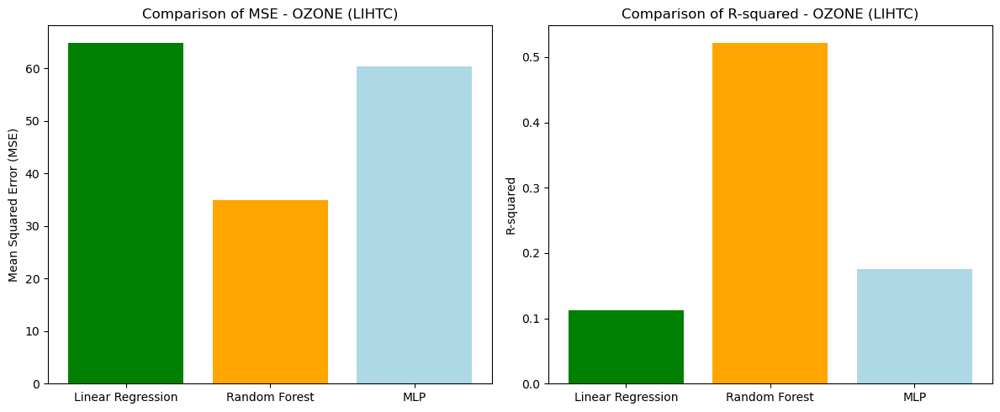

Results for Public Housing Properties:

Fitting models for PM25:
Linear Regression - Testing R-squared: 0.10, Testing MSE: 2.07
Random Forest - Testing R-squared: 0.19, Testing MSE: 1.87
MLP Regressor - Testing R-squared: -0.02, Testing MSE: 2.35

Random Forest consistently outperforms Linear Regression and MLP for PM25 in Public Housing properties.



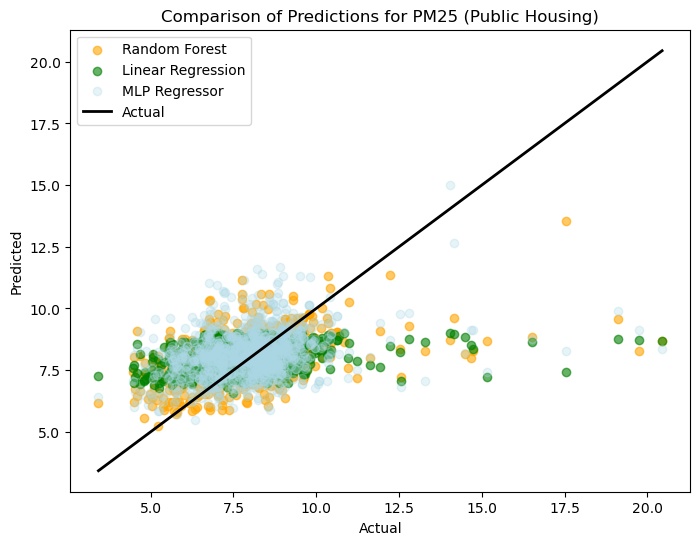

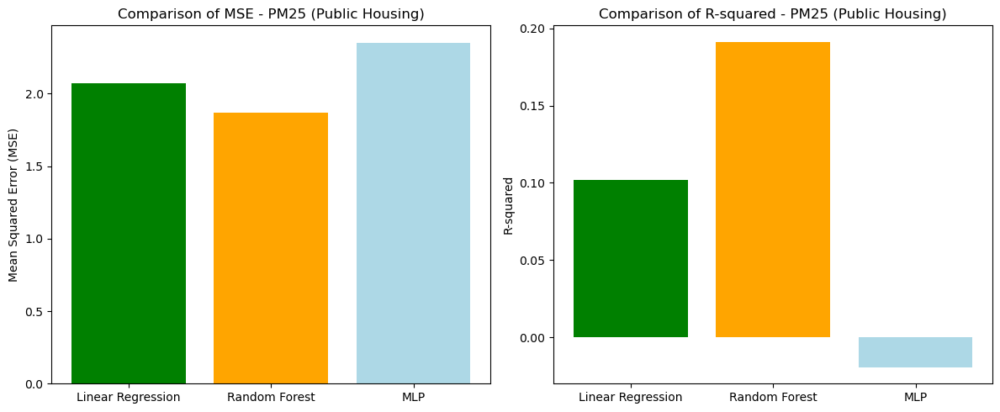

Fitting models for OZONE:
Linear Regression - Testing R-squared: 0.08, Testing MSE: 35.86
Random Forest - Testing R-squared: 0.19, Testing MSE: 31.50
MLP Regressor - Testing R-squared: 0.07, Testing MSE: 36.05

Random Forest consistently outperforms Linear Regression and MLP for OZONE in Public Housing properties.



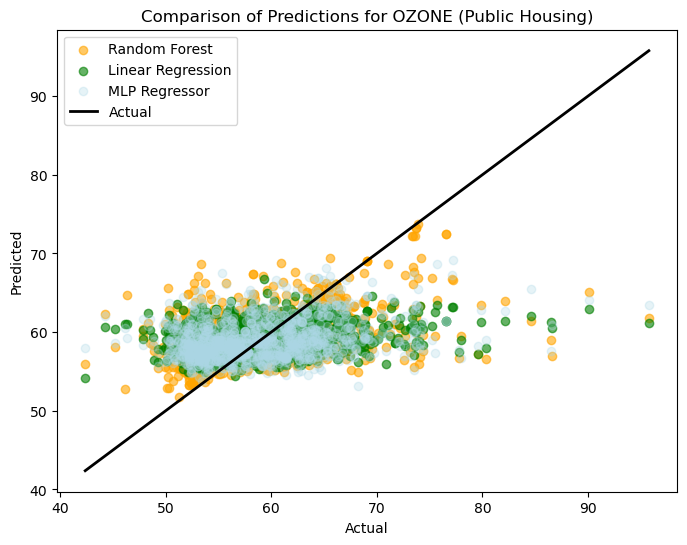

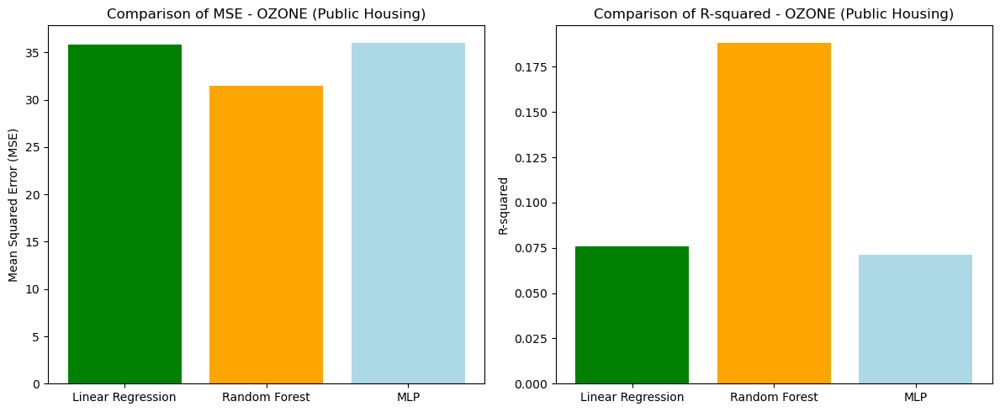

In [42]:
# Function to fit and evaluate Linear Regression, Random Forest, and MLP (Deprioritizing MLP)
def fit_and_evaluate_models_adjusted(data, property_type):
    print(f"Results for {property_type} Properties:\n")

    # Prepare independent variables (X)
    X = data[['PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
    
    # Iterate over each pollutant as the dependent variable to create models
    for pollutant in ['PM25', 'OZONE']:
        if pollutant not in data.columns:
            print(f"Column '{pollutant}' not found in the dataset. Skipping...")
            continue

        print(f"Fitting models for {pollutant}:")

        # Dependent variable (y)
        y = data[pollutant]

        # Handle missing values by concatenating X and y and dropping NaNs
        combined = pd.concat([X, y], axis=1).dropna()
        X_clean = combined.drop(columns=[pollutant])
        y_clean = combined[pollutant]

        # First Split: Train 70% and Temporary Set 30%
        X_train, X_temp, y_train, y_temp = train_test_split(X_clean, y_clean, test_size=0.3, random_state=42)

        # Second Split on the temporary set: Split the remaining 30% into 20% testing and 10% validation
        X_test, X_val, y_test, y_val = train_test_split(X_temp, y_temp, test_size=1/3, random_state=42)

        # Scale the features using StandardScaler
        X_train_scaled, X_test_scaled, X_val_scaled = scale_features(X_train, X_test, X_val)

        # --- Linear Regression Model ---
        reg = LinearRegression()
        reg.fit(X_train_scaled, y_train)

        y_test_pred_lr = reg.predict(X_test_scaled)
        test_r2_lr = r2_score(y_test, y_test_pred_lr)
        test_mse_lr = mean_squared_error(y_test, y_test_pred_lr)

        # --- Random Forest Regression Model ---
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(X_train_scaled, y_train)

        y_test_pred_rf = rf.predict(X_test_scaled)
        test_r2_rf = r2_score(y_test, y_test_pred_rf)
        test_mse_rf = mean_squared_error(y_test, y_test_pred_rf)

        # --- MLP Regression Model ---
        mlp = MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42)
        mlp.fit(X_train_scaled, y_train)

        y_test_pred_mlp = mlp.predict(X_test_scaled)
        test_r2_mlp = r2_score(y_test, y_test_pred_mlp)
        test_mse_mlp = mean_squared_error(y_test, y_test_pred_mlp)

        # Print R-squared and MSE for all models
        print(f"Linear Regression - Testing R-squared: {test_r2_lr:.2f}, Testing MSE: {test_mse_lr:.2f}")
        print(f"Random Forest - Testing R-squared: {test_r2_rf:.2f}, Testing MSE: {test_mse_rf:.2f}")
        print(f"MLP Regressor - Testing R-squared: {test_r2_mlp:.2f}, Testing MSE: {test_mse_mlp:.2f}")

        # Highlight Random Forest as the best-performing model
        print(f"\nRandom Forest consistently outperforms Linear Regression and MLP for {pollutant} in {property_type} properties.\n")

        # Create comparison plots (focus on RF, show others for context)
        plt.figure(figsize=(8, 6))
        plt.scatter(y_test, y_test_pred_rf, color='orange', label='Random Forest', alpha=0.6)
        plt.scatter(y_test, y_test_pred_lr, color='green', label='Linear Regression', alpha=0.6)
        plt.scatter(y_test, y_test_pred_mlp, color='lightblue', label='MLP Regressor', alpha=0.3)
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='black', lw=2, label='Actual')
        plt.xlabel('Actual')
        plt.ylabel('Predicted')
        plt.title(f'Comparison of Predictions for {pollutant} ({property_type})')
        plt.legend()
        plt.show()

        # Metric comparison bar chart (deprioritize MLP)
        models = ['Linear Regression', 'Random Forest', 'MLP']
        mse_values = [test_mse_lr, test_mse_rf, test_mse_mlp]
        r2_values = [test_r2_lr, test_r2_rf, test_r2_mlp]

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        # MSE Bar chart
        axes[0].bar(models, mse_values, color=['green', 'orange', 'lightblue'])
        axes[0].set_title(f'Comparison of MSE - {pollutant} ({property_type})')
        axes[0].set_ylabel('Mean Squared Error (MSE)')

        # R-squared Bar chart
        axes[1].bar(models, r2_values, color=['green', 'orange', 'lightblue'])
        axes[1].set_title(f'Comparison of R-squared - {pollutant} ({property_type})')
        axes[1].set_ylabel('R-squared')

        plt.tight_layout()
        plt.show()

# Load your combined_df dataset

# Split data into LIHTC and Public Housing
lihtc_df = combined_df[combined_df['PropertyType'] == 'LIHTC']
public_housing_df = combined_df[combined_df['PropertyType'] == 'Public Housing']

# Fit and evaluate models for LIHTC properties
fit_and_evaluate_models_adjusted(lihtc_df, 'LIHTC')

# Fit and evaluate models for Public Housing properties
fit_and_evaluate_models_adjusted(public_housing_df, 'Public Housing')


In [9]:
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix
import warnings
warnings.filterwarnings('ignore')


In [11]:
# Load dataset
Spatial_df = pd.read_csv("C:/Users/19147/Downloads/spatial_analysis_with_categories_and_hotspots.csv")

In [13]:
Spatial_df.head()

,PM25,OZONE,PEOPCOLOR,PEOPCOLORPCT,LOWINCOME,LOWINCPCT,UNEMPLOYED,UNEMPPCT,UNDER5,UNDER5PCT,...,County,CensusTract,Longitude,Latitude,Exceeds_PM25,Exceeds_OZONE,Pollution_Hotspot,PM25_Category,OZONE_Category,PropertyType
0,3.420784,56.51046,451,0.087386,1153,0.237830,140,0.045031,88,0.017051,...,Hancock,23009965900,-68.212616,44.385757,0,0,NOT HOTSPOT,Good,Moderate,Public Housing
1,3.558923,61.08125,3054,0.847627,1607,0.453698,304,0.196382,194,0.053844,...,Fremont,56013940100,-108.889122,43.003822,0,0,NOT HOTSPOT,Good,Moderate,LIHTC
2,3.561127,56.96108,22,0.013158,322,0.193046,14,0.013346,49,0.029306,...,Hancock,23009966000,-68.289300,44.294300,0,0,NOT HOTSPOT,Good,Moderate,Public Housing
3,3.609314,57.73865,27,0.016383,437,0.267934,28,0.031854,67,0.040655,...,Hancock,23009966100,-68.326599,44.279526,0,0,NOT HOTSPOT,Good,Moderate,Public Housing
4,3.707365,54.54622,456,0.109827,1308,0.328561,63,0.027717,137,0.032996,...,Hancock,23009965503,-68.418670,44.535170,0,0,NOT HOTSPOT,Good,Moderate,LIHTC


In [4]:
Spatial_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35922 entries, 0 to 35921
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   PM25               35922 non-null  float64
 1   OZONE              35922 non-null  float64
 2   PEOPCOLOR          35922 non-null  int64  
 3   PEOPCOLORPCT       35922 non-null  float64
 4   LOWINCOME          35922 non-null  int64  
 5   LOWINCPCT          35922 non-null  float64
 6   UNEMPLOYED         35922 non-null  int64  
 7   UNEMPPCT           35922 non-null  float64
 8   UNDER5             35922 non-null  int64  
 9   UNDER5PCT          35922 non-null  float64
 10  OVER64             35922 non-null  int64  
 11  OVER64PCT          35922 non-null  float64
 12  LIFEEXPPCT         35922 non-null  float64
 13  P_PM25             35922 non-null  int64  
 14  P_OZONE            35922 non-null  int64  
 15  City               35922 non-null  object 
 16  State              359

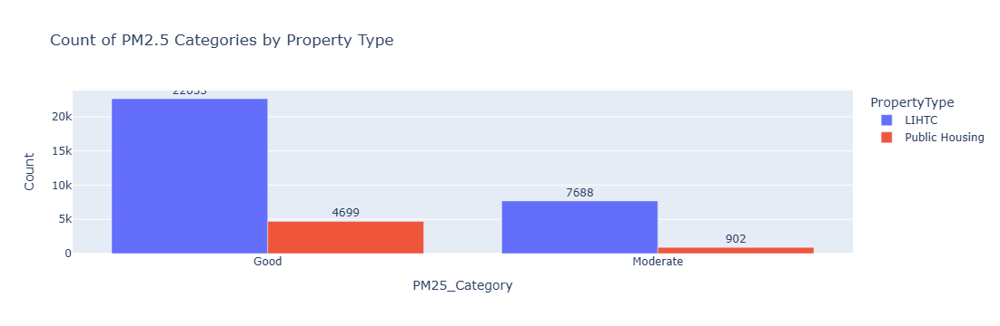

In [56]:
import plotly.express as px

# Function to create an interactive bar chart of counts by category and property type
def plot_interactive_pollution_barchart(df, category_column, title):
    # Calculate the count for each category within each property type
    pollution_summary = df.groupby(['PropertyType', category_column]).size().reset_index(name='count')

    # Create an interactive bar chart with Plotly
    fig = px.bar(
        pollution_summary,
        x=category_column,
        y="count",
        color="PropertyType",
        barmode='group',
        text="count",
        labels={
            "count": "Count"
        },
        title=title
    )
    
    fig.update_traces(
        texttemplate='%{text}', textposition='outside'
    )
    fig.update_layout(
        xaxis_title=category_column,
        yaxis_title="Count",
        hovermode="x unified"
    )
    fig.show()

# Apply the function for PM2.5 categories
plot_interactive_pollution_barchart(Spatial_df, 'PM25_Category', 'Count of PM2.5 Categories by Property Type')


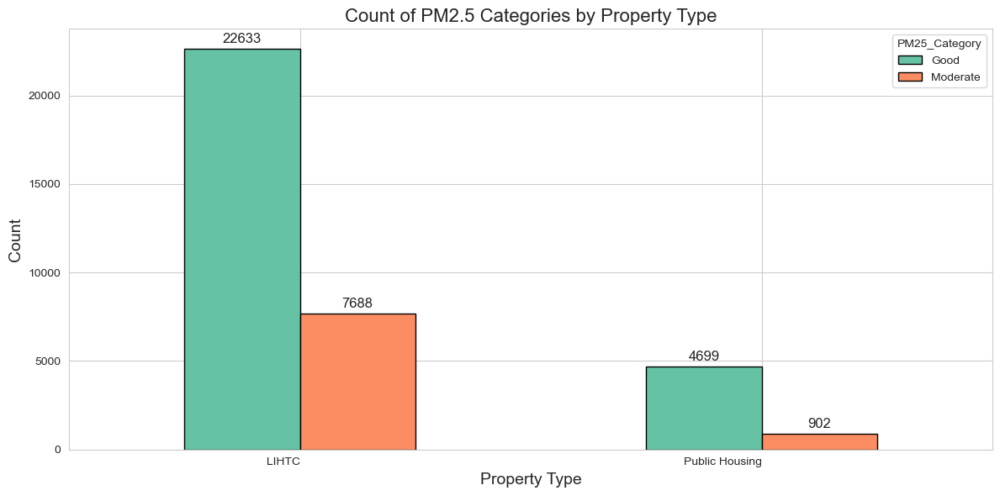

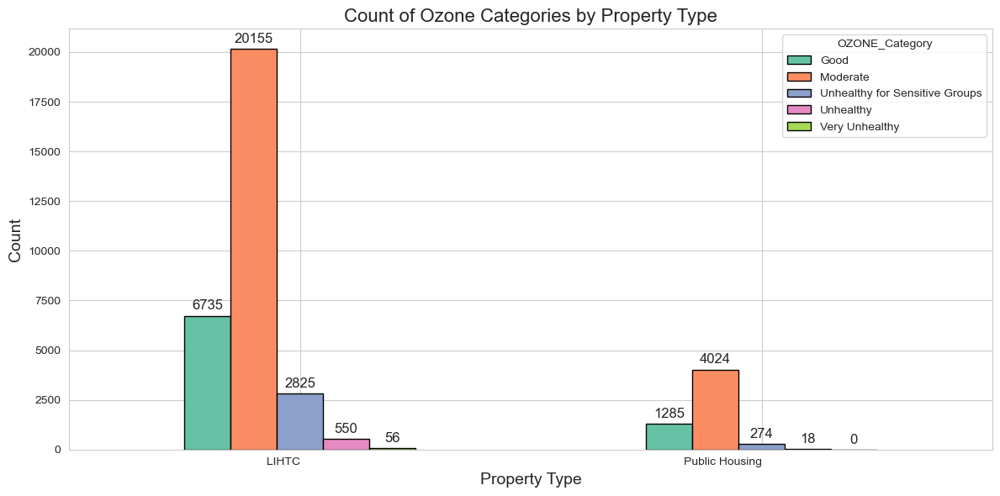

In [108]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Set a style for the plots
sns.set_style("whitegrid")

# Function to create a non-interactive, styled bar chart for PM2.5 counts by category and property type
def plot_pm25_barchart(df, title):
    pm25_summary = df.groupby(['PropertyType', 'PM25_Category']).size().unstack(fill_value=0)
    pm25_summary = pm25_summary[["Good", "Moderate"]]

    ax = pm25_summary.plot(kind='bar', stacked=False, figsize=(12, 6), color=sns.color_palette("Set2"), edgecolor='black')
    plt.title(title, fontsize=16)
    plt.xlabel('Property Type', fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(rotation=0, ha='right')
    
    # Add counts on top of each bar
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=12, padding=3)

    plt.tight_layout()
    plt.show()

# Function to create a non-interactive, styled bar chart for Ozone counts by category and property type
def plot_ozone_barchart(df, title):
    category_order = ["Good", "Moderate", "Unhealthy for Sensitive Groups", "Unhealthy", "Very Unhealthy"]
    filtered_df = df[df['OZONE_Category'].isin(category_order)]
    filtered_df['OZONE_Category'] = pd.Categorical(filtered_df['OZONE_Category'], categories=category_order, ordered=True)

    ozone_summary = filtered_df.groupby(['PropertyType', 'OZONE_Category']).size().unstack(fill_value=0)
    ozone_summary = ozone_summary[category_order]

    ax = ozone_summary.plot(kind='bar', stacked=False, figsize=(12, 6), color=sns.color_palette("Set2"), edgecolor='black')
    plt.title(title, fontsize=16)
    plt.xlabel('Property Type', fontsize=14)
    plt.ylabel('Count', fontsize=14)
    plt.xticks(rotation=0, ha='right')
    
    # Add counts on top of each bar
    for container in ax.containers:
        ax.bar_label(container, label_type='edge', fontsize=12, padding=3)

    plt.tight_layout()
    plt.show()

# Apply the function for PM2.5 categories
plot_pm25_barchart(Spatial_df, 'Count of PM2.5 Categories by Property Type')

# Apply the function for Ozone categories
plot_ozone_barchart(Spatial_df, 'Count of Ozone Categories by Property Type')


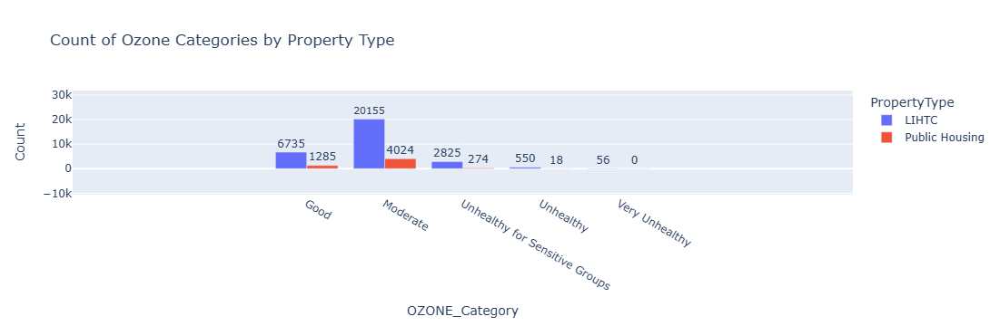

In [58]:
import plotly.express as px
import pandas as pd

# Function to create an interactive bar chart of average Ozone levels and counts by category and property type
def plot_ozone_barchart(df, title):
    # Define the desired order of categories for Ozone
    category_order = ["Good", "Moderate", "Unhealthy for Sensitive Groups", "Unhealthy", "Very Unhealthy"]

    # Filter to only include categories in the specified order and ensure they appear in this order
    filtered_df = df[df['OZONE_Category'].isin(category_order)]
    filtered_df['OZONE_Category'] = pd.Categorical(filtered_df['OZONE_Category'], categories=category_order, ordered=True)

    # Calculate the mean Ozone level and count for each category within each property type
    ozone_summary = filtered_df.groupby(['PropertyType', 'OZONE_Category']).agg(
        avg_ozone=('OZONE', 'mean'),
        count=('OZONE', 'size')
    ).reset_index()

    # Create an interactive bar chart with Plotly
    fig = px.bar(
        ozone_summary,
        x="OZONE_Category",
        y="avg_ozone",
        color="PropertyType",
        barmode='group',
        hover_data={"count": True},
        text="count",
        labels={
            "avg_ozone": "Average OZONE Level",
            "count": "Count"
        },
        title=title
    )
    
    fig.update_traces(
        texttemplate='%{text}', textposition='outside'
    )
    fig.update_layout(
        xaxis_title="OZONE_Category",
        yaxis_title="Average OZONE Level",
        hovermode="x unified"
    )
    fig.show()

# Apply the function for Ozone levels
plot_ozone_barchart(Spatial_df, 'Average Ozone Levels by Category and Property Type')


In [9]:
# Check dataset size and memory usage
print(Spatial_df.info(memory_usage='deep'))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35922 entries, 0 to 35921
Data columns (total 27 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   PM25               35922 non-null  float64
 1   OZONE              35922 non-null  float64
 2   PEOPCOLOR          35922 non-null  int64  
 3   PEOPCOLORPCT       35922 non-null  float64
 4   LOWINCOME          35922 non-null  int64  
 5   LOWINCPCT          35922 non-null  float64
 6   UNEMPLOYED         35922 non-null  int64  
 7   UNEMPPCT           35922 non-null  float64
 8   UNDER5             35922 non-null  int64  
 9   UNDER5PCT          35922 non-null  float64
 10  OVER64             35922 non-null  int64  
 11  OVER64PCT          35922 non-null  float64
 12  LIFEEXPPCT         35922 non-null  float64
 13  P_PM25             35922 non-null  int64  
 14  P_OZONE            35922 non-null  int64  
 15  City               35922 non-null  object 
 16  State              359

## Ensemble Classifiers 


Analyzing PM2.5 Category for LIHTC...


Results for PM2.5 for LIHTC Category Classification:

Logistic Regression Validation Score: 0.6470976253298153
Logistic Regression Cross-Validation Scores: [0.65505725 0.65786544 0.64991252 0.66120566 0.65293463]
Logistic Regression Mean Cross-Validation Score: 0.6553950991807886
Logistic Regression Training Score: 0.6547270645120244
Logistic Regression Test Accuracy: 0.638911788953009

Classification Report for Logistic Regression:
               precision    recall  f1-score   support

        Good       0.85      0.63      0.72      4532
    Moderate       0.38      0.66      0.48      1533

    accuracy                           0.64      6065
   macro avg       0.61      0.65      0.60      6065
weighted avg       0.73      0.64      0.66      6065


Confusion Matrix for Logistic Regression:


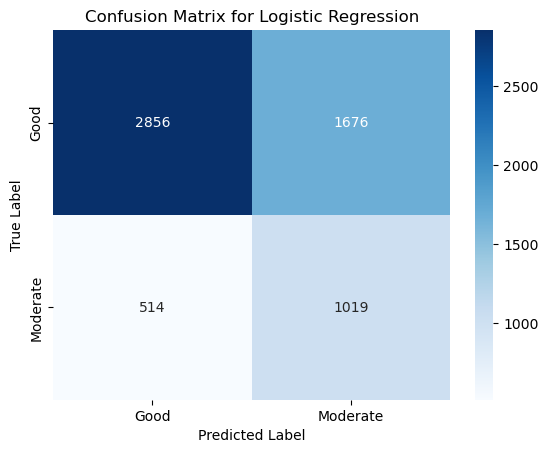

Gradient Boosting Validation Score: 0.6398416886543535
Gradient Boosting Cross-Validation Scores: [0.67954835 0.68347383 0.66868141 0.68506442 0.6828376 ]
Gradient Boosting Mean Cross-Validation Score: 0.6799211214141544
Gradient Boosting Training Score: 0.6834839038045553
Gradient Boosting Test Accuracy: 0.6280296784830998

Classification Report for Gradient Boosting:
               precision    recall  f1-score   support

        Good       0.87      0.59      0.70      4532
    Moderate       0.38      0.73      0.50      1533

    accuracy                           0.63      6065
   macro avg       0.62      0.66      0.60      6065
weighted avg       0.74      0.63      0.65      6065


Confusion Matrix for Gradient Boosting:


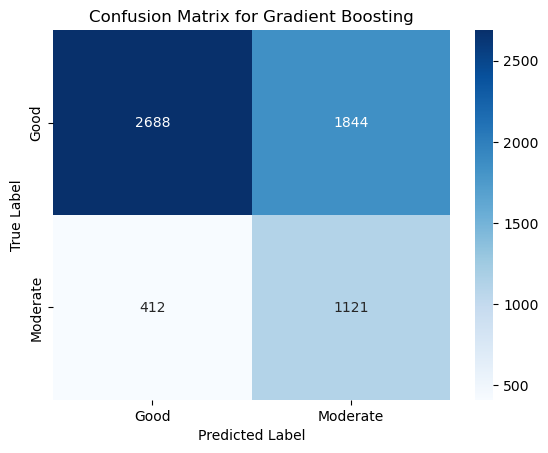

Random Forest Validation Score: 0.8733509234828496
Random Forest Cross-Validation Scores: [0.89233461 0.88961349 0.90901861 0.90710991 0.89995228]
Random Forest Mean Cross-Validation Score: 0.8996057790804646
Random Forest Training Score: 1.0
Random Forest Test Accuracy: 0.854080791426216

Classification Report for Random Forest:
               precision    recall  f1-score   support

        Good       0.91      0.90      0.90      4532
    Moderate       0.71      0.72      0.71      1533

    accuracy                           0.85      6065
   macro avg       0.81      0.81      0.81      6065
weighted avg       0.86      0.85      0.85      6065


Confusion Matrix for Random Forest:


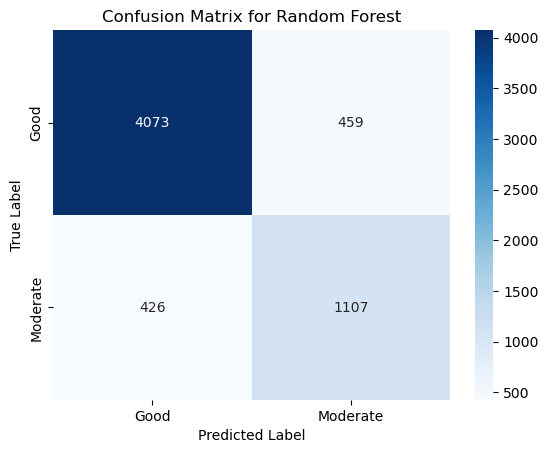


Feature Importances for Random Forest:
PEOPCOLORPCT: 0.2607
LOWINCPCT: 0.1571
OVER64PCT: 0.1548
LIFEEXPPCT: 0.1476
UNEMPPCT: 0.1442
UNDER5PCT: 0.1356
Extra Trees Validation Score: 0.8651055408970977
Extra Trees Cross-Validation Scores: [0.90744275 0.90679179 0.92301575 0.9212661  0.92047081]
Extra Trees Mean Cross-Validation Score: 0.9157974409814509
Extra Trees Training Score: 1.0
Extra Trees Test Accuracy: 0.855234954657873

Classification Report for Extra Trees:
               precision    recall  f1-score   support

        Good       0.90      0.90      0.90      4532
    Moderate       0.71      0.71      0.71      1533

    accuracy                           0.86      6065
   macro avg       0.81      0.81      0.81      6065
weighted avg       0.86      0.86      0.86      6065


Confusion Matrix for Extra Trees:


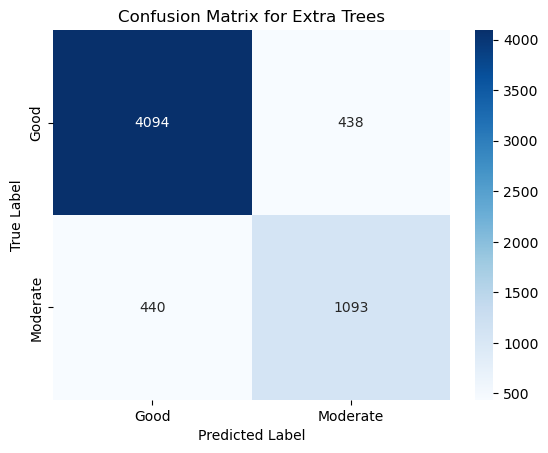


Feature Importances for Extra Trees:
PEOPCOLORPCT: 0.2619
LOWINCPCT: 0.1566
OVER64PCT: 0.1530
LIFEEXPPCT: 0.1476
UNEMPPCT: 0.1430
UNDER5PCT: 0.1378

Stacking Classifier Validation Score: 0.8660949868073878
Stacking Classifier Cross-Validation Scores: [0.89885496 0.89168125 0.90949578 0.90901861 0.90488309]
Stacking Classifier Mean Cross-Validation Score: 0.9027867391454801
Stacking Classifier Test Accuracy: 0.8586974443528442

Classification Report for Stacking Classifier:
               precision    recall  f1-score   support

        Good       0.89      0.92      0.91      4532
    Moderate       0.74      0.68      0.71      1533

    accuracy                           0.86      6065
   macro avg       0.82      0.80      0.81      6065
weighted avg       0.86      0.86      0.86      6065


Confusion Matrix for Stacking Classifier:


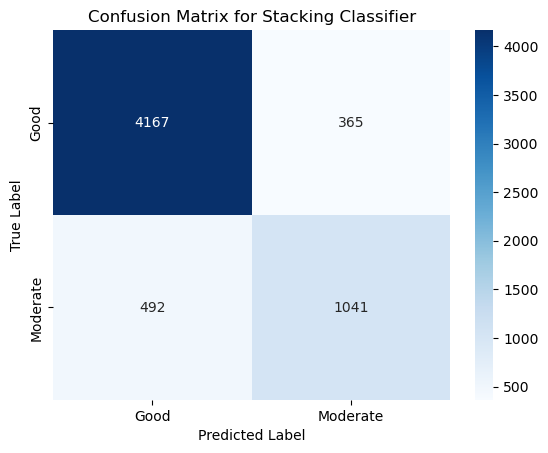


Analyzing Ozone Category for LIHTC...


Results for Ozone for LIHTC Category Classification:

Logistic Regression Validation Score: 0.2519788918205805
Logistic Regression Cross-Validation Scores: [0.42568193 0.42119507 0.43280393 0.43216295 0.43266149]
Logistic Regression Mean Cross-Validation Score: 0.42890107542197853
Logistic Regression Training Score: 0.42905775941884483
Logistic Regression Test Accuracy: 0.26957955482275353

Classification Report for Logistic Regression:
                                 precision    recall  f1-score   support

                          Good       0.30      0.57      0.40      1353
                      Moderate       0.70      0.17      0.27      4025
                     Unhealthy       0.07      0.54      0.13       106
Unhealthy for Sensitive Groups       0.15      0.20      0.17       565
                Very Unhealthy       0.01      0.75      0.02        16

                      accuracy                           0.27      6065
           

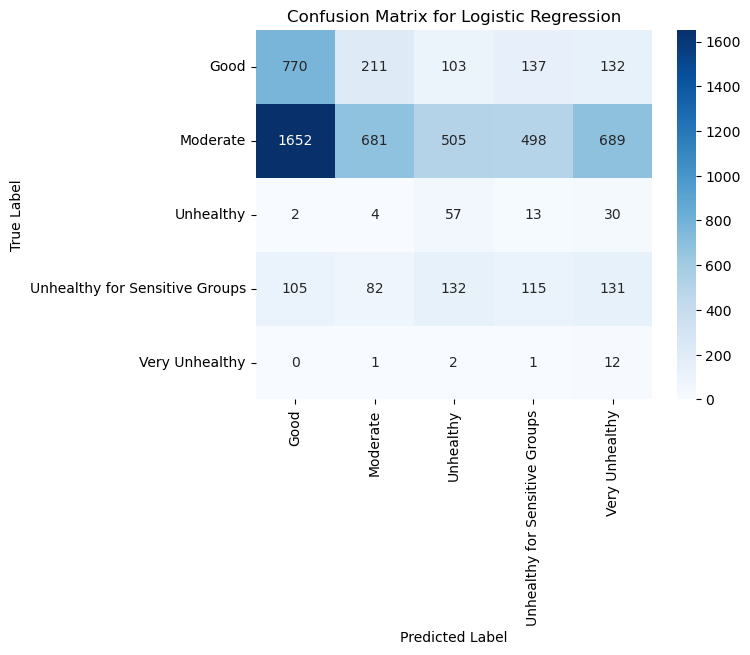

Gradient Boosting Validation Score: 0.3740105540897098
Gradient Boosting Cross-Validation Scores: [0.60366071 0.60729293 0.60722171 0.61249199 0.60914465]
Gradient Boosting Mean Cross-Validation Score: 0.6079623958407521
Gradient Boosting Training Score: 0.6175913396481733
Gradient Boosting Test Accuracy: 0.39686727122835946

Classification Report for Gradient Boosting:
                                 precision    recall  f1-score   support

                          Good       0.35      0.55      0.43      1353
                      Moderate       0.79      0.34      0.47      4025
                     Unhealthy       0.10      0.72      0.17       106
Unhealthy for Sensitive Groups       0.19      0.37      0.25       565
                Very Unhealthy       0.02      0.50      0.05        16

                      accuracy                           0.40      6065
                     macro avg       0.29      0.50      0.27      6065
                  weighted avg       0.62      0

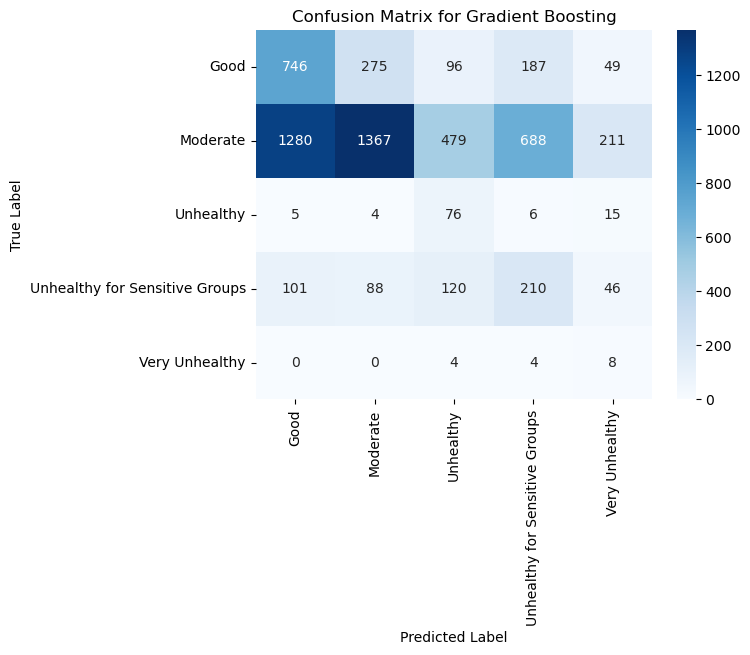

Random Forest Validation Score: 0.783311345646438
Random Forest Cross-Validation Scores: [0.92707072 0.92934976 0.93989032 0.93832348 0.9376825 ]
Random Forest Mean Cross-Validation Score: 0.9344633573107328
Random Forest Training Score: 1.0
Random Forest Test Accuracy: 0.7780708985985161

Classification Report for Random Forest:
                                 precision    recall  f1-score   support

                          Good       0.71      0.69      0.70      1353
                      Moderate       0.86      0.84      0.85      4025
                     Unhealthy       0.34      0.64      0.45       106
Unhealthy for Sensitive Groups       0.56      0.61      0.59       565
                Very Unhealthy       0.32      0.38      0.34        16

                      accuracy                           0.78      6065
                     macro avg       0.56      0.63      0.58      6065
                  weighted avg       0.79      0.78      0.78      6065


Confusion Matri

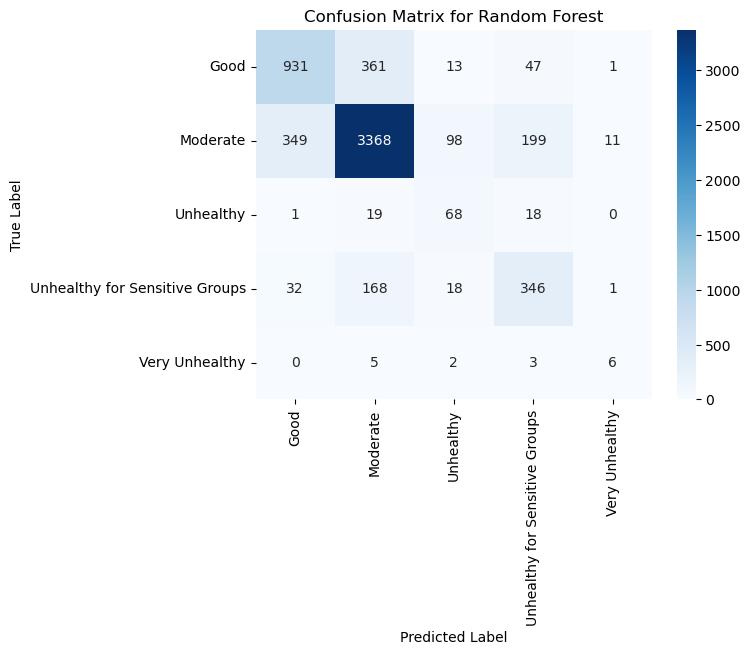


Feature Importances for Random Forest:
PEOPCOLORPCT: 0.2269
LOWINCPCT: 0.1770
LIFEEXPPCT: 0.1595
OVER64PCT: 0.1554
UNEMPPCT: 0.1415
UNDER5PCT: 0.1396
Extra Trees Validation Score: 0.7961741424802111
Extra Trees Cross-Validation Scores: [0.93967666 0.9412435  0.9480094  0.9480094  0.9515704 ]
Extra Trees Mean Cross-Validation Score: 0.9457018730859625
Extra Trees Training Score: 1.0
Extra Trees Test Accuracy: 0.7841714756801319

Classification Report for Extra Trees:
                                 precision    recall  f1-score   support

                          Good       0.71      0.67      0.69      1353
                      Moderate       0.86      0.85      0.85      4025
                     Unhealthy       0.36      0.64      0.46       106
Unhealthy for Sensitive Groups       0.59      0.60      0.59       565
                Very Unhealthy       0.47      0.44      0.45        16

                      accuracy                           0.78      6065
                     

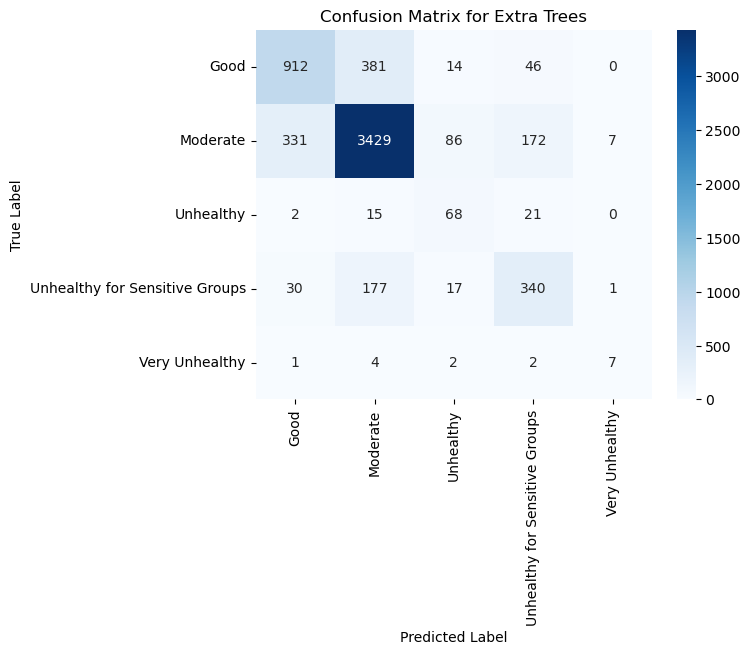


Feature Importances for Extra Trees:
PEOPCOLORPCT: 0.2380
LOWINCPCT: 0.1662
LIFEEXPPCT: 0.1630
OVER64PCT: 0.1506
UNEMPPCT: 0.1416
UNDER5PCT: 0.1406

Stacking Classifier Validation Score: 0.8265171503957783
Stacking Classifier Cross-Validation Scores: [0.94508938 0.94601524 0.953707   0.95342212 0.95470408]
Stacking Classifier Mean Cross-Validation Score: 0.9505875649882487
Stacking Classifier Test Accuracy: 0.8077493816982687

Classification Report for Stacking Classifier:
                                 precision    recall  f1-score   support

                          Good       0.78      0.64      0.70      1353
                      Moderate       0.83      0.91      0.87      4025
                     Unhealthy       0.62      0.58      0.60       106
Unhealthy for Sensitive Groups       0.67      0.55      0.60       565
                Very Unhealthy       0.86      0.38      0.52        16

                      accuracy                           0.81      6065
              

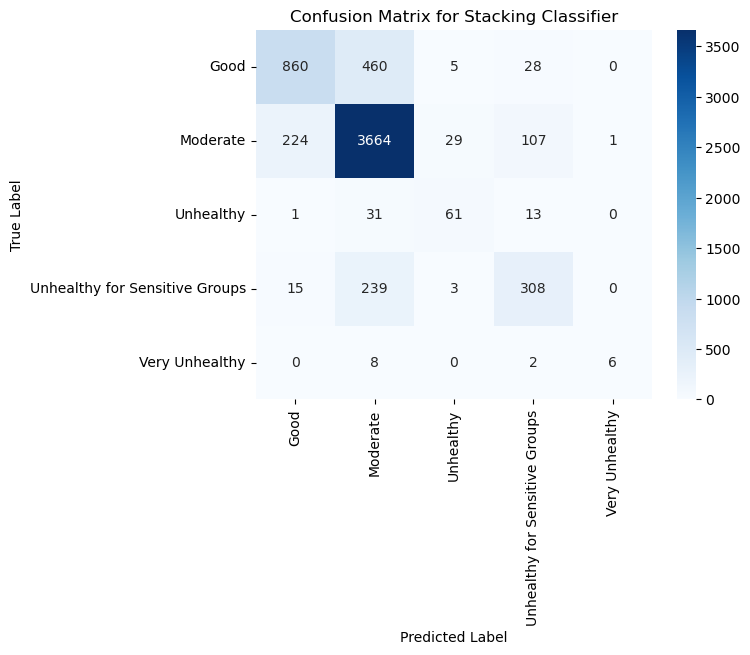


Analyzing PM2.5 Category for Public Housing...


Results for PM2.5 for Public Housing Category Classification:

Logistic Regression Validation Score: 0.6232142857142857
Logistic Regression Cross-Validation Scores: [0.64642583 0.66641045 0.67923077 0.66923077 0.67307692]
Logistic Regression Mean Cross-Validation Score: 0.6668749482646484
Logistic Regression Training Score: 0.6673331282682251
Logistic Regression Test Accuracy: 0.6574487065120428

Classification Report for Logistic Regression:
               precision    recall  f1-score   support

        Good       0.92      0.65      0.76       947
    Moderate       0.26      0.67      0.38       174

    accuracy                           0.66      1121
   macro avg       0.59      0.66      0.57      1121
weighted avg       0.81      0.66      0.70      1121


Confusion Matrix for Logistic Regression:


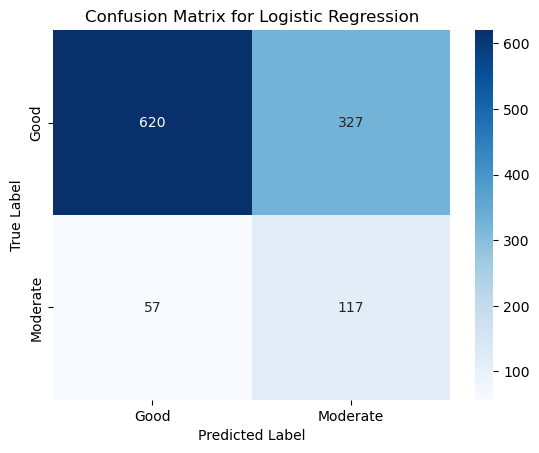

Gradient Boosting Validation Score: 0.625
Gradient Boosting Cross-Validation Scores: [0.67486549 0.72790161 0.71769231 0.70461538 0.72846154]
Gradient Boosting Mean Cross-Validation Score: 0.710707266599657
Gradient Boosting Training Score: 0.7350046139649339
Gradient Boosting Test Accuracy: 0.6351471900089206

Classification Report for Gradient Boosting:
               precision    recall  f1-score   support

        Good       0.93      0.62      0.74       947
    Moderate       0.26      0.74      0.39       174

    accuracy                           0.64      1121
   macro avg       0.60      0.68      0.56      1121
weighted avg       0.82      0.64      0.69      1121


Confusion Matrix for Gradient Boosting:


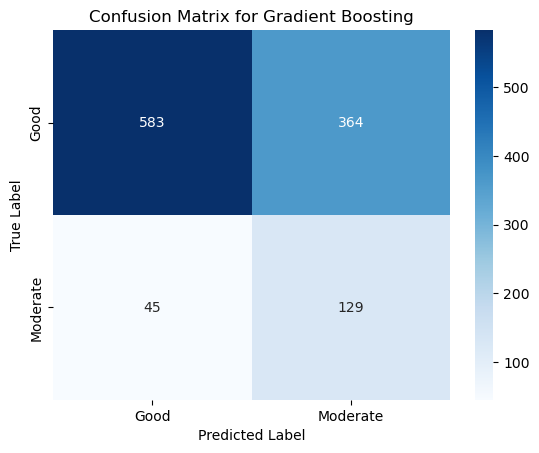

Random Forest Validation Score: 0.8339285714285715
Random Forest Cross-Validation Scores: [0.8754804  0.90930054 0.89692308 0.87846154 0.89461538]
Random Forest Mean Cross-Validation Score: 0.89095618754804
Random Forest Training Score: 1.0
Random Forest Test Accuracy: 0.8322925958965209

Classification Report for Random Forest:
               precision    recall  f1-score   support

        Good       0.90      0.90      0.90       947
    Moderate       0.46      0.44      0.45       174

    accuracy                           0.83      1121
   macro avg       0.68      0.67      0.68      1121
weighted avg       0.83      0.83      0.83      1121


Confusion Matrix for Random Forest:


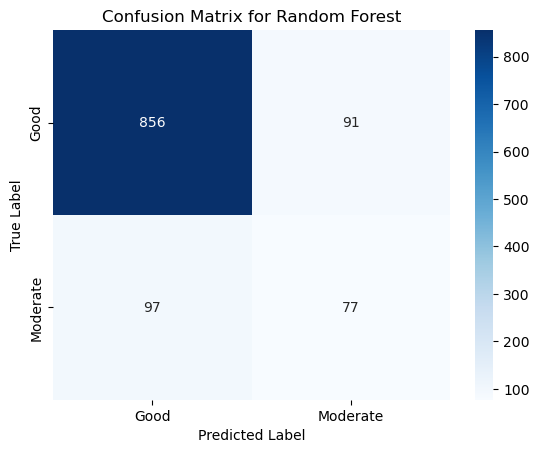


Feature Importances for Random Forest:
PEOPCOLORPCT: 0.2513
LOWINCPCT: 0.1763
OVER64PCT: 0.1523
UNEMPPCT: 0.1521
LIFEEXPPCT: 0.1370
UNDER5PCT: 0.1310
Extra Trees Validation Score: 0.8571428571428571
Extra Trees Cross-Validation Scores: [0.91544965 0.91929285 0.91846154 0.89846154 0.92615385]
Extra Trees Mean Cross-Validation Score: 0.9155638857683439
Extra Trees Training Score: 1.0
Extra Trees Test Accuracy: 0.8456735057983943

Classification Report for Extra Trees:
               precision    recall  f1-score   support

        Good       0.89      0.93      0.91       947
    Moderate       0.50      0.40      0.44       174

    accuracy                           0.85      1121
   macro avg       0.70      0.66      0.68      1121
weighted avg       0.83      0.85      0.84      1121


Confusion Matrix for Extra Trees:


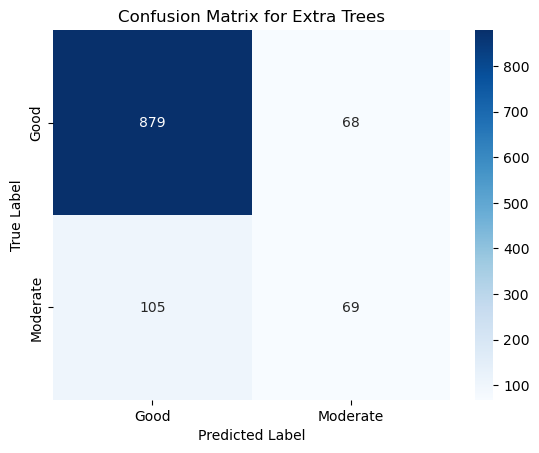


Feature Importances for Extra Trees:
PEOPCOLORPCT: 0.2633
LOWINCPCT: 0.1676
OVER64PCT: 0.1519
UNEMPPCT: 0.1463
LIFEEXPPCT: 0.1381
UNDER5PCT: 0.1327

Stacking Classifier Validation Score: 0.8589285714285714
Stacking Classifier Cross-Validation Scores: [0.89623367 0.90622598 0.89384615 0.88923077 0.90307692]
Stacking Classifier Mean Cross-Validation Score: 0.8977226985159346
Stacking Classifier Test Accuracy: 0.8545941123996432

Classification Report for Stacking Classifier:
               precision    recall  f1-score   support

        Good       0.90      0.93      0.92       947
    Moderate       0.54      0.43      0.48       174

    accuracy                           0.85      1121
   macro avg       0.72      0.68      0.70      1121
weighted avg       0.84      0.85      0.85      1121


Confusion Matrix for Stacking Classifier:


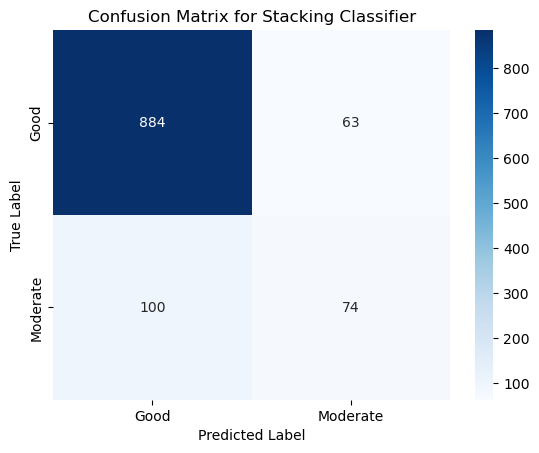


Analyzing Ozone Category for Public Housing...


Results for Ozone for Public Housing Category Classification:

Logistic Regression Validation Score: 0.32857142857142857
Logistic Regression Cross-Validation Scores: [0.47260579 0.4636971  0.47973274 0.47171492 0.48975045]
Logistic Regression Mean Cross-Validation Score: 0.47550020048513436
Logistic Regression Training Score: 0.47710263720598717
Logistic Regression Test Accuracy: 0.280107047279215

Classification Report for Logistic Regression:
                                 precision    recall  f1-score   support

                          Good       0.28      0.57      0.38       264
                      Moderate       0.71      0.18      0.29       797
                     Unhealthy       0.01      0.50      0.01         2
Unhealthy for Sensitive Groups       0.09      0.33      0.14        58

                      accuracy                           0.28      1121
                     macro avg       0.27      0.39      0.20     

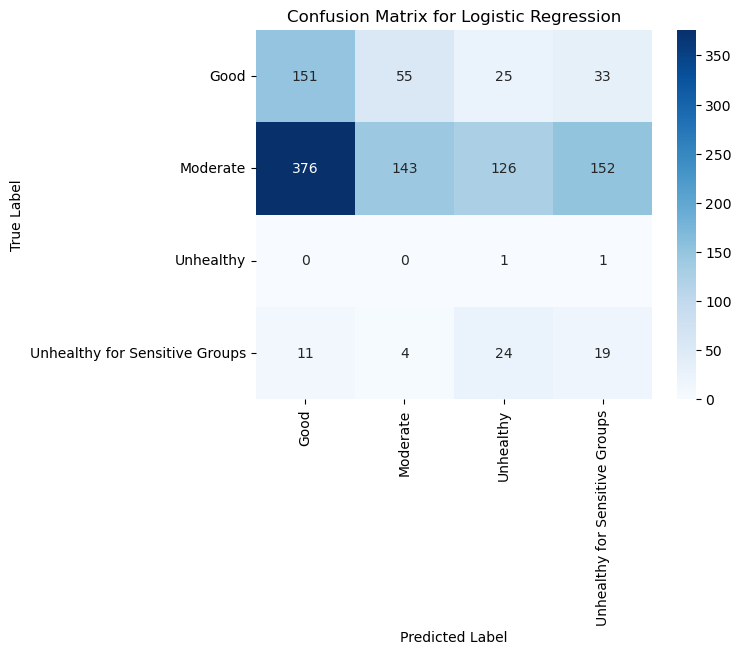

Gradient Boosting Validation Score: 0.44107142857142856
Gradient Boosting Cross-Validation Scores: [0.65478842 0.66993318 0.66904232 0.65567929 0.68003565]
Gradient Boosting Mean Cross-Validation Score: 0.665895771550167
Gradient Boosting Training Score: 0.7007305773342837
Gradient Boosting Test Accuracy: 0.43978590544157004

Classification Report for Gradient Boosting:
                                 precision    recall  f1-score   support

                          Good       0.34      0.58      0.43       264
                      Moderate       0.78      0.40      0.53       797
                     Unhealthy       0.01      0.50      0.03         2
Unhealthy for Sensitive Groups       0.12      0.40      0.18        58

                      accuracy                           0.44      1121
                     macro avg       0.31      0.47      0.29      1121
                  weighted avg       0.64      0.44      0.49      1121


Confusion Matrix for Gradient Boosting:


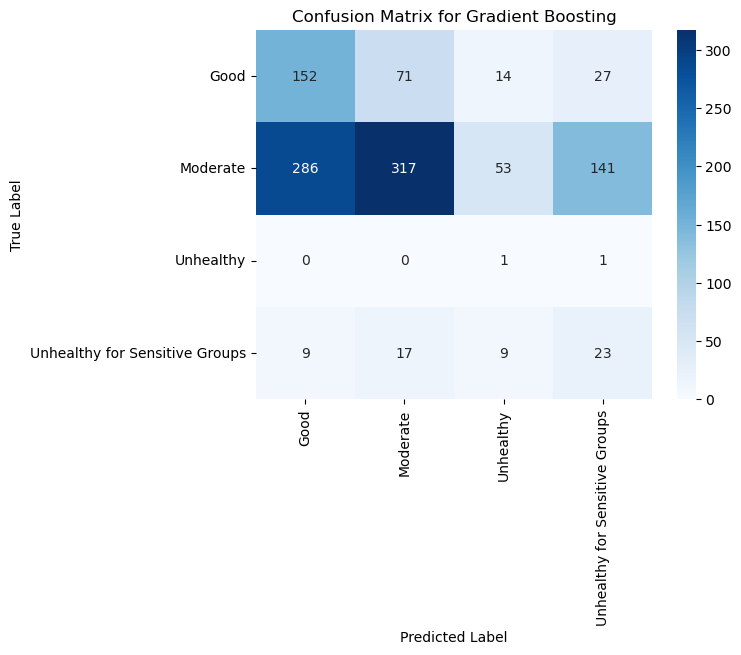

Random Forest Validation Score: 0.6803571428571429
Random Forest Cross-Validation Scores: [0.88463252 0.88240535 0.89443207 0.89710468 0.90062389]
Random Forest Mean Cross-Validation Score: 0.8918396992325984
Random Forest Training Score: 1.0
Random Forest Test Accuracy: 0.6645851917930419

Classification Report for Random Forest:
                                 precision    recall  f1-score   support

                          Good       0.42      0.41      0.42       264
                      Moderate       0.77      0.78      0.77       797
                     Unhealthy       0.00      0.00      0.00         2
Unhealthy for Sensitive Groups       0.35      0.33      0.34        58

                      accuracy                           0.66      1121
                     macro avg       0.38      0.38      0.38      1121
                  weighted avg       0.67      0.66      0.67      1121


Confusion Matrix for Random Forest:


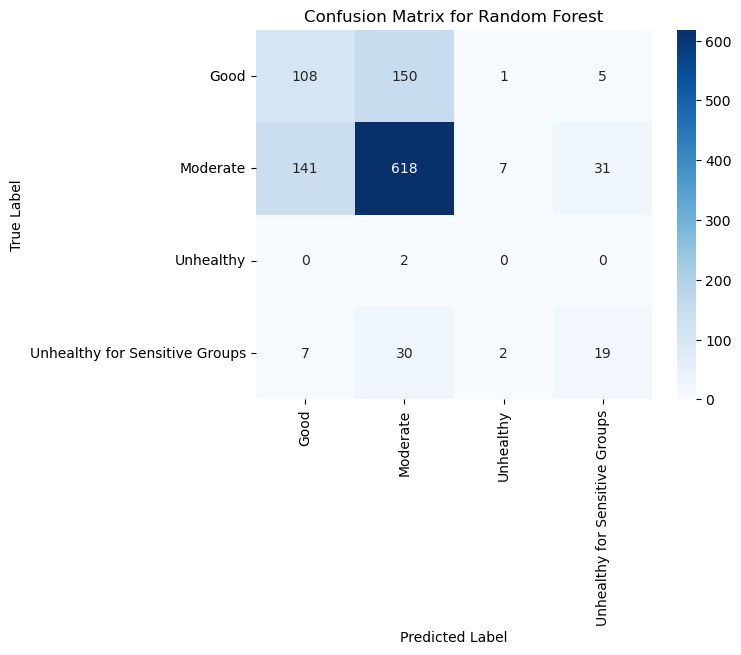


Feature Importances for Random Forest:
PEOPCOLORPCT: 0.2359
UNEMPPCT: 0.1674
OVER64PCT: 0.1642
LOWINCPCT: 0.1560
LIFEEXPPCT: 0.1517
UNDER5PCT: 0.1247
Extra Trees Validation Score: 0.6946428571428571
Extra Trees Cross-Validation Scores: [0.91002227 0.90022272 0.91314031 0.91982183 0.91889483]
Extra Trees Mean Cross-Validation Score: 0.9124203915216622
Extra Trees Training Score: 1.0
Extra Trees Test Accuracy: 0.6797502230151651

Classification Report for Extra Trees:
                                 precision    recall  f1-score   support

                          Good       0.44      0.38      0.41       264
                      Moderate       0.77      0.81      0.79       797
                     Unhealthy       0.00      0.00      0.00         2
Unhealthy for Sensitive Groups       0.39      0.31      0.35        58

                      accuracy                           0.68      1121
                     macro avg       0.40      0.37      0.39      1121
                  wei

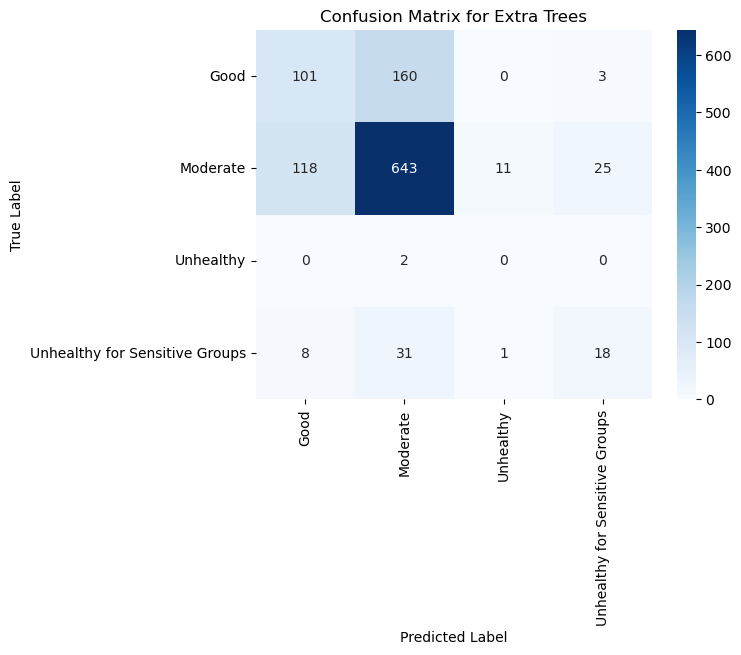


Feature Importances for Extra Trees:
PEOPCOLORPCT: 0.2458
LOWINCPCT: 0.1612
OVER64PCT: 0.1610
UNEMPPCT: 0.1571
LIFEEXPPCT: 0.1473
UNDER5PCT: 0.1275

Stacking Classifier Validation Score: 0.7160714285714286
Stacking Classifier Cross-Validation Scores: [0.91536748 0.90512249 0.92160356 0.92561247 0.92156863]
Stacking Classifier Mean Cross-Validation Score: 0.9178549281628019
Stacking Classifier Test Accuracy: 0.7074041034790366

Classification Report for Stacking Classifier:
                                 precision    recall  f1-score   support

                          Good       0.48      0.25      0.33       264
                      Moderate       0.75      0.89      0.81       797
                     Unhealthy       0.00      0.00      0.00         2
Unhealthy for Sensitive Groups       0.47      0.29      0.36        58

                      accuracy                           0.71      1121
                     macro avg       0.42      0.36      0.38      1121
              

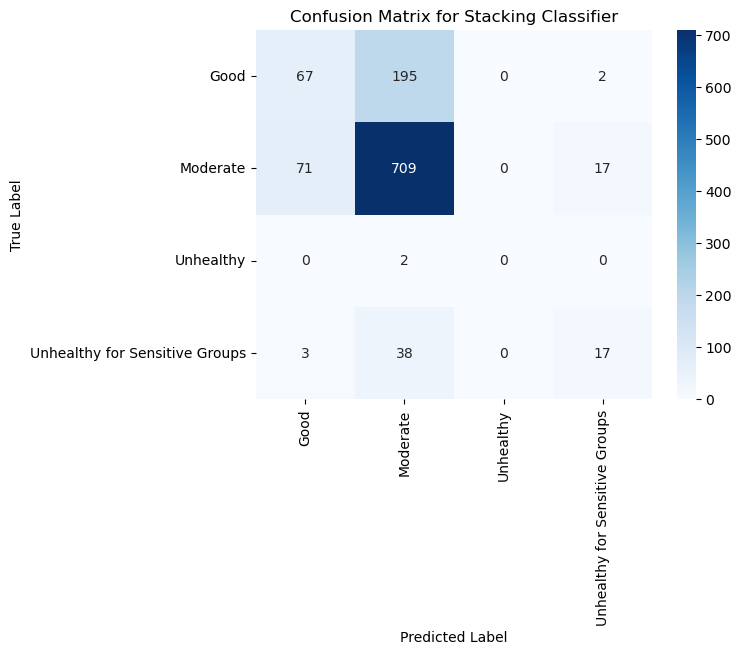

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from imblearn.combine import SMOTETomek
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


def print_confusion_matrix(model, X_test, y_test, label_encoder, model_name):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print(f"\nConfusion Matrix for {model_name}:")
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", 
                xticklabels=label_encoder.inverse_transform(np.unique(y_test)), 
                yticklabels=label_encoder.inverse_transform(np.unique(y_test)))
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.show()

def print_feature_importances(model, model_name, feature_names):
    if hasattr(model, 'feature_importances_'):
        importances = model.feature_importances_
        indices = np.argsort(importances)[::-1]
        print(f"\nFeature Importances for {model_name}:")
        for idx in indices:
            print(f"{feature_names[idx]}: {importances[idx]:.4f}")
    else:
        print(f"{model_name} does not provide feature importances.")

# Main function to apply models with validation, testing, and feature importances
def apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, target_name, label_encoder):
    print(f"\nResults for {target_name} Category Classification:\n")

    # Apply SMOTETomek to balance the training data
    smotetomek = SMOTETomek(random_state=42)
    X_train, y_train = smotetomek.fit_resample(X_train, y_train)
    
    models = {
        "Logistic Regression": Pipeline([
            ('scaler', StandardScaler()),           
            ('classifier', LogisticRegression(max_iter=500, C=1))
        ]),
        "Gradient Boosting": Pipeline([
            ('scaler', StandardScaler()),           
            ('classifier', GradientBoostingClassifier(n_estimators=50, learning_rate=0.1, random_state=42))
        ]),
        "Random Forest": Pipeline([
            ('scaler', StandardScaler()),          
            ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
        ]),
        "Extra Trees": Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', ExtraTreesClassifier(n_estimators=100, random_state=42))
        ])
    }

    # Apply each model and print validation, test scores, and confusion matrix
    for model_name, pipeline in models.items():
        pipeline.fit(X_train, y_train)
        
        # Validation score
        val_score = pipeline.score(X_val, y_val)
        print(f"{model_name} Validation Score: {val_score}")
        
        # Cross-validation
        cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5)
        print(f"{model_name} Cross-Validation Scores: {cv_scores}")
        print(f"{model_name} Mean Cross-Validation Score: {np.mean(cv_scores)}")
        
        # Test accuracy, classification report, and confusion matrix
        y_pred_test = pipeline.predict(X_test)
        test_score = accuracy_score(y_test, y_pred_test)
        train_score = pipeline.score(X_train, y_train)
        print(f"{model_name} Training Score: {train_score}")
        print(f"{model_name} Test Accuracy: {test_score}")
        print(f"\nClassification Report for {model_name}:\n", classification_report(y_test, y_pred_test, labels=np.unique(y_test), target_names=label_encoder.inverse_transform(np.unique(y_test))))
        print_confusion_matrix(pipeline, X_test, y_test, label_encoder, model_name)

        # Feature importances for models that support it
        if model_name in ["Random Forest", "Extra Trees"]:
            print_feature_importances(pipeline.named_steps['classifier'], model_name, X_train.columns)

    # Stacking Classifier with Gradient Boosting, Random Forest, and Extra Trees as base models and Random Forest as the meta-learner
    stacking_clf = StackingClassifier(
        estimators=[
            ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
            ('et', ExtraTreesClassifier(n_estimators=100, random_state=42))
        ],
        final_estimator=RandomForestClassifier(n_estimators=100, random_state=42),
    cv=5
    )
    
    stacking_clf.fit(X_train, y_train)
    
    # Stacking classifier validation and cross-validation
    stacking_val_score = stacking_clf.score(X_val, y_val)
    print("\nStacking Classifier Validation Score:", stacking_val_score)
    
    stacking_cv_scores = cross_val_score(stacking_clf, X_train, y_train, cv=5)
    print("Stacking Classifier Cross-Validation Scores:", stacking_cv_scores)
    print("Stacking Classifier Mean Cross-Validation Score:", np.mean(stacking_cv_scores))
    
    # Test accuracy, classification report, and confusion matrix for Stacking Classifier
    y_pred_stacking = stacking_clf.predict(X_test)
    stacking_test_score = accuracy_score(y_test, y_pred_stacking)
    print("Stacking Classifier Test Accuracy:", stacking_test_score)
    print(f"\nClassification Report for Stacking Classifier:\n", classification_report(y_test, y_pred_stacking, labels=np.unique(y_test), target_names=label_encoder.inverse_transform(np.unique(y_test))))
    print_confusion_matrix(stacking_clf, X_test, y_test, label_encoder, "Stacking Classifier")

# Run the function on each pollutant category and property type separately
for property_type in ['LIHTC', 'Public Housing']:
    for target, label_column in [('PM2.5', 'PM25_Category'), ('Ozone', 'OZONE_Category')]:
        print(f"\nAnalyzing {target} Category for {property_type}...\n")

        # Filter data by property type
        property_df = Spatial_df[Spatial_df['PropertyType'] == property_type]

        # Encode target labels for each subset
        le = LabelEncoder()
        property_df[f"{label_column}_Encoded"] = le.fit_transform(property_df[label_column])

        X = property_df[['PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
        y = property_df[f"{label_column}_Encoded"]

        # Split data into train, validation, and test sets (70% train, 10% val, 20% test)
        X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=42)
        
        # Apply models for the current category and property type
        apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, f"{target} for {property_type}", le)


In [25]:
import pandas as pd
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score

# Load dataset
Spatial_df = pd.read_csv("C:/Users/19147/Downloads/spatial_analysis_with_categories_and_hotspots.csv")

# Define function for applying models
def apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, target_name):
    print(f"\nResults for {target_name} Classification:\n")

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)
    X_test = scaler.transform(X_test)

    # Define base models
    base_estimators = [
        ('rf', RandomForestClassifier(random_state=42)),
        ('et', ExtraTreesClassifier(random_state=42))
    ]

    # Define the meta-learner
    meta_learner = RandomForestClassifier(random_state=42)

    # Define the stacking classifier
    stacking_clf = StackingClassifier(
        estimators=base_estimators,
        final_estimator=meta_learner,
        cv=2  # Reduced cross-validation folds
    )

    # Define hyperparameter grid for randomized search
    param_distributions = {
        'final_estimator__n_estimators': [50, 100, 150],  # Meta-learner trees
        'final_estimator__max_depth': [10, 20, None],     # Meta-learner depth
        'rf__n_estimators': [50, 100],                    # Base RF trees
        'rf__max_depth': [10, 20, None],                  # Base RF depth
        'et__n_estimators': [50, 100],                    # Base ET trees
        'et__max_depth': [10, 20, None]                   # Base ET depth
    }

    # Perform Randomized Search with Cross-Validation
    random_search = RandomizedSearchCV(estimator=stacking_clf, param_distributions=param_distributions,
                                       n_iter=10, cv=2, n_jobs=-1, random_state=42, scoring='accuracy', verbose=1)
    random_search.fit(X_train, y_train)

    # Print best parameters and best score
    print("Best Parameters:", random_search.best_params_)
    print("Best Validation Accuracy:", random_search.best_score_)

    # Evaluate on the validation and test set
    best_model = random_search.best_estimator_

    # Validation Accuracy
    val_accuracy = best_model.score(X_val, y_val)
    print("\nValidation Accuracy:", val_accuracy)

    # Test Accuracy and Classification Report
    y_pred_test = best_model.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_pred_test)
    print("\nTest Accuracy:", test_accuracy)
    print("\nClassification Report:\n", classification_report(y_test, y_pred_test))

# Run the function for each pollutant category and property type separately
for property_type in ['LIHTC', 'Public Housing']:
    for target, label_column in [('PM2.5', 'PM25_Category'), ('Ozone', 'OZONE_Category')]:
        print(f"\nAnalyzing {target} Category for {property_type}...\n")

        # Filter data by property type
        property_df = Spatial_df[Spatial_df['PropertyType'] == property_type]

        # Encode target labels for each subset
        le = LabelEncoder()
        property_df[f"{label_column}_Encoded"] = le.fit_transform(property_df[label_column])

        X = property_df[['PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
        y = property_df[f"{label_column}_Encoded"]

        # Split data into train, validation, and test sets (70% train, 10% val, 20% test)
        X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=42)
        
        # Apply models for the current category and property type
        apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, f"{target} for {property_type}")



Analyzing PM2.5 Category for LIHTC...


Results for PM2.5 for LIHTC Classification:

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'rf__n_estimators': 100, 'rf__max_depth': 20, 'final_estimator__n_estimators': 50, 'final_estimator__max_depth': 10, 'et__n_estimators': 50, 'et__max_depth': None}
Best Validation Accuracy: 0.8378251036562383

Validation Accuracy: 0.8898416886543535

Test Accuracy: 0.8735366859027205

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.97      0.92      4532
           1       0.87      0.58      0.70      1533

    accuracy                           0.87      6065
   macro avg       0.87      0.78      0.81      6065
weighted avg       0.87      0.87      0.86      6065


Analyzing Ozone Category for LIHTC...


Results for Ozone for LIHTC Classification:

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'rf__n_estimators': 100, 'rf__max


Analyzing PM2.5 Category for LIHTC...


Results for PM2.5 for LIHTC Classification:

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'rf__n_estimators': 100, 'rf__max_depth': 20, 'final_estimator__n_estimators': 50, 'final_estimator__max_depth': 10, 'et__n_estimators': 50, 'et__max_depth': None}
Best Validation Accuracy: 0.8734924543789859

Training Accuracy: 1.0

Validation Accuracy: 0.8776385224274407

Test Accuracy: 0.8644682605111295

Classification Report:
               precision    recall  f1-score   support

           0       0.89      0.93      0.91      4532
           1       0.76      0.67      0.71      1533

    accuracy                           0.86      6065
   macro avg       0.83      0.80      0.81      6065
weighted avg       0.86      0.86      0.86      6065



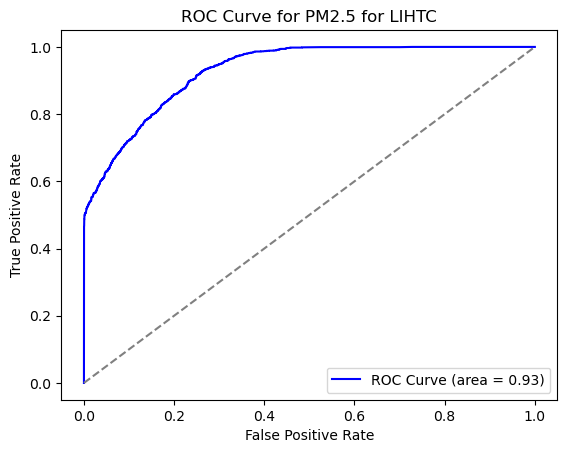


Analyzing Ozone Category for LIHTC...


Results for Ozone for LIHTC Classification:

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'rf__n_estimators': 100, 'rf__max_depth': 20, 'final_estimator__n_estimators': 50, 'final_estimator__max_depth': 10, 'et__n_estimators': 50, 'et__max_depth': None}
Best Validation Accuracy: 0.9264166707938414

Training Accuracy: 1.0

Validation Accuracy: 0.8324538258575198

Test Accuracy: 0.8207749381698268

Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.63      0.72      1353
           1       0.83      0.93      0.88      4025
           2       0.63      0.54      0.58       106
           3       0.70      0.56      0.62       565
           4       0.86      0.38      0.52        16

    accuracy                           0.82      6065
   macro avg       0.77      0.61      0.67      6065
weighted avg       0.82      0.82      0.81      6065


Analyzing P

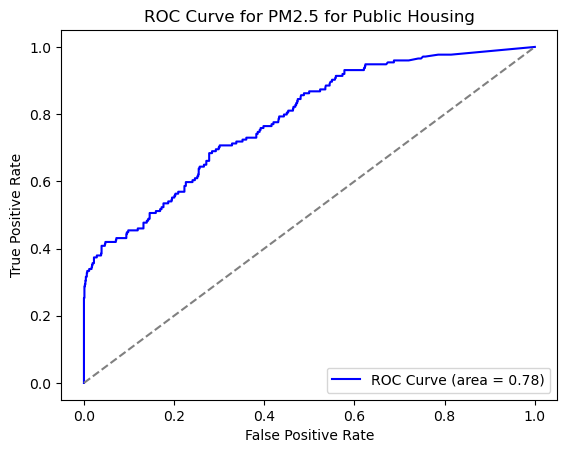


Analyzing Ozone Category for Public Housing...


Results for Ozone for Public Housing Classification:

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best Parameters: {'rf__n_estimators': 100, 'rf__max_depth': 20, 'final_estimator__n_estimators': 50, 'final_estimator__max_depth': 10, 'et__n_estimators': 50, 'et__max_depth': None}
Best Validation Accuracy: 0.8825971731448763

Training Accuracy: 1.0

Validation Accuracy: 0.7464285714285714

Test Accuracy: 0.7261373773416593

Classification Report:
               precision    recall  f1-score   support

           0       0.54      0.27      0.36       264
           1       0.76      0.91      0.83       797
           2       0.00      0.00      0.00         2
           3       0.56      0.34      0.43        58

    accuracy                           0.73      1121
   macro avg       0.46      0.38      0.40      1121
weighted avg       0.70      0.73      0.70      1121



In [27]:
import pandas as pd
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import classification_report, accuracy_score, roc_curve, auc
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt

# Load dataset
Spatial_df = pd.read_csv("C:/Users/19147/Downloads/spatial_analysis_with_categories_and_hotspots.csv")

# Define function for applying models
def apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, target_name):
    print(f"\nResults for {target_name} Classification:\n")

    # Scale the features
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)
    X_test = scaler.transform(X_test)

    # Apply SMOTE to handle class imbalance
    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train, y_train)

    # Define base models
    base_estimators = [
        ('rf', RandomForestClassifier(random_state=42)),
        ('et', ExtraTreesClassifier(random_state=42))
    ]

    # Define the meta-learner
    meta_learner = RandomForestClassifier(random_state=42)

    # Define the stacking classifier
    stacking_clf = StackingClassifier(
        estimators=base_estimators,
        final_estimator=meta_learner,
        cv=2  # Reduced cross-validation folds
    )

    # Define hyperparameter grid for randomized search
    param_distributions = {
        'final_estimator__n_estimators': [50, 100, 150],  # Meta-learner trees
        'final_estimator__max_depth': [10, 20, None],     # Meta-learner depth
        'rf__n_estimators': [50, 100],                    # Base RF trees
        'rf__max_depth': [10, 20, None],                  # Base RF depth
        'et__n_estimators': [50, 100],                    # Base ET trees
        'et__max_depth': [10, 20, None]                   # Base ET depth
    }

    # Perform Randomized Search with Cross-Validation
    random_search = RandomizedSearchCV(estimator=stacking_clf, param_distributions=param_distributions,
                                       n_iter=10, cv=2, n_jobs=-1, random_state=42, scoring='accuracy', verbose=1)
    random_search.fit(X_train, y_train)

    # Print best parameters and best score
    print("Best Parameters:", random_search.best_params_)
    print("Best Validation Accuracy:", random_search.best_score_)

    # Evaluate on the training set
    train_accuracy = random_search.best_estimator_.score(X_train, y_train)
    print("\nTraining Accuracy:", train_accuracy)

    # Evaluate on the validation set
    val_accuracy = random_search.best_estimator_.score(X_val, y_val)
    print("\nValidation Accuracy:", val_accuracy)

    # Evaluate on the test set
    y_pred_test = random_search.best_estimator_.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_pred_test)
    print("\nTest Accuracy:", test_accuracy)
    print("\nClassification Report:\n", classification_report(y_test, y_pred_test))

    # Plot ROC curve for test set
    if len(set(y_test)) == 2:  # ROC curve requires binary classification
        y_prob = random_search.best_estimator_.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_prob)
        roc_auc = auc(fpr, tpr)

        plt.figure()
        plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f'ROC Curve for {target_name}')
        plt.legend(loc="lower right")
        plt.show()

# Run the function for each pollutant category and property type separately
for property_type in ['LIHTC', 'Public Housing']:
    for target, label_column in [('PM2.5', 'PM25_Category'), ('Ozone', 'OZONE_Category')]:
        print(f"\nAnalyzing {target} Category for {property_type}...\n")

        # Filter data by property type
        property_df = Spatial_df[Spatial_df['PropertyType'] == property_type]

        # Encode target labels for each subset
        le = LabelEncoder()
        property_df[f"{label_column}_Encoded"] = le.fit_transform(property_df[label_column])

        X = property_df[['PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
        y = property_df[f"{label_column}_Encoded"]

        # Split data into train, validation, and test sets (70% train, 10% val, 20% test)
        X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=42)
        
        # Apply models for the current category and property type
        apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, f"{target} for {property_type}")


**ROC Curve**


Analyzing PM2.5 Category for LIHTC...


Results for PM2.5 for LIHTC Category Classification:

Logistic Regression Validation Score: 0.6470976253298153
Logistic Regression Cross-Validation Scores: [0.65505725 0.65786544 0.64991252 0.66120566 0.65293463]
Logistic Regression Mean Cross-Validation Score: 0.6553950991807886
Logistic Regression Test Accuracy: 0.638911788953009

Classification Report for Logistic Regression:
               precision    recall  f1-score   support

        Good       0.85      0.63      0.72      4532
    Moderate       0.38      0.66      0.48      1533

    accuracy                           0.64      6065
   macro avg       0.61      0.65      0.60      6065
weighted avg       0.73      0.64      0.66      6065



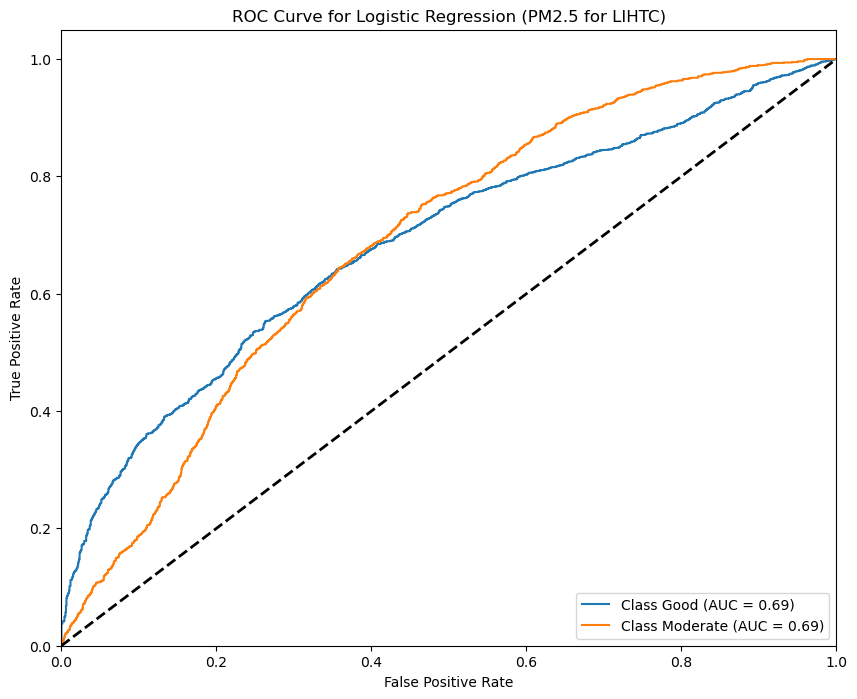

Gradient Boosting Validation Score: 0.6398416886543535
Gradient Boosting Cross-Validation Scores: [0.67954835 0.68347383 0.66868141 0.68506442 0.6828376 ]
Gradient Boosting Mean Cross-Validation Score: 0.6799211214141544
Gradient Boosting Test Accuracy: 0.6280296784830998

Classification Report for Gradient Boosting:
               precision    recall  f1-score   support

        Good       0.87      0.59      0.70      4532
    Moderate       0.38      0.73      0.50      1533

    accuracy                           0.63      6065
   macro avg       0.62      0.66      0.60      6065
weighted avg       0.74      0.63      0.65      6065



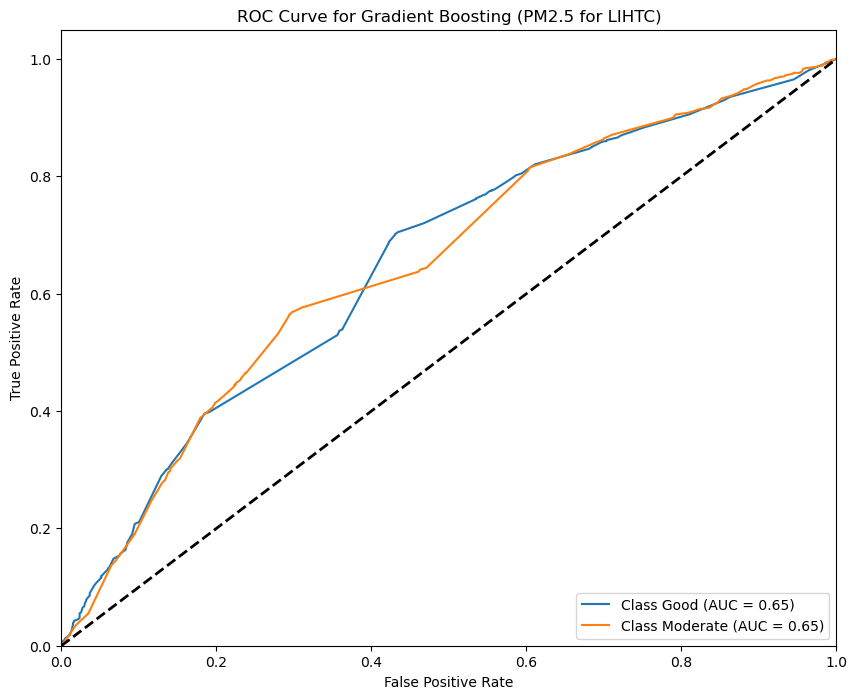

Random Forest Validation Score: 0.8733509234828496
Random Forest Cross-Validation Scores: [0.89233461 0.88961349 0.90901861 0.90710991 0.89995228]
Random Forest Mean Cross-Validation Score: 0.8996057790804646
Random Forest Test Accuracy: 0.854080791426216

Classification Report for Random Forest:
               precision    recall  f1-score   support

        Good       0.91      0.90      0.90      4532
    Moderate       0.71      0.72      0.71      1533

    accuracy                           0.85      6065
   macro avg       0.81      0.81      0.81      6065
weighted avg       0.86      0.85      0.85      6065



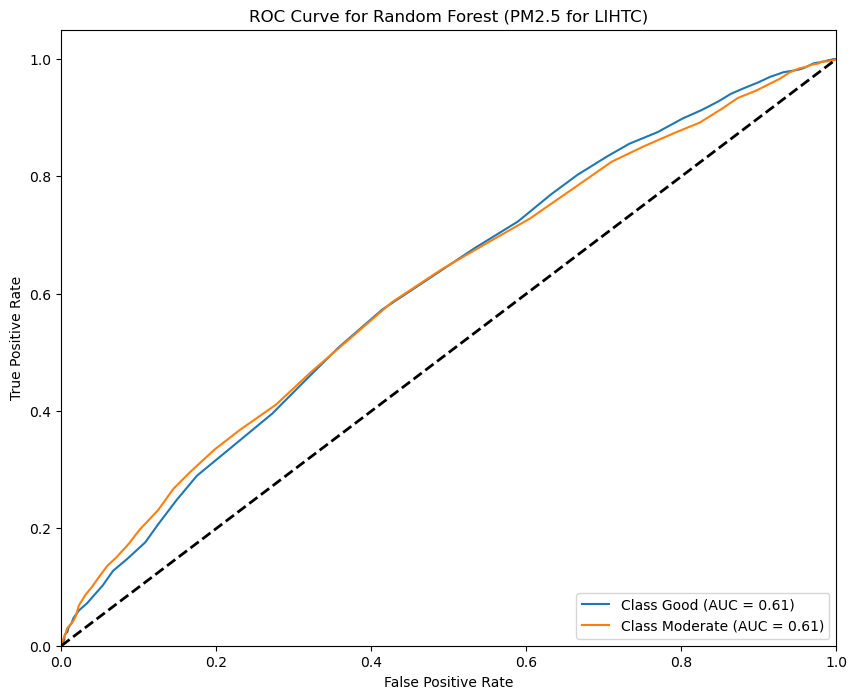

Extra Trees Validation Score: 0.8651055408970977
Extra Trees Cross-Validation Scores: [0.90744275 0.90679179 0.92301575 0.9212661  0.92047081]
Extra Trees Mean Cross-Validation Score: 0.9157974409814509
Extra Trees Test Accuracy: 0.855234954657873

Classification Report for Extra Trees:
               precision    recall  f1-score   support

        Good       0.90      0.90      0.90      4532
    Moderate       0.71      0.71      0.71      1533

    accuracy                           0.86      6065
   macro avg       0.81      0.81      0.81      6065
weighted avg       0.86      0.86      0.86      6065



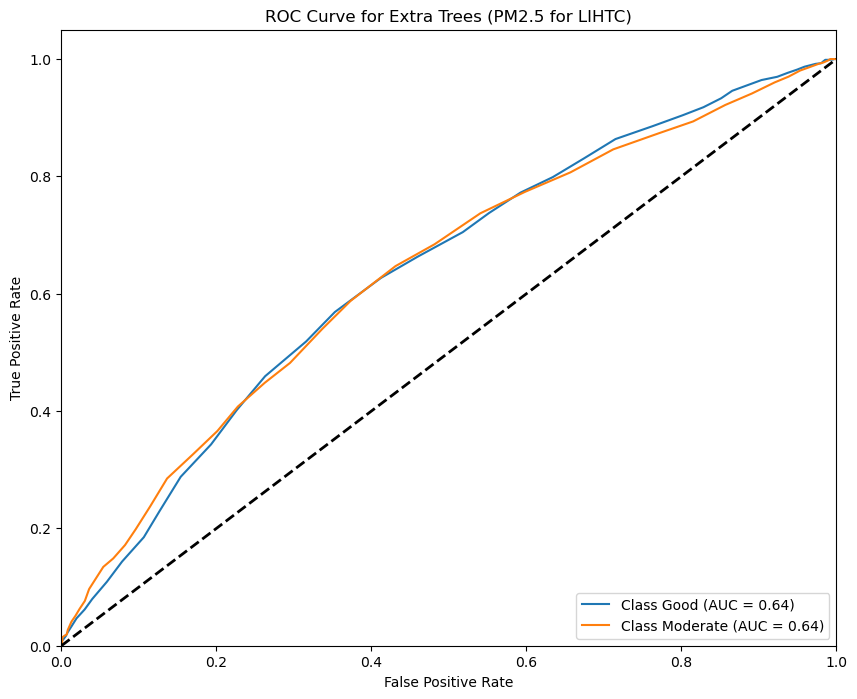


Stacking Classifier Validation Score: 0.8660949868073878
Stacking Classifier Cross-Validation Scores: [0.89885496 0.89168125 0.90949578 0.90901861 0.90488309]
Stacking Classifier Mean Cross-Validation Score: 0.9027867391454801
Stacking Classifier Test Accuracy: 0.8586974443528442

Classification Report for Stacking Classifier:
               precision    recall  f1-score   support

        Good       0.89      0.92      0.91      4532
    Moderate       0.74      0.68      0.71      1533

    accuracy                           0.86      6065
   macro avg       0.82      0.80      0.81      6065
weighted avg       0.86      0.86      0.86      6065



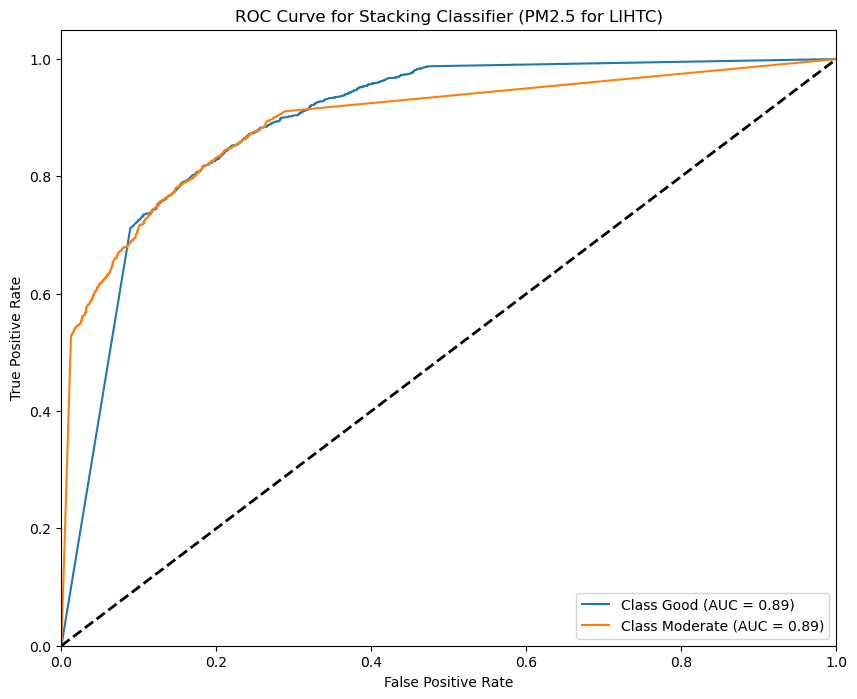


Analyzing Ozone Category for LIHTC...


Results for Ozone for LIHTC Category Classification:

Logistic Regression Validation Score: 0.2519788918205805
Logistic Regression Cross-Validation Scores: [0.42568193 0.42119507 0.43280393 0.43216295 0.43266149]
Logistic Regression Mean Cross-Validation Score: 0.42890107542197853
Logistic Regression Test Accuracy: 0.26957955482275353

Classification Report for Logistic Regression:
                                 precision    recall  f1-score   support

                          Good       0.30      0.57      0.40      1353
                      Moderate       0.70      0.17      0.27      4025
                     Unhealthy       0.07      0.54      0.13       106
Unhealthy for Sensitive Groups       0.15      0.20      0.17       565
                Very Unhealthy       0.01      0.75      0.02        16

                      accuracy                           0.27      6065
                     macro avg       0.25      0.45      0.20      

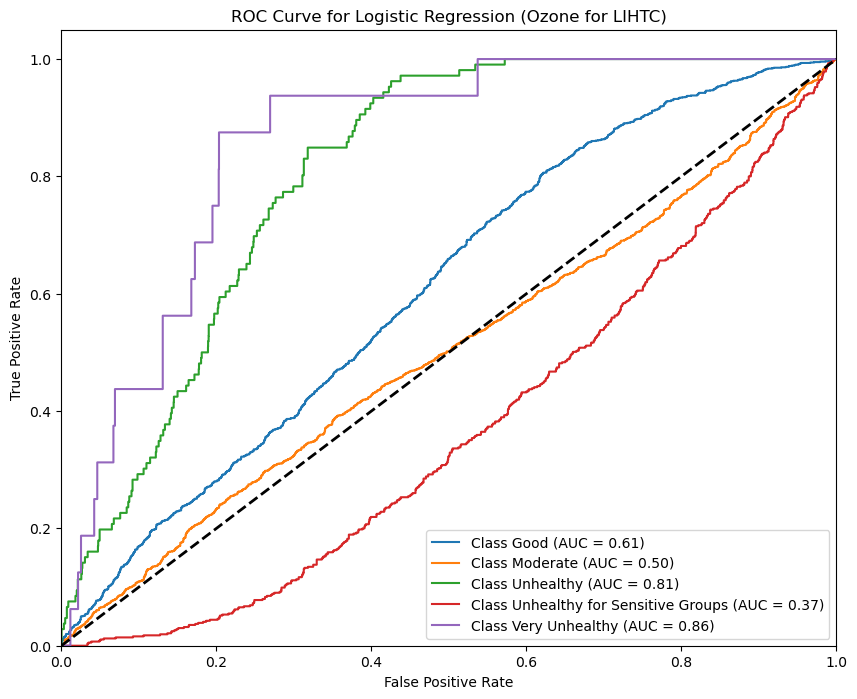

Gradient Boosting Validation Score: 0.3740105540897098
Gradient Boosting Cross-Validation Scores: [0.60366071 0.60729293 0.60722171 0.61249199 0.60914465]
Gradient Boosting Mean Cross-Validation Score: 0.6079623958407521
Gradient Boosting Test Accuracy: 0.39686727122835946

Classification Report for Gradient Boosting:
                                 precision    recall  f1-score   support

                          Good       0.35      0.55      0.43      1353
                      Moderate       0.79      0.34      0.47      4025
                     Unhealthy       0.10      0.72      0.17       106
Unhealthy for Sensitive Groups       0.19      0.37      0.25       565
                Very Unhealthy       0.02      0.50      0.05        16

                      accuracy                           0.40      6065
                     macro avg       0.29      0.50      0.27      6065
                  weighted avg       0.62      0.40      0.44      6065



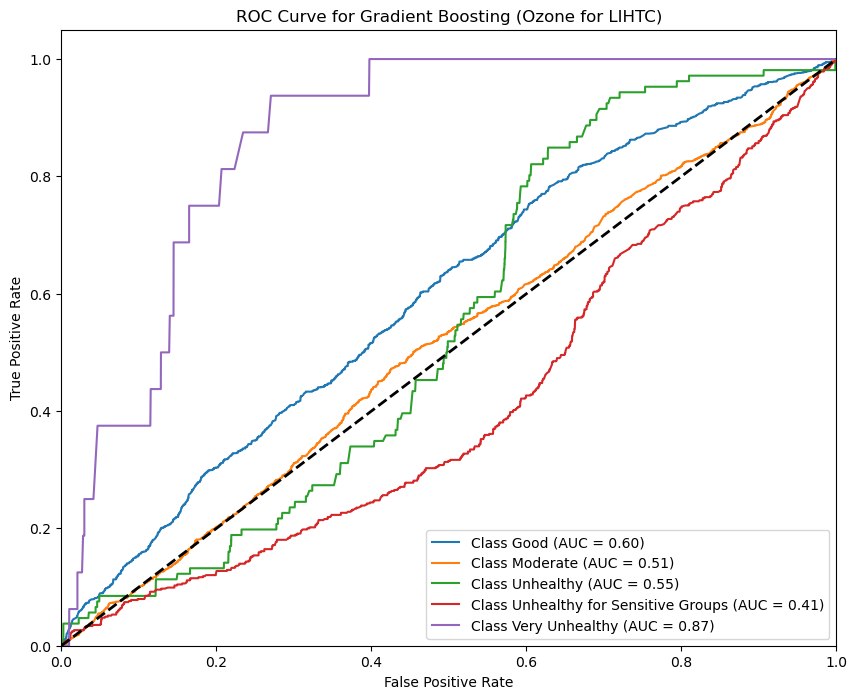

Random Forest Validation Score: 0.783311345646438
Random Forest Cross-Validation Scores: [0.92707072 0.92934976 0.93989032 0.93832348 0.9376825 ]
Random Forest Mean Cross-Validation Score: 0.9344633573107328
Random Forest Test Accuracy: 0.7780708985985161

Classification Report for Random Forest:
                                 precision    recall  f1-score   support

                          Good       0.71      0.69      0.70      1353
                      Moderate       0.86      0.84      0.85      4025
                     Unhealthy       0.34      0.64      0.45       106
Unhealthy for Sensitive Groups       0.56      0.61      0.59       565
                Very Unhealthy       0.32      0.38      0.34        16

                      accuracy                           0.78      6065
                     macro avg       0.56      0.63      0.58      6065
                  weighted avg       0.79      0.78      0.78      6065



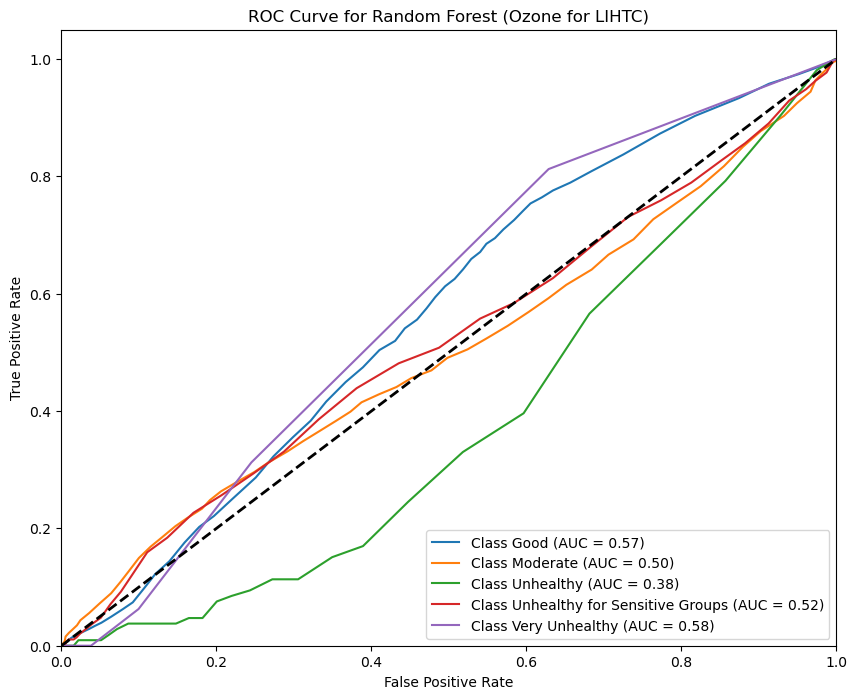

Extra Trees Validation Score: 0.7961741424802111
Extra Trees Cross-Validation Scores: [0.93967666 0.9412435  0.9480094  0.9480094  0.9515704 ]
Extra Trees Mean Cross-Validation Score: 0.9457018730859625
Extra Trees Test Accuracy: 0.7841714756801319

Classification Report for Extra Trees:
                                 precision    recall  f1-score   support

                          Good       0.71      0.67      0.69      1353
                      Moderate       0.86      0.85      0.85      4025
                     Unhealthy       0.36      0.64      0.46       106
Unhealthy for Sensitive Groups       0.59      0.60      0.59       565
                Very Unhealthy       0.47      0.44      0.45        16

                      accuracy                           0.78      6065
                     macro avg       0.60      0.64      0.61      6065
                  weighted avg       0.79      0.78      0.79      6065



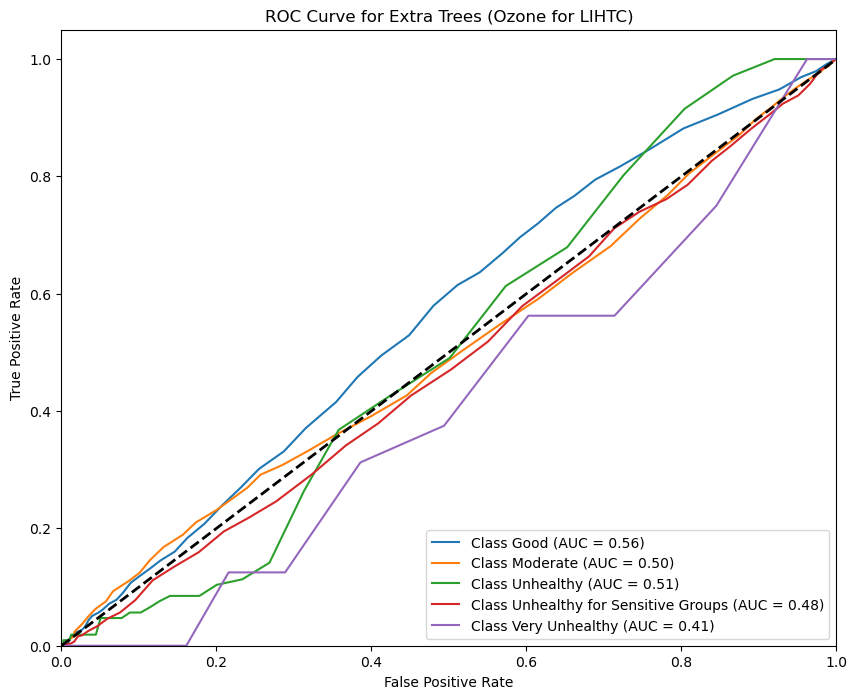


Stacking Classifier Validation Score: 0.8265171503957783
Stacking Classifier Cross-Validation Scores: [0.94508938 0.94601524 0.953707   0.95342212 0.95470408]
Stacking Classifier Mean Cross-Validation Score: 0.9505875649882487
Stacking Classifier Test Accuracy: 0.8077493816982687

Classification Report for Stacking Classifier:
                                 precision    recall  f1-score   support

                          Good       0.78      0.64      0.70      1353
                      Moderate       0.83      0.91      0.87      4025
                     Unhealthy       0.62      0.58      0.60       106
Unhealthy for Sensitive Groups       0.67      0.55      0.60       565
                Very Unhealthy       0.86      0.38      0.52        16

                      accuracy                           0.81      6065
                     macro avg       0.75      0.61      0.66      6065
                  weighted avg       0.80      0.81      0.80      6065



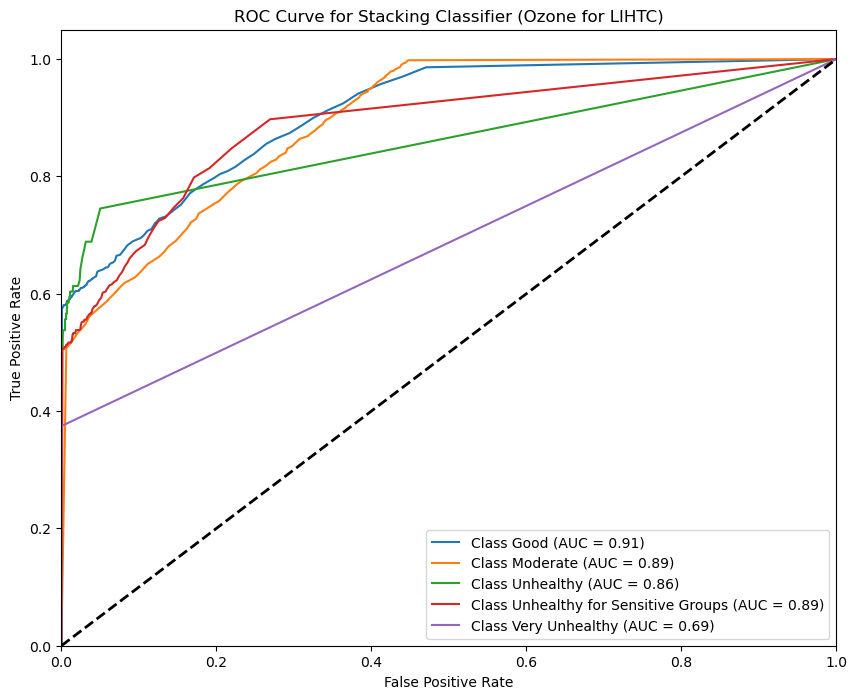


Analyzing PM2.5 Category for Public Housing...


Results for PM2.5 for Public Housing Category Classification:

Logistic Regression Validation Score: 0.6232142857142857
Logistic Regression Cross-Validation Scores: [0.64642583 0.66641045 0.67923077 0.66923077 0.67307692]
Logistic Regression Mean Cross-Validation Score: 0.6668749482646484
Logistic Regression Test Accuracy: 0.6574487065120428

Classification Report for Logistic Regression:
               precision    recall  f1-score   support

        Good       0.92      0.65      0.76       947
    Moderate       0.26      0.67      0.38       174

    accuracy                           0.66      1121
   macro avg       0.59      0.66      0.57      1121
weighted avg       0.81      0.66      0.70      1121



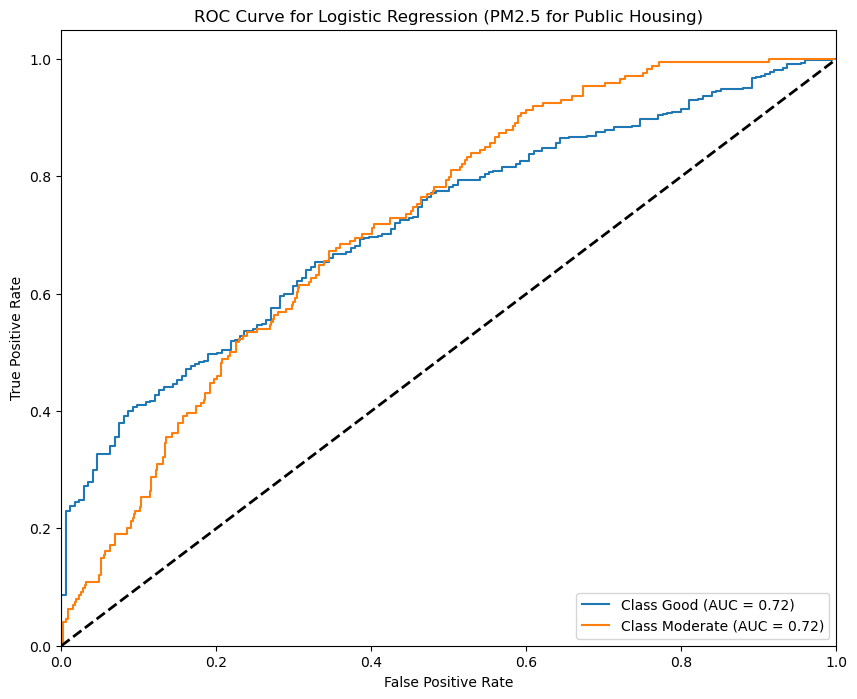

Gradient Boosting Validation Score: 0.625
Gradient Boosting Cross-Validation Scores: [0.67486549 0.72790161 0.71769231 0.70461538 0.72846154]
Gradient Boosting Mean Cross-Validation Score: 0.710707266599657
Gradient Boosting Test Accuracy: 0.6351471900089206

Classification Report for Gradient Boosting:
               precision    recall  f1-score   support

        Good       0.93      0.62      0.74       947
    Moderate       0.26      0.74      0.39       174

    accuracy                           0.64      1121
   macro avg       0.60      0.68      0.56      1121
weighted avg       0.82      0.64      0.69      1121



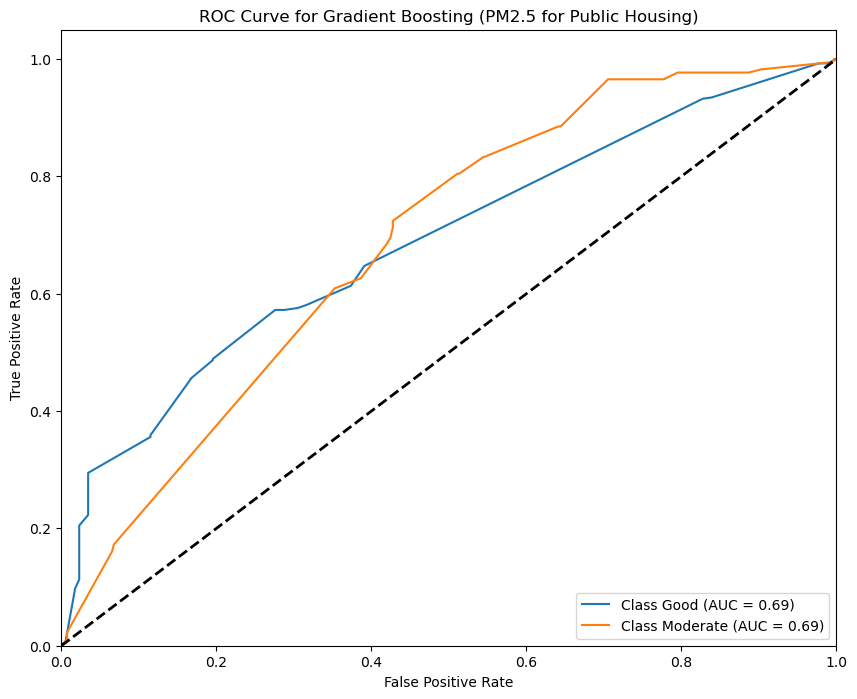

Random Forest Validation Score: 0.8339285714285715
Random Forest Cross-Validation Scores: [0.8754804  0.90930054 0.89692308 0.87846154 0.89461538]
Random Forest Mean Cross-Validation Score: 0.89095618754804
Random Forest Test Accuracy: 0.8322925958965209

Classification Report for Random Forest:
               precision    recall  f1-score   support

        Good       0.90      0.90      0.90       947
    Moderate       0.46      0.44      0.45       174

    accuracy                           0.83      1121
   macro avg       0.68      0.67      0.68      1121
weighted avg       0.83      0.83      0.83      1121



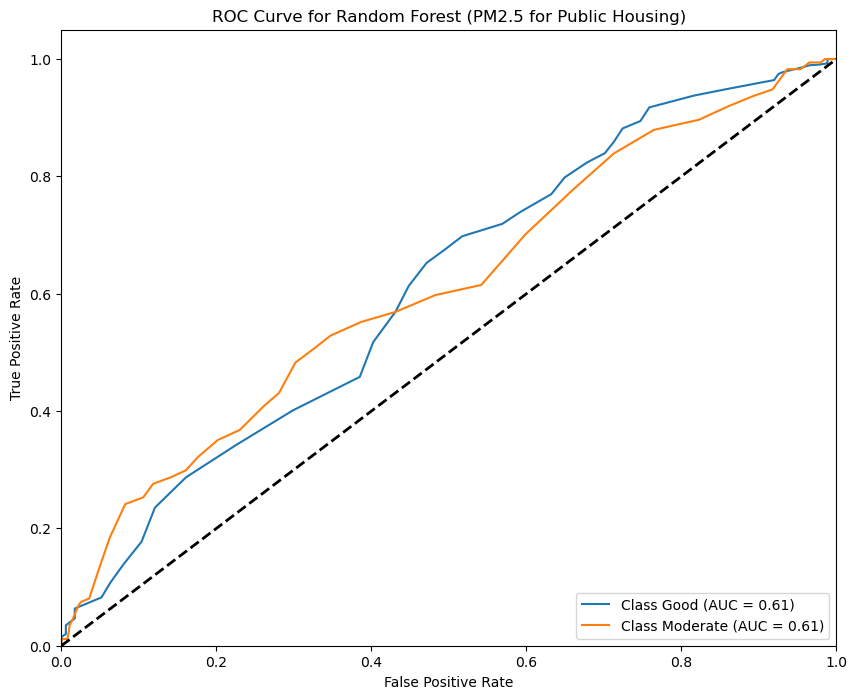

Extra Trees Validation Score: 0.8571428571428571
Extra Trees Cross-Validation Scores: [0.91544965 0.91929285 0.91846154 0.89846154 0.92615385]
Extra Trees Mean Cross-Validation Score: 0.9155638857683439
Extra Trees Test Accuracy: 0.8456735057983943

Classification Report for Extra Trees:
               precision    recall  f1-score   support

        Good       0.89      0.93      0.91       947
    Moderate       0.50      0.40      0.44       174

    accuracy                           0.85      1121
   macro avg       0.70      0.66      0.68      1121
weighted avg       0.83      0.85      0.84      1121



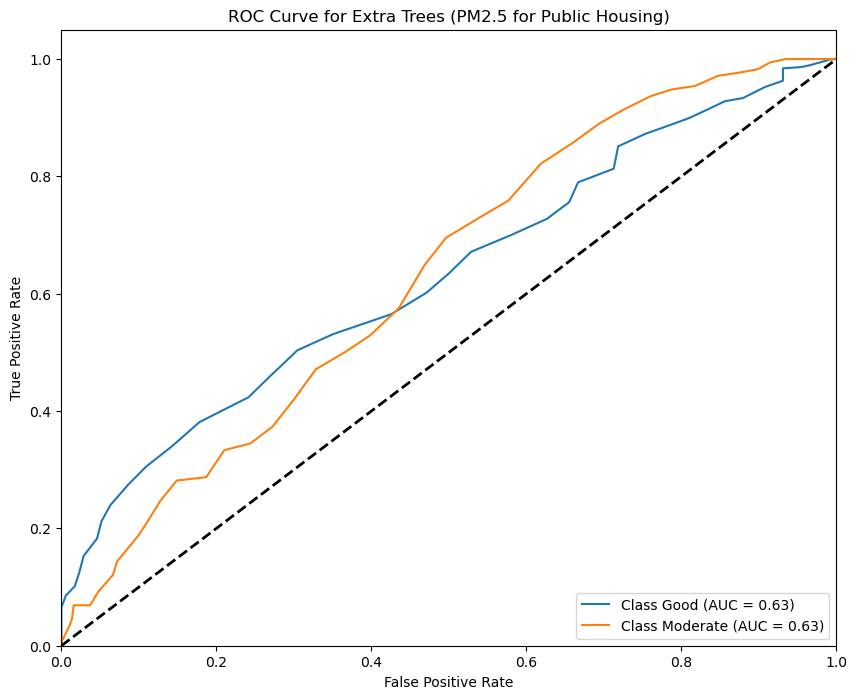


Stacking Classifier Validation Score: 0.8589285714285714
Stacking Classifier Cross-Validation Scores: [0.89623367 0.90622598 0.89384615 0.88923077 0.90307692]
Stacking Classifier Mean Cross-Validation Score: 0.8977226985159346
Stacking Classifier Test Accuracy: 0.8545941123996432

Classification Report for Stacking Classifier:
               precision    recall  f1-score   support

        Good       0.90      0.93      0.92       947
    Moderate       0.54      0.43      0.48       174

    accuracy                           0.85      1121
   macro avg       0.72      0.68      0.70      1121
weighted avg       0.84      0.85      0.85      1121



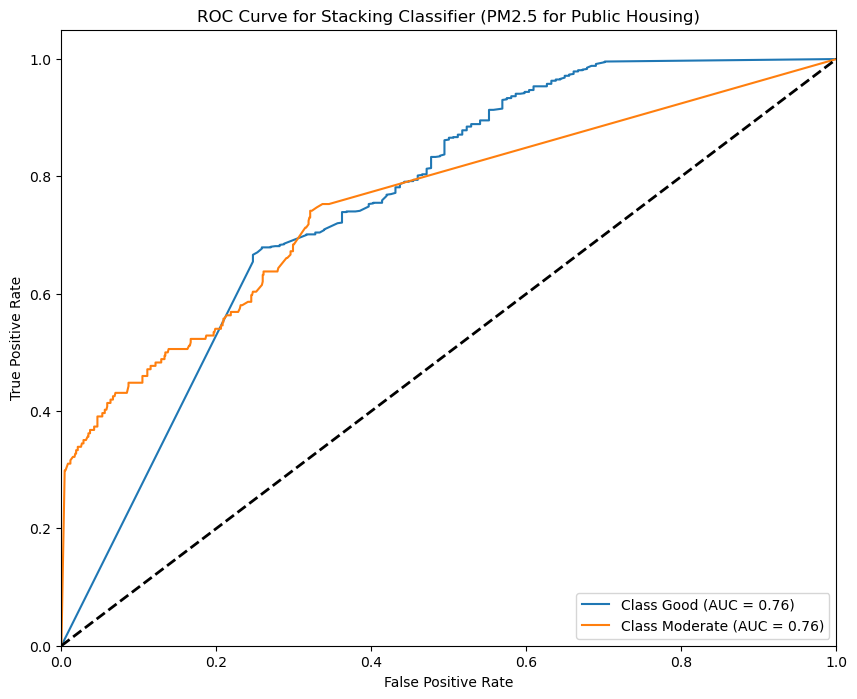


Analyzing Ozone Category for Public Housing...


Results for Ozone for Public Housing Category Classification:

Logistic Regression Validation Score: 0.32857142857142857
Logistic Regression Cross-Validation Scores: [0.47260579 0.4636971  0.47973274 0.47171492 0.48975045]
Logistic Regression Mean Cross-Validation Score: 0.47550020048513436
Logistic Regression Test Accuracy: 0.280107047279215

Classification Report for Logistic Regression:
                                 precision    recall  f1-score   support

                          Good       0.28      0.57      0.38       264
                      Moderate       0.71      0.18      0.29       797
                     Unhealthy       0.01      0.50      0.01         2
Unhealthy for Sensitive Groups       0.09      0.33      0.14        58

                      accuracy                           0.28      1121
                     macro avg       0.27      0.39      0.20      1121
                  weighted avg       0.57      0.2

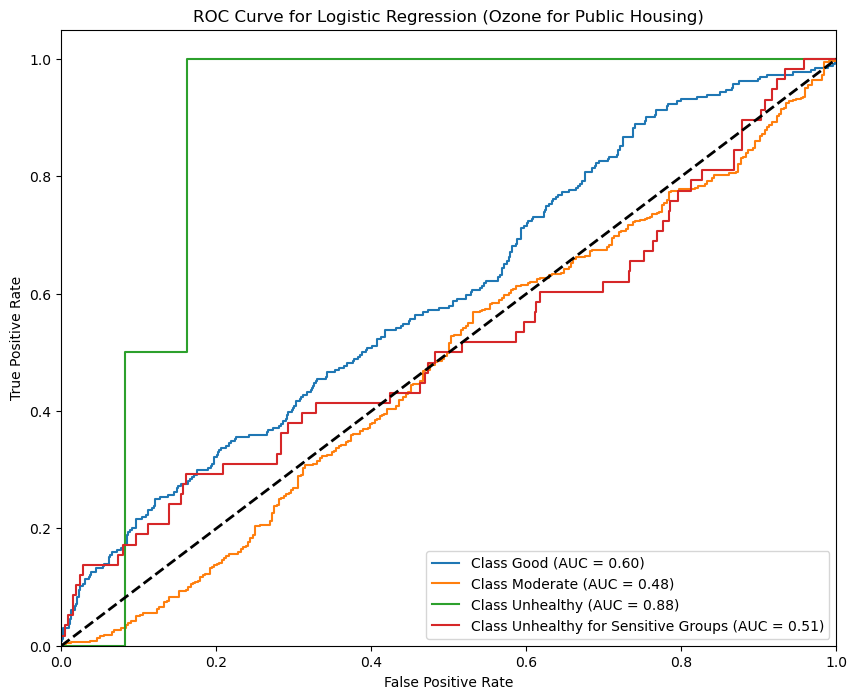

Gradient Boosting Validation Score: 0.44107142857142856
Gradient Boosting Cross-Validation Scores: [0.65478842 0.66993318 0.66904232 0.65567929 0.68003565]
Gradient Boosting Mean Cross-Validation Score: 0.665895771550167
Gradient Boosting Test Accuracy: 0.43978590544157004

Classification Report for Gradient Boosting:
                                 precision    recall  f1-score   support

                          Good       0.34      0.58      0.43       264
                      Moderate       0.78      0.40      0.53       797
                     Unhealthy       0.01      0.50      0.03         2
Unhealthy for Sensitive Groups       0.12      0.40      0.18        58

                      accuracy                           0.44      1121
                     macro avg       0.31      0.47      0.29      1121
                  weighted avg       0.64      0.44      0.49      1121



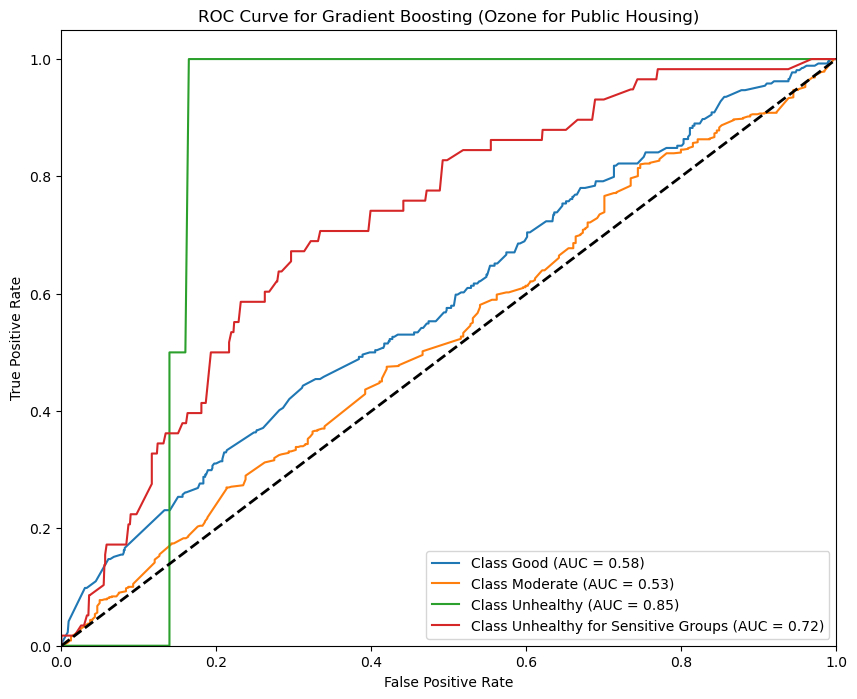

Random Forest Validation Score: 0.6803571428571429
Random Forest Cross-Validation Scores: [0.88463252 0.88240535 0.89443207 0.89710468 0.90062389]
Random Forest Mean Cross-Validation Score: 0.8918396992325984
Random Forest Test Accuracy: 0.6645851917930419

Classification Report for Random Forest:
                                 precision    recall  f1-score   support

                          Good       0.42      0.41      0.42       264
                      Moderate       0.77      0.78      0.77       797
                     Unhealthy       0.00      0.00      0.00         2
Unhealthy for Sensitive Groups       0.35      0.33      0.34        58

                      accuracy                           0.66      1121
                     macro avg       0.38      0.38      0.38      1121
                  weighted avg       0.67      0.66      0.67      1121



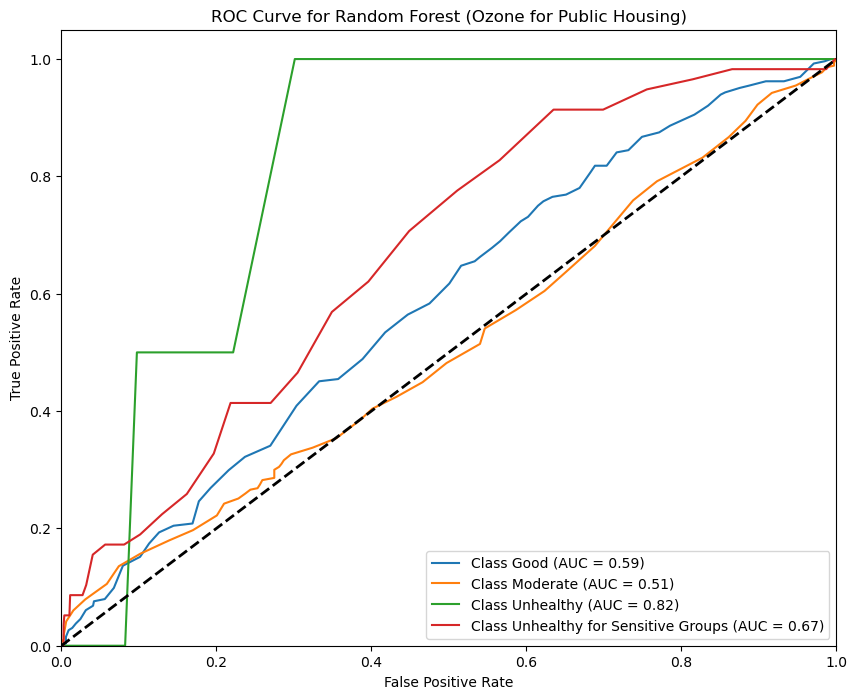

Extra Trees Validation Score: 0.6946428571428571
Extra Trees Cross-Validation Scores: [0.91002227 0.90022272 0.91314031 0.91982183 0.91889483]
Extra Trees Mean Cross-Validation Score: 0.9124203915216622
Extra Trees Test Accuracy: 0.6797502230151651

Classification Report for Extra Trees:
                                 precision    recall  f1-score   support

                          Good       0.44      0.38      0.41       264
                      Moderate       0.77      0.81      0.79       797
                     Unhealthy       0.00      0.00      0.00         2
Unhealthy for Sensitive Groups       0.39      0.31      0.35        58

                      accuracy                           0.68      1121
                     macro avg       0.40      0.37      0.39      1121
                  weighted avg       0.67      0.68      0.67      1121



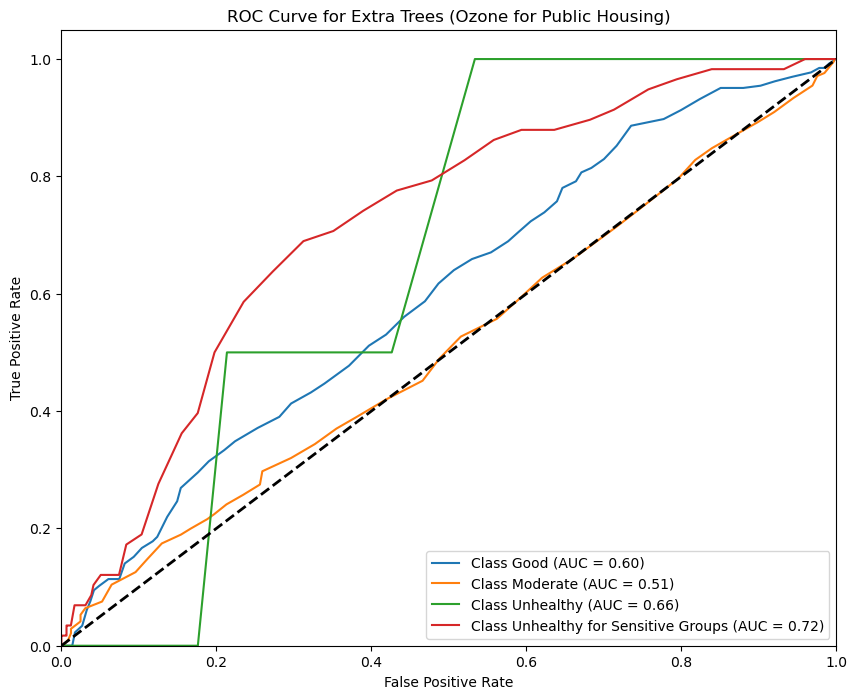


Stacking Classifier Validation Score: 0.7160714285714286
Stacking Classifier Cross-Validation Scores: [0.91536748 0.90512249 0.92160356 0.92561247 0.92156863]
Stacking Classifier Mean Cross-Validation Score: 0.9178549281628019
Stacking Classifier Test Accuracy: 0.7074041034790366

Classification Report for Stacking Classifier:
                                 precision    recall  f1-score   support

                          Good       0.48      0.25      0.33       264
                      Moderate       0.75      0.89      0.81       797
                     Unhealthy       0.00      0.00      0.00         2
Unhealthy for Sensitive Groups       0.47      0.29      0.36        58

                      accuracy                           0.71      1121
                     macro avg       0.42      0.36      0.38      1121
                  weighted avg       0.67      0.71      0.68      1121



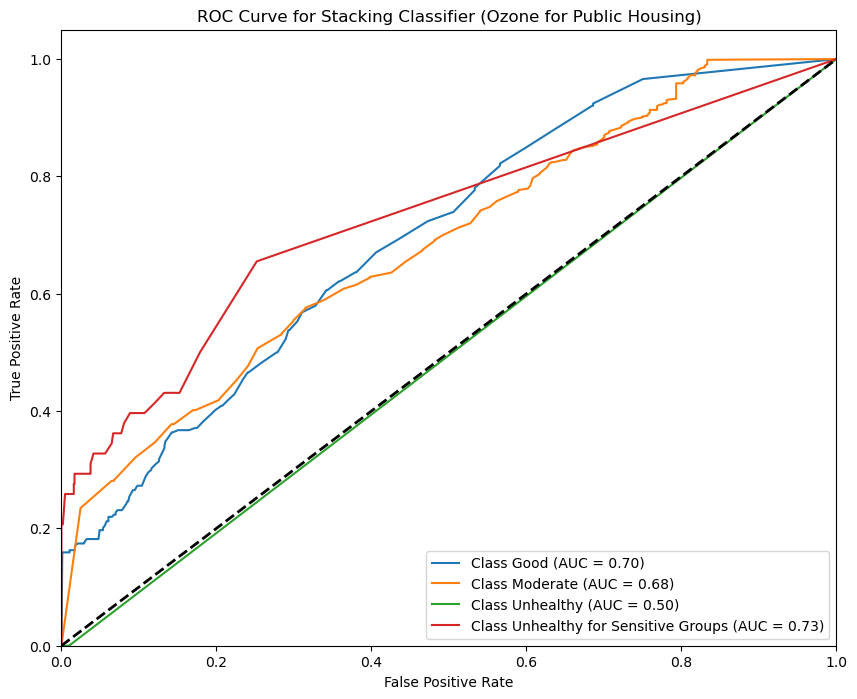

In [53]:
from sklearn.metrics import roc_curve, auc, classification_report, accuracy_score, confusion_matrix
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier, StackingClassifier
from imblearn.combine import SMOTETomek
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


def plot_roc_curve(model, X_test, y_test, label_encoder, model_name, target_name):
    """
    Plots the ROC curve for the given model and test data.
    """
    if hasattr(model, "predict_proba"):  # Check if model supports predict_proba
        y_proba = model.predict_proba(X_test)
        num_classes = y_proba.shape[1]
        
        plt.figure(figsize=(10, 8))
        for i in range(num_classes):
            fpr, tpr, _ = roc_curve(y_test == i, y_proba[:, i])
            roc_auc = auc(fpr, tpr)
            class_name = label_encoder.inverse_transform([i])[0]
            plt.plot(fpr, tpr, label=f"Class {class_name} (AUC = {roc_auc:.2f})")
        
        plt.plot([0, 1], [0, 1], 'k--', lw=2)
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(f"ROC Curve for {model_name} ({target_name})")
        plt.legend(loc="lower right")
        plt.show()
    else:
        print(f"{model_name} does not support probability-based ROC curve computation.")


def apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, target_name, label_encoder):
    print(f"\nResults for {target_name} Category Classification:\n")

    # Apply SMOTETomek to balance the training data
    smotetomek = SMOTETomek(random_state=42)
    X_train, y_train = smotetomek.fit_resample(X_train, y_train)
    
    models = {
        "Logistic Regression": Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', LogisticRegression(max_iter=500, C=1))
        ]),
        "Gradient Boosting": Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', GradientBoostingClassifier(n_estimators=50, learning_rate=0.1, random_state=42))
        ]),
        "Random Forest": Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', RandomForestClassifier(n_estimators=100, random_state=42))
        ]),
        "Extra Trees": Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', ExtraTreesClassifier(n_estimators=100, random_state=42))
        ])
    }

    # Apply each model
    for model_name, pipeline in models.items():
        pipeline.fit(X_train, y_train)
        
        # Validation score
        val_score = pipeline.score(X_val, y_val)
        print(f"{model_name} Validation Score: {val_score}")
        
        # Cross-validation
        cv_scores = cross_val_score(pipeline, X_train, y_train, cv=5)
        print(f"{model_name} Cross-Validation Scores: {cv_scores}")
        print(f"{model_name} Mean Cross-Validation Score: {np.mean(cv_scores)}")
        
        # Test accuracy, classification report, and ROC curve
        y_pred_test = pipeline.predict(X_test)
        test_score = accuracy_score(y_test, y_pred_test)
        print(f"{model_name} Test Accuracy: {test_score}")
        print(f"\nClassification Report for {model_name}:\n", classification_report(y_test, y_pred_test, labels=np.unique(y_test), target_names=label_encoder.inverse_transform(np.unique(y_test))))
        
        # Plot ROC Curve
        plot_roc_curve(pipeline.named_steps['classifier'], X_test, y_test, label_encoder, model_name, target_name)
stacking_clf = StackingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
        ('et', ExtraTreesClassifier(n_estimators=100, random_state=42)),
        (
    # Stacking Classifier
    stacking_clf = StackingClassifier(
        estimators=[
            ('rf', RandomForestClassifier(n_estimators=100, random_state=42)),
            ('et', ExtraTreesClassifier(n_estimators=100, random_state=42))
        ],
        final_estimator=RandomForestClassifier(n_estimators=100, random_state=42),
        cv=5
    )

    stacking_clf.fit(X_train, y_train)

    # Validation score for Stacking Classifier
    stacking_val_score = stacking_clf.score(X_val, y_val)
    print("\nStacking Classifier Validation Score:", stacking_val_score)

    # Cross-validation for Stacking Classifier
    stacking_cv_scores = cross_val_score(stacking_clf, X_train, y_train, cv=5)
    print("Stacking Classifier Cross-Validation Scores:", stacking_cv_scores)
    print("Stacking Classifier Mean Cross-Validation Score:", np.mean(stacking_cv_scores))

    # Test accuracy and ROC curve for Stacking Classifier
    y_pred_stacking = stacking_clf.predict(X_test)
    stacking_test_score = accuracy_score(y_test, y_pred_stacking)
    print("Stacking Classifier Test Accuracy:", stacking_test_score)
    print(f"\nClassification Report for Stacking Classifier:\n", classification_report(y_test, y_pred_stacking, labels=np.unique(y_test), target_names=label_encoder.inverse_transform(np.unique(y_test))))
    
    plot_roc_curve(stacking_clf, X_test, y_test, label_encoder, "Stacking Classifier", target_name)


# Run the function on each pollutant category and property type separately
for property_type in ['LIHTC', 'Public Housing']:
    for target, label_column in [('PM2.5', 'PM25_Category'), ('Ozone', 'OZONE_Category')]:
        print(f"\nAnalyzing {target} Category for {property_type}...\n")

        # Filter data by property type
        property_df = Spatial_df[Spatial_df['PropertyType'] == property_type]

        # Encode target labels
        le = LabelEncoder()
        property_df[f"{label_column}_Encoded"] = le.fit_transform(property_df[label_column])

        X = property_df[['PEOPCOLORPCT', 'LOWINCPCT', 'UNEMPPCT', 'UNDER5PCT', 'OVER64PCT', 'LIFEEXPPCT']]
        y = property_df[f"{label_column}_Encoded"]

        # Split data into train, validation, and test sets
        X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
        X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=42)
        
        # Apply models
        apply_models_with_validation(X_train, X_val, X_test, y_train, y_val, y_test, f"{target} for {property_type}", le)


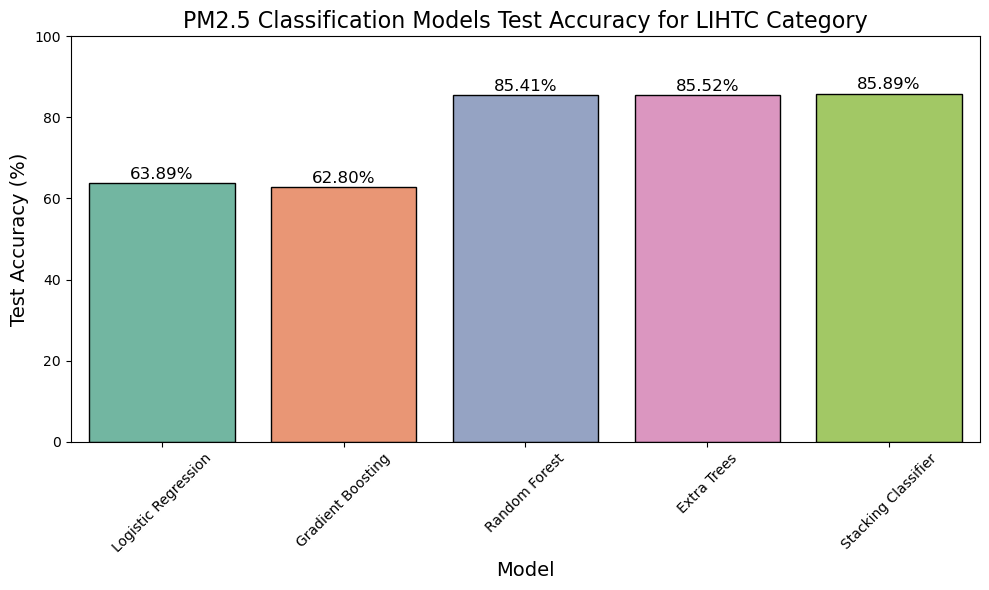

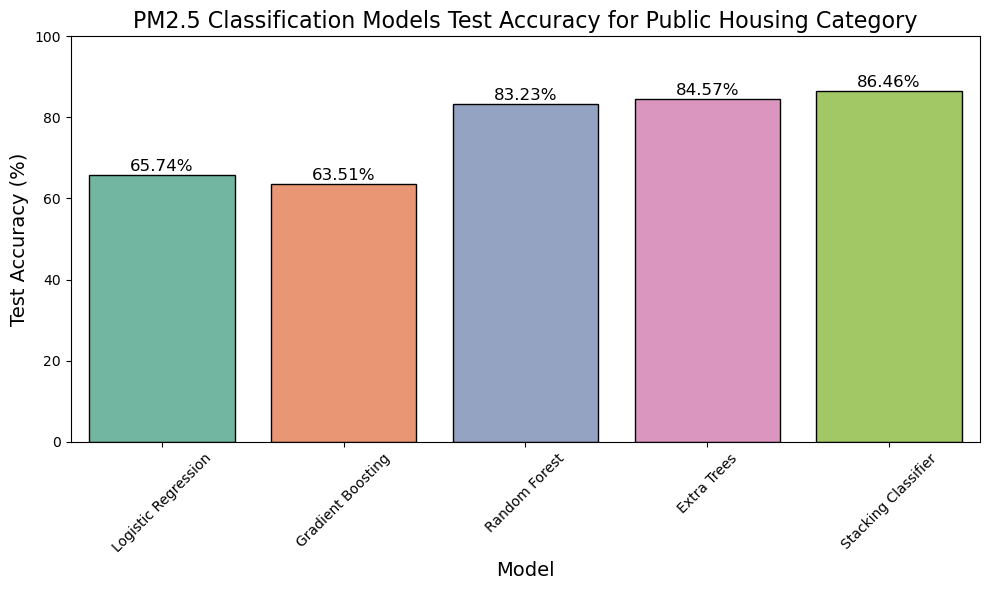

In [13]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
# Data for model accuracies
lihtc_PM25_accuracies = {
    "Model": ["Logistic Regression", "Gradient Boosting", "Random Forest", "Extra Trees", "Stacking Classifier"],
    "Accuracy": [63.89, 62.80, 85.41, 85.52, 85.89],
}
public_housing_PM25_accuracies = {
    "Model": ["Logistic Regression", "Gradient Boosting", "Random Forest", "Extra Trees", "Stacking Classifier"],
    "Accuracy": [65.74, 63.51, 83.23, 84.57, 86.46]
}

# Plotting function
def plot_accuracy_bar(data, title):
    plt.figure(figsize=(10, 6))
    sns.barplot(x="Model", y="Accuracy", data=data, hue="Model", palette="Set2", edgecolor='black', legend=False)

    plt.title(title, fontsize=16)
    plt.xlabel("Model", fontsize=14)
    plt.ylabel("Test Accuracy (%)", fontsize=14)
    plt.xticks(rotation=45)
    plt.ylim(0, 100)
    for index, value in enumerate(data["Accuracy"]):
        plt.text(index, value + 1, f"{value:.2f}%", ha='center', fontsize=12)
    plt.tight_layout()
    plt.show()

# Creating dataframes for plotting
lihtc_df = pd.DataFrame(lihtc_PM25_accuracies)
public_housing_df = pd.DataFrame(public_housing_PM25_accuracies)

# Plot for LIHTC
plot_accuracy_bar(lihtc_df, "PM2.5 Classification Models Test Accuracy for LIHTC Category")

# Plot for Public Housing
plot_accuracy_bar(public_housing_df, "PM2.5 Classification Models Test Accuracy for Public Housing Category")

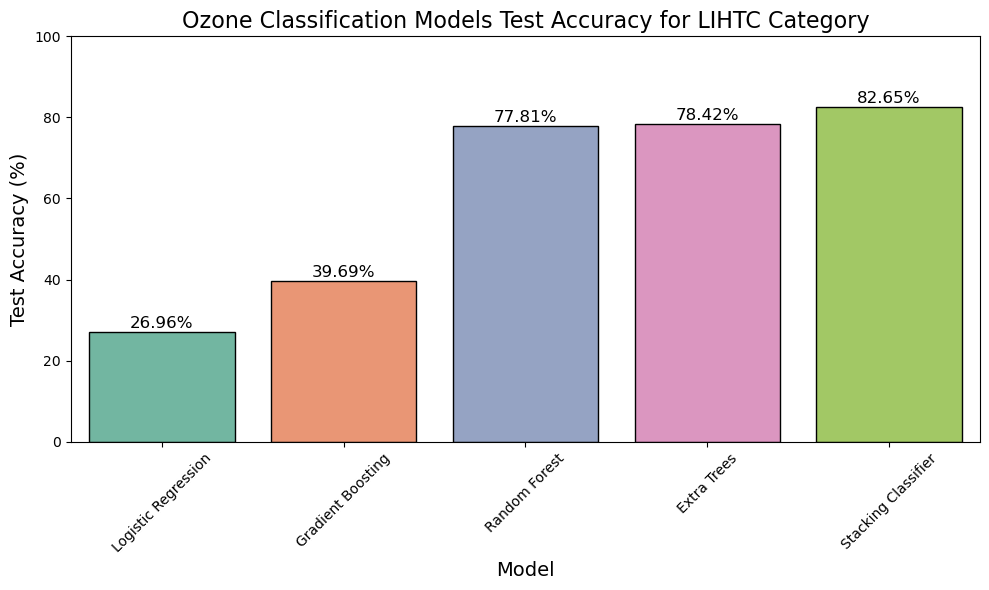

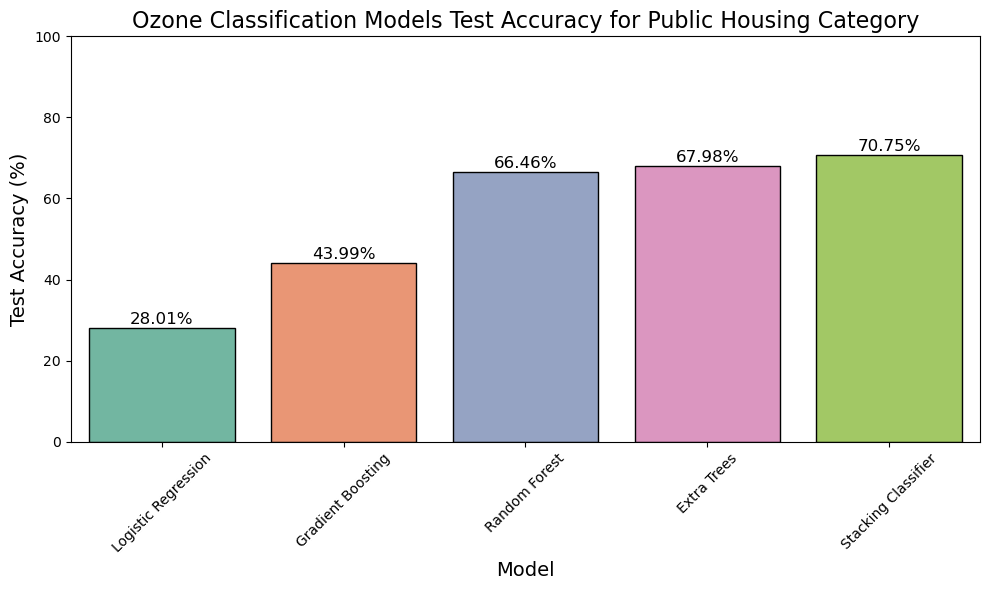

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns

# Data for LIHTC Category
lihtc_ozone_accuracies = {
    "Model": ["Logistic Regression", "Gradient Boosting", "Random Forest", "Extra Trees", "Stacking Classifier"],
    "Accuracy": [26.96, 39.69, 77.81, 78.42, 82.65]
}

# Data for Public Housing Category
public_housing_ozone_accuracies = {
    "Model": ["Logistic Regression", "Gradient Boosting", "Random Forest", "Extra Trees", "Stacking Classifier"],
    "Accuracy": [28.01, 43.99, 66.46, 67.98, 70.75]
}


# Plotting function
def plot_accuracy_bar(data, title):
    plt.figure(figsize=(10, 6))
    sns.barplot(x="Model", y="Accuracy", data=data, hue="Model", palette="Set2", edgecolor='black', legend=False)
    plt.title(title, fontsize=16)
    plt.xlabel("Model", fontsize=14)
    plt.ylabel("Test Accuracy (%)", fontsize=14)
    plt.xticks(rotation=45)
    plt.ylim(0, 100)
    for index, value in enumerate(data["Accuracy"]):
        plt.text(index, value + 1, f"{value:.2f}%", ha='center', fontsize=12)
    plt.tight_layout()
    plt.show()

# Creating dataframes for plotting
lihtc_df = pd.DataFrame(lihtc_ozone_accuracies)
public_housing_df = pd.DataFrame(public_housing_ozone_accuracies)

# Plot for LIHTC
plot_accuracy_bar(lihtc_df, "Ozone Classification Models Test Accuracy for LIHTC Category")

# Plot for Public Housing
plot_accuracy_bar(public_housing_df, "Ozone Classification Models Test Accuracy for Public Housing Category")


## Interpretation

**PM2.5 Classification for LIHTC Category:**


Logistic Regression: Achieved a test accuracy of 63.89%, indicating that the linear assumptions of logistic regression likely limited its effectiveness in capturing complex patterns within the data.
Gradient Boosting: Scored 62.80%, which is slightly lower than logistic regression, suggesting that boosting may have struggled to adapt to the data's underlying structure.
Random Forest and Extra Trees: Performed well, with accuracies of 85.41% and 85.52%, respectively. The ensemble nature and ability to capture non-linear relationships helped these models excel.
Stacking Classifier: Achieved the highest accuracy at 85.89%, suggesting that combining models with different strengths enhanced prediction by leveraging the diversity among model insights.

**PM2.5 Classification for Public Housing:**

Logistic Regression: Reached 65.74% accuracy, showing moderate performance but limited ability to capture complex patterns.
Gradient Boosting: Performed similarly poorly with 63.51% accuracy, indicating challenges in this context.
Random Forest and Extra Trees: Improved significantly, with accuracies of 82.23% and 84.57%, showing that tree-based methods are well-suited to this dataset.
Stacking Classifier: Achieved the best accuracy at 86.46%, demonstrating that the combination of models boosted performance through capturing complementary patterns.

**Ozone Classification for LIHTC Category:**

Logistic Regression and Gradient Boosting: Showed low accuracy, at 26.96% and 39.69%, suggesting that simpler and boosting models struggled with the ozone data’s complexity or potential class imbalance.
Random Forest and Extra Trees: Achieved accuracies of 77.81% and 78.42%, indicating that tree-based ensembles handled the complexity better.
Stacking Classifier: Scored the highest at 82.65%, highlighting the advantage of stacking models for challenging classification tasks.

**Ozone Classification for Public Housing:**

Logistic Regression and Gradient Boosting: Performed poorly, with 28.01% and 43.99% accuracy, reflecting difficulties with this category.
Random Forest and Extra Trees: Scored 66.46% and 67.98%, showing moderate performance but challenges with classification accuracy.
Stacking Classifier: Reached the highest accuracy at 70.75%, reinforcing that stacking helps when data is more complex or imbalanced.



